In [1]:
import os
import sys
sys.path.append('/home/kevinteng/Desktop/DE_Project')
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from coord_conv import CoordConv
import cv2
import utils
import utils_vis
import utils_model
from sklearn.model_selection import train_test_split
from utils_vis import plot_comparison

/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-package

---------------------

# Retrieving and Preprocess Data

Image size:  100


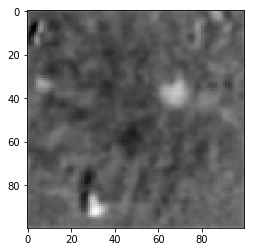

In [2]:
dataset = np.load('/home/kevinteng/Desktop//jpg_to_npy_benchmark/DG13_3-8-17_preprocessed_dF.npy')
NEW_SIZE = 100
#re_list = dataset
re_list = utils.resize(dataset, NEW_SIZE)
IMG_SIZE = re_list.shape[1]

print('Image size: ', IMG_SIZE)
#Dimension for network should include the color channel 
re_list = np.expand_dims(re_list, axis = -1)
#Cast data type to float32 for TensorFlow
# re_list = re_list.astype('float32')
re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)

for img in re_list:
    plt.imshow(np.reshape(img, (IMG_SIZE, IMG_SIZE)), cmap = 'gray')
    plt.show()
    
    break
    
#     if input()=='exit':
#         break

In [3]:
#apply min max norm for mean image
re_list = utils.min_max_norm(re_list)
#max_img_ori = np.expand_dims(max_img_ori, -1)
print('Max value:', np.max(re_list))
print('Min value:', np.min(re_list))


Max value: 1.0
Min value: 0.0


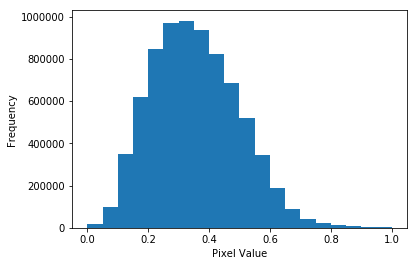

In [4]:
#plot historgram for min max norm image
plt.hist(tf.reshape(re_list, [-1]),20,[0,1])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

----------------------------------------------------------


# Helper Function

In [3]:
def create_ran_numbers(img_size):
    '''
    Function to create random coordinates 
    
    @param img_size: Image size 
    
    return:
    random generated x,y coordinates 
    '''
    c1=np.random.randint(img_size, size=1)
    c2=np.random.randint(img_size, size=1)
    c1=tf.convert_to_tensor( c1,dtype=None,dtype_hint=None,name=None)
    c2=tf.convert_to_tensor( c2,dtype=None,dtype_hint=None,name=None)
    return c1,c2

@tf.function
def create_tf_tilecords(coord_list, img_size):
    o1,o2=coord_list
    multiply=tf.constant([img_size*img_size])
    y1=tf.reshape(tf.tile(o1,multiply),[img_size,img_size,1])
    y2=tf.reshape(tf.tile(o2,multiply),[img_size,img_size,1])

    y=tf.concat((y1,y2),axis=2)

    return tf.dtypes.cast(y, tf.float32),tf.dtypes.cast(coord_list, tf.float32)

@tf.function
def tf_create_onehotcords(dat):
    o1,o2=dat
    y1=tf.one_hot(o1,100)
    y2=tf.one_hot(o2,100)
    y2=tf.transpose(y2)
    y=tf.math.multiply(y1,y2)
    #y=tf.transpose(y)
    return y

def create_dat_samples(n):
    '''
    Function to create stacks of coordinates, tiled coordinates, one hot images
    @param n: number of neurons
    '''
    ta = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    tb = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    coords = tf.TensorArray(tf.float32, size=0, dynamic_size = True)
    for _ in tf.range(n):
        dat=create_ran_numbers(img_size=100)
        b1,b2=create_tf_tilecords(dat, 100)
        c1=tf_create_onehotcords(dat)
        c1=tf.expand_dims(c1, axis=2, name=None)
        
        #tile coordinates
        ta = ta.write(_, b1/99)  #(n, img_size, img_size, 1)
        #one hot images
        tb = tb.write(_, c1) #(n, img_size, img_size, 1)
        #coordinates
        coords = coords.write(_, dat) #(n, 2, 1)
    return coords.stack(), ta.stack(),tb.stack()

def neuron_like_image(n_neurons):
    '''
    Function to paint neuron-like images
     @param n_neurons: number of neurons
    '''
    _,_,one_hot_imgs = create_dat_samples(n_neurons)
    stack_imgs = tf.reduce_sum(one_hot_imgs, axis = 0)
    return tf.expand_dims(stack_imgs, axis = 0) #(1, img_size, img_size, 1)

def stack4plot(one_hot_imgs):
    '''
    Functions to sum all one hot images along axis=0 for easy plot
    '''
    return tf.squeeze(tf.reduce_sum(one_hot_imgs, axis = 0))

---

# Validation

In [4]:
n_neurons = 40
img_size = 100
coords,_, ori_one_hot_imgs = create_dat_samples(n_neurons)
coords = tf.reshape(coords, [n_neurons, 1,1,2])
tf.print(tf.shape(coords))

[40 1 1 2]


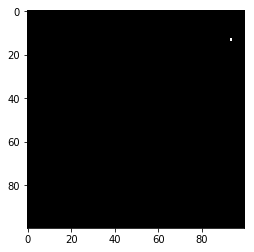

In [7]:
plt.imshow(tf.squeeze(ori_one_hot_imgs[0]), cmap = 'gray')

-----------------------------------

# Model

In [6]:
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, Reshape, MaxPooling2D, UpSampling2D
from tensorflow.keras.layers import InputLayer, Conv2DTranspose, Activation, BatchNormalization
from tensorflow.keras.layers import Input, Softmax
from tensorflow.keras.regularizers import l1
from utils_model import conv_block, coordconv_block, up_block, up_coord_block
from tensorflow.keras import layers

def encoder(inps, img_size):
    #1st block
    coord01 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                        filters = 32, kernel_size = 3, padding='same')(inps)
    leaky01 =tf.keras.layers.LeakyReLU(0.5)(coord01)
    coord02 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                        filters = 1, kernel_size = 3, padding='same')(leaky01)
    leaky02 = tf.keras.layers.LeakyReLU(0.5)(coord02)
    add01 = tf.keras.layers.Add()([leaky02, inps])
    
    #2nd block
    coord03 =  CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                      filters = 128, kernel_size = 3, padding='same')(add01)
    leaky03 = tf.keras.layers.LeakyReLU(0.5)(coord03)
    coord04 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                 filters = 1, kernel_size = 3, padding='same')(leaky03)
    leaky04 = tf.keras.layers.LeakyReLU(0.5)(coord04)
    add02 = tf.keras.layers.Add()([leaky04, add01])
    
    #3rd block
    coord05 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                    filters = 256, kernel_size = 3, padding='same')(add02)
    leaky05 = tf.keras.layers.LeakyReLU(0.5)(coord05)
    coord06 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                        filters = 1, kernel_size = 3, padding='same')(leaky05)
    leaky06 = tf.keras.layers.LeakyReLU(0.5)(coord06)
    add03 = tf.keras.layers.Add()([leaky06, add02])

    #4th block
    coord07 =CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                       filters = 128, kernel_size = 3, padding='same')(add03)
    leaky07 = tf.keras.layers.LeakyReLU(0.5)(coord07)
    coord08 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                 filters = 1, kernel_size = 3, padding='same')(leaky07)
    leaky08 = tf.keras.layers.LeakyReLU(0.5)(coord08)
    add04 =tf.keras.layers.Add()([leaky08, add03])
    
    #5th block
    coord09 =CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                       filters = 64, kernel_size = 3, padding='same')(add04)
    leaky09 = tf.keras.layers.LeakyReLU(0.5)(coord09)
    coord10=CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                 filters = 1, kernel_size = 3, padding='same')(leaky09)
    leaky10 = tf.keras.layers.LeakyReLU(0.5)(coord10)
    add05 = tf.keras.layers.Add()([leaky10, add04])
    
    #6th block
    coord11 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                    filters = 32, kernel_size = 3, padding='same')(add05)
    leaky11 = tf.keras.layers.LeakyReLU(0.5)(coord11)
    coord12 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                 filters = 1, kernel_size = 3, padding='same')(leaky11)
    leaky12 = tf.keras.layers.LeakyReLU(0.5)(coord12)
    add06 = tf.keras.layers.Add()([leaky12, coord11])
    output = Conv2D(1, kernel_size = 3,activation = 'sigmoid', padding='same')(add06)
    
    return output


def de_conv(input_tensor):
    coord01 = CoordConv(x_dim = 100, y_dim = 100, with_r = False, filters = 100,
              kernel_size = 1, padding='same', activation='relu')(input_tensor)
    conv01 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(coord01)
    conv02 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv01)
    conv03 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv02)
    conv04 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv03)
    conv05 = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = "same" )(conv04)
    f1 = Flatten()(conv05)
    output = Softmax(axis = -1)(f1)

    return output

def latent_space(encoded_imgs, deconv_imgs, coords, batch_size):
    '''
    This function construct the dot product of the output of an encoder(batch_size, img_size, img_size, 1) 
    with the one hot images generated by decoord-conv(n_neurons, img_size, img_size, 1), which yields
    similarity score (batch_size, n_neurons). Similarity score is then concatenate to the last layer of the 
    input coordinates with the corresponding batch (batch_size, n_neurons, 3)
    
    @encoded_imgs: output images from the encoder
    @deconv_imgs: one hot images generated from the coordinate list 
    @coords: A list of coordinates generated randomly based on the number of neurons
    @batch_size: Batch size of the input image for encoder, to allocate size for writing in loop
    
    return: 
        latent space with dim (batch_size, n_neurons, 3, 1)
    '''
    similarity_score = tf.tensordot(encoded_imgs, deconv_imgs, [[1,2,3],[1,2,3]]) #(batch_size, n_neurons)
    squeeze_coords = tf.squeeze(coords/(img_size-1)) #coords dim (n_neurons, 1, 1, 2) = > (n_neurons, 2)
    latent = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    for i in tf.range(batch_size):
        concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[i]), axis=-1)    
        latent = latent.write(i, concat) #(batch_size, n_neurons, 3)
    return tf.expand_dims(latent.stack(), axis = -1), similarity_score

def decoder(latent_dim, img_size):
    flat_01 = Flatten()(latent_dim)
    dense_01 = Dense(25*25*32, activation = 'relu')(flat_01)
    dense_01 = Reshape((25,25,32))(dense_01)
    up_01 = up_block(dense_01, up_size = 2, filters = 32, kernel_size = 3,
                            strides = 1, padding = 'same', activation = 'relu')
    up_02 = up_block(up_01, up_size = 2, filters = 64, kernel_size = 3,
                            strides = 1, padding = 'same', activation = 'relu')
    output = coordconv_block(up_02, x_dim = img_size, y_dim = img_size, 
                              filters = 1, kernel_size = 3, strides = 1,
                              padding = 'same', activation = None)
    return output

class learnable_coords(layers.Layer):
    def __init__(self, coords):
        super(learnable_coords, self).__init__()
        self.learned_coords = tf.Variable((coords), trainable = True)

    def __call__(self, img_size):
        y = self.learned_coords/(img_size-1) #normalize the coordinates
    #         y = tf.clip_by_value(y, clip_value_min=0, clip_value_max=1) #clip values
        return y
    
def dataset_parse(dataset_path, NEW_SIZE):
    dataset = np.load(dataset_path)
    #re_list = dataset
    re_list = utils.resize(dataset, NEW_SIZE)
    #Dimension for network should include the color channel 
    re_list = np.expand_dims(re_list, axis = -1)
    #Cast data type to float32 for TensorFlow
    # re_list = re_list.astype('float32')
    re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)
    
    return re_list

def stack4plot(one_hot_imgs):
    '''
    Functions to sum all one hot images along axis=0 for easy plot
    '''
    return tf.squeeze(tf.reduce_sum(one_hot_imgs, axis = 0))

In [9]:
# def encoder02(inps, img_size):
#     #1st block
#     coord01 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
#                         filters = 256, kernel_size = 3, padding='same')(inps)
#     leaky01 =tf.keras.layers.LeakyReLU(0.5)(coord01)
#     conv01 = Conv2D(filters = 128, kernel_size = 3, strides = 1, padding = "same", activation = 'relu')(leaky01 )
#     leaky02 = tf.keras.layers.LeakyReLU(0.5)(conv01)
#     output = Conv2D(1, kernel_size = 3,activation = 'linear', padding='same')(leaky02 )
#     return output

-----------------------------------------------------------------

## Build Model

In [10]:
#build encoder 
inps = Input(shape=(img_size, img_size, 1))
encoder_model = Model(inps, encoder(inps, img_size))

#build coord model
inp = Input(shape=(100, 100,2)) #(batch_size, img_size, img_size, 2)
de_coordconv = Model(inp, de_conv(inp))
de_coordconv.load_weights("best_class_model100_02.hdf5")

#decoder
latent_dim = Input(shape=(n_neurons, 3, 1))
decoder_model = Model(latent_dim, decoder(latent_dim, img_size))

#learnable coords
l_coords = learnable_coords(coords)

In [11]:
# encoder_model.summary()

## Train Model

--------------------------------------

In [12]:
lr=0.001
opt = tf.keras.optimizers.Adam(lr)
loss_fn = tf.losses.MeanSquaredError()

@tf.function
def train_fn(inp_imgs, coords, img_size, batch_size):
    with tf.GradientTape() as tape:
        #custom layer for updating coordinates
        updated_coords = l_coords(img_size)
        m1 = tf.constant([1,img_size,img_size,1], tf.int32) #multiplier for tiling 
        #tile coordinates
        tile_cd = tf.tile(updated_coords, m1)
        #de-coordconv model
        de_coordconv.trainable = False #freeze de-coordconv
        one_hot_imgs = tf.reshape(de_coordconv(tile_cd),[-1,img_size, img_size, 1]) #(n_neurons, img_size, img_size, 1)
        #output from encoder 
        encoder_output = encoder_model(inp_imgs)
        #latent space
        latent, similarity_score = latent_space(encoder_output, one_hot_imgs, coords, batch_size)#(batch_size, n_neurons, 3, 1)
        #reconstruction 
        reconstruction = decoder_model(latent)
        loss = loss_fn(inp_imgs, reconstruction)
        
    varis = encoder_model.trainable_variables + decoder_model.trainable_variables + l_coords.trainable_variables
    grad_model = tape.gradient(loss, varis)
#     grad_coords = tape.gradient(loss, l_coords.trainable_variables)
    opt.apply_gradients(zip(grad_model, varis))
#     opt.apply_gradients(zip(grad_coords, l_coords.trainable_variables))
    
    return loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction, grad_model 

In [13]:
# ds_dir = '/home/kevinteng/Desktop/jpg_to_npy_benchmark/'

# for d in sorted(os.listdir(ds_dir)):
#     merge_d = os.path.join(ds_dir+d)
#     imgs = dataset_parse(merge_d, 100)
#     break

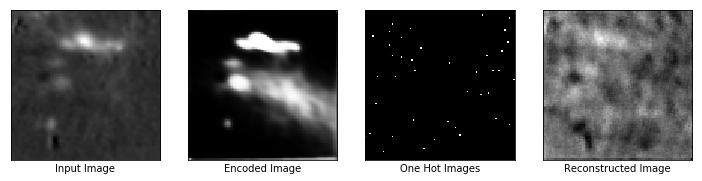

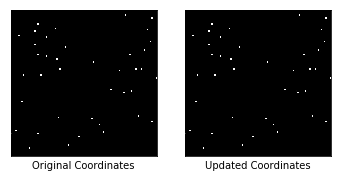

Epochs: 10, Loss: 0.005263791885226965
Similarity scores: [5.93453151e-05 2.57483423e-02 3.24271829e-03 1.28576785e-01
 1.56818688e-01 4.95587327e-02 5.75626700e-06 1.00850547e-03
 1.31930183e-05 5.70933372e-02 1.06308726e-03 1.29342824e-03
 7.70609558e-01 4.64674272e-02 1.38813618e-03 6.46009063e-03
 1.12792701e-02 4.38412786e-01 9.44972690e-03 2.22759739e-01
 3.66684544e-04 2.51059992e-05 1.09172746e-04 1.29501875e-02
 5.07144749e-01 7.50118226e-04 2.24087271e-04 1.11069586e-02
 2.93365955e-01 1.61394209e-03 3.64126444e-01 3.22252735e-02
 7.52836466e-01 5.60602546e-03 4.62598443e-01 2.22164653e-02
 5.59547663e-01 3.14895390e-03 6.51936163e-04 9.55117464e-01]
Updated Coordinates: [[[0.93931663 0.13137168]]]
Gradient min:-0.002871774137020111, max:0.0013500157510861754



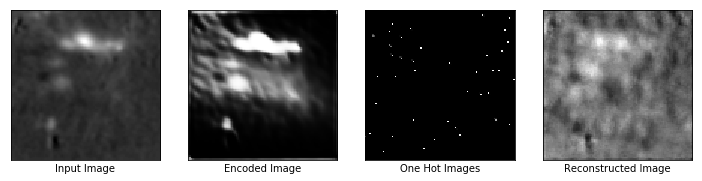

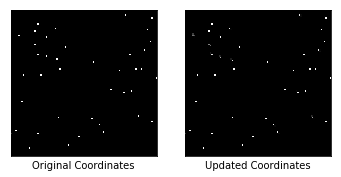

Epochs: 20, Loss: 0.003989837132394314
Similarity scores: [6.2240809e-03 5.4758012e-02 6.5173013e-03 6.3414775e-02 3.2048121e-01
 2.1264262e-02 1.3433947e-03 3.6562130e-02 6.2220474e-04 2.4796605e-02
 1.8498163e-01 2.1003814e-01 3.3956403e-01 3.8436705e-01 1.9643311e-01
 2.8128439e-01 2.4208987e-01 4.4832308e-02 8.8649824e-02 1.5148115e-01
 6.3793994e-03 1.3944271e-03 2.2823515e-03 2.5121009e-02 1.9408678e-01
 3.2940032e-03 5.3946632e-03 6.6623546e-02 3.0062324e-01 2.5772018e-02
 4.5128796e-01 6.3338213e-02 9.8885298e-01 1.2802096e-01 6.1496502e-01
 3.1001544e-01 4.6649121e-02 2.7268490e-01 4.7338754e-02 7.5588661e-01]
Updated Coordinates: [[[0.9390762  0.13141438]]]
Gradient min:-0.0016985777765512466, max:0.0005552938673645258



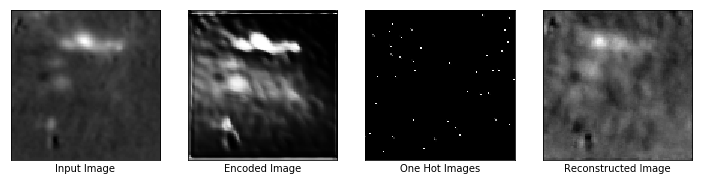

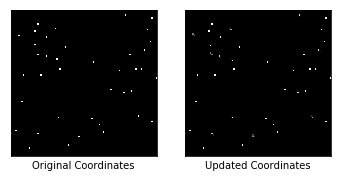

Epochs: 30, Loss: 0.004015210084617138
Similarity scores: [3.87439551e-03 4.01925631e-02 6.28546476e-02 1.59843072e-01
 1.77148983e-01 9.45176110e-02 1.61879454e-02 1.91081285e-01
 1.01565238e-04 8.04279521e-02 1.30968064e-01 8.07011425e-02
 2.12380469e-01 2.95429736e-01 1.14124596e-01 1.69544995e-01
 3.60074937e-01 7.50083923e-02 1.23784482e-01 3.16774547e-02
 2.71429517e-03 3.88837308e-02 3.55810560e-02 1.24453232e-01
 1.18253939e-01 4.49595004e-02 7.38782212e-02 4.18156497e-02
 2.02371210e-01 2.17349660e-02 3.66697758e-01 3.84960845e-02
 9.61062491e-01 9.29544941e-02 5.22076786e-01 4.88225311e-01
 7.87240267e-02 2.04109356e-01 1.91583447e-02 6.79354191e-01]
Updated Coordinates: [[[0.9394115  0.13134862]]]
Gradient min:-0.001472029252909124, max:0.00027819996466860175



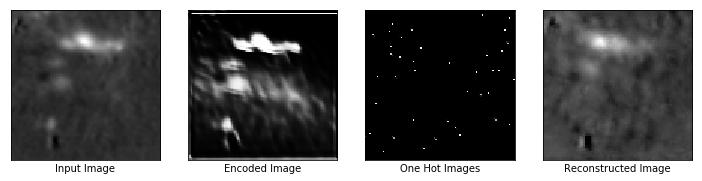

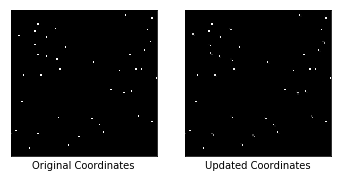

Epochs: 40, Loss: 0.003344788448885083
Similarity scores: [3.79997917e-04 1.98996812e-02 4.85372469e-02 1.36225790e-01
 3.80590446e-02 1.01779275e-01 8.94738268e-03 6.26577958e-02
 5.22699629e-05 7.90403634e-02 7.16064125e-03 7.71944411e-03
 2.81397492e-01 1.13463253e-01 2.32710764e-02 5.57200909e-02
 1.42247021e-01 9.68677402e-02 2.75487211e-02 2.42860126e-03
 4.09730186e-04 7.54731661e-03 4.93984111e-03 6.10275045e-02
 1.50400743e-01 4.17531803e-02 2.75994260e-02 7.87389092e-03
 1.17630854e-01 6.12769416e-03 3.05106550e-01 1.60076246e-02
 9.77304697e-01 1.28578590e-02 5.07853687e-01 7.42125332e-01
 1.92541957e-01 2.78589278e-02 2.30072765e-03 6.69907510e-01]
Updated Coordinates: [[[0.9391848  0.13128582]]]
Gradient min:-0.0010409189853817225, max:0.0004405456711538136



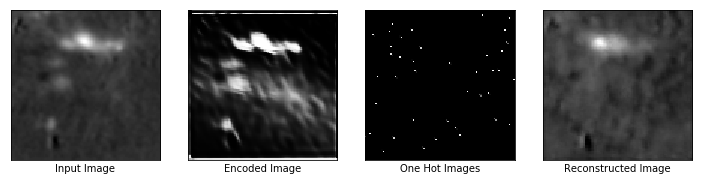

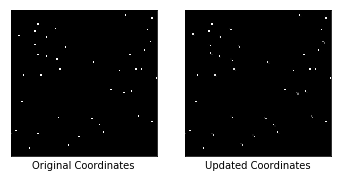

Epochs: 50, Loss: 0.003248586319386959
Similarity scores: [3.0111107e-03 7.4507616e-02 4.5013875e-02 1.6173798e-01 6.4527616e-02
 1.4138570e-01 4.3546641e-03 3.6813252e-02 3.2782005e-04 9.6918337e-02
 8.0830818e-03 8.4136492e-03 3.7822947e-01 9.4071038e-02 1.8373549e-02
 3.7691705e-02 1.0422664e-01 1.8599471e-01 2.3820451e-02 5.7901992e-03
 3.1541900e-03 6.2880390e-03 5.8087264e-03 4.3016132e-02 2.3844768e-01
 3.1474311e-02 1.6838852e-02 2.6151765e-02 1.7669822e-01 3.1451084e-02
 1.7435394e-01 4.2006910e-02 9.5468736e-01 8.7956395e-03 5.4234731e-01
 2.6809901e-01 3.8086703e-01 3.3800226e-02 1.8552451e-03 6.7614830e-01]
Updated Coordinates: [[[0.9380916  0.13168468]]]
Gradient min:-0.0012955793645232916, max:0.00023881703964434564



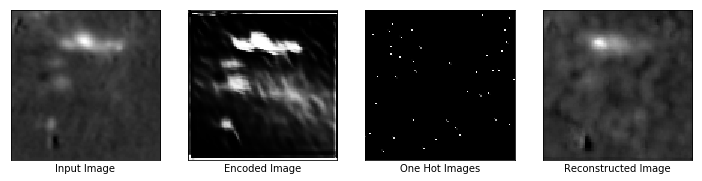

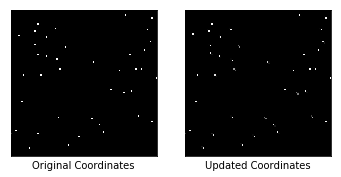

Epochs: 60, Loss: 0.003641024697571993
Similarity scores: [3.6735104e-03 7.3087864e-02 1.9866940e-02 1.0869625e-01 5.2264642e-02
 7.7195689e-02 2.6192821e-03 8.3995881e-03 4.1192924e-03 6.3171804e-02
 3.4109135e-03 5.1982659e-03 4.0416512e-01 5.2975655e-02 1.1429778e-02
 2.9293105e-02 3.5573404e-02 1.7761417e-01 8.5021798e-03 2.0820729e-03
 3.5270834e-03 9.2309283e-04 1.1446603e-03 1.4893951e-02 2.9717994e-01
 1.2675386e-02 3.4033756e-03 1.8367175e-02 2.0033948e-01 4.2492896e-02
 1.2291871e-01 4.5401294e-02 9.6650505e-01 3.2493253e-03 4.9969119e-01
 4.9545281e-02 3.6890429e-01 1.4464532e-02 1.0265615e-03 6.8672025e-01]
Updated Coordinates: [[[0.93727064 0.13169166]]]
Gradient min:-0.0026339245960116386, max:0.0005574681563302875



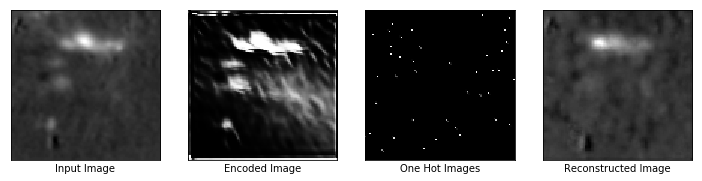

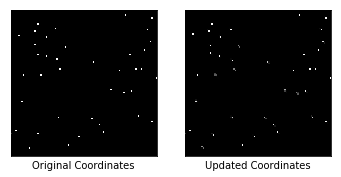

Epochs: 70, Loss: 0.003057722467929125
Similarity scores: [2.54163202e-02 2.19589919e-01 2.00440530e-02 1.10946938e-01
 8.62114355e-02 1.08449027e-01 2.99557950e-03 4.17437963e-03
 1.62188150e-03 6.55269399e-02 2.86780111e-03 9.76702757e-03
 4.98563081e-01 4.34206352e-02 1.71466526e-02 3.99399661e-02
 1.82393380e-02 2.81813383e-01 5.36357705e-03 2.36440403e-03
 3.31662372e-02 5.82128298e-04 3.89392429e-04 1.21509265e-02
 4.19124216e-01 1.18224071e-02 1.77446916e-03 9.54376459e-02
 3.61805916e-01 2.83281356e-01 1.12492315e-01 1.40589938e-01
 9.75133359e-01 2.95458874e-03 5.85121810e-01 1.11271277e-01
 5.32806158e-01 1.32307615e-02 2.33208388e-03 7.56539702e-01]
Updated Coordinates: [[[0.9366537  0.13091734]]]
Gradient min:-0.0017278084997087717, max:8.187226194422692e-05



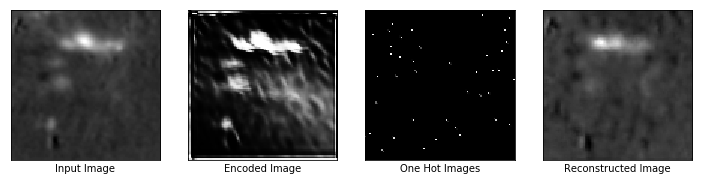

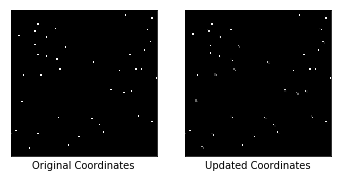

Epochs: 80, Loss: 0.0028989282436668873
Similarity scores: [5.52458726e-02 2.62197524e-01 4.51414026e-02 1.45700738e-01
 1.11350067e-01 1.48481116e-01 5.56928106e-04 1.41725540e-02
 4.54397546e-03 9.17792395e-02 3.41647584e-03 1.59190558e-02
 4.98279482e-01 6.65697381e-02 2.23456752e-02 4.75461483e-02
 3.80739495e-02 2.87386626e-01 1.02532906e-02 1.01444987e-03
 4.47934233e-02 2.67861411e-03 2.34083110e-03 3.19475420e-02
 3.99902403e-01 2.77895238e-02 6.83842879e-03 1.09403022e-01
 3.80158901e-01 2.79354900e-01 1.21205404e-01 1.61998749e-01
 9.54502583e-01 5.76708838e-03 6.07521355e-01 3.44465107e-01
 5.59523761e-01 1.91782974e-02 4.65982268e-03 6.87300265e-01]
Updated Coordinates: [[[0.9365385  0.13089581]]]
Gradient min:-0.0012567146914079785, max:0.000393390073440969



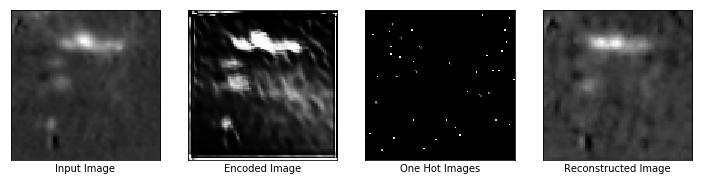

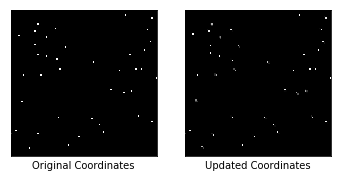

Epochs: 90, Loss: 0.002760550705716014
Similarity scores: [5.1909100e-02 1.7819497e-01 5.1546719e-02 1.4101648e-01 9.9297963e-02
 1.3361742e-01 1.9669443e-04 1.9520279e-02 6.1812606e-03 9.0046994e-02
 4.3066521e-03 2.0620435e-02 3.9438495e-01 7.5162217e-02 2.4636639e-02
 5.0670754e-02 5.1545322e-02 2.3523547e-01 1.4028664e-02 9.7783573e-04
 3.6169708e-02 5.2503906e-03 8.8312533e-03 3.7707511e-02 3.3858085e-01
 2.8694844e-02 1.0976612e-02 8.8951461e-02 3.6022487e-01 2.1836588e-01
 1.3348603e-01 1.1730307e-01 9.4071615e-01 7.5174263e-03 5.6611538e-01
 2.9669094e-01 4.7569367e-01 2.1096563e-02 6.2731244e-03 6.2173176e-01]
Updated Coordinates: [[[0.93664026 0.1312853 ]]]
Gradient min:-0.000768647703807801, max:0.0007632288616150618



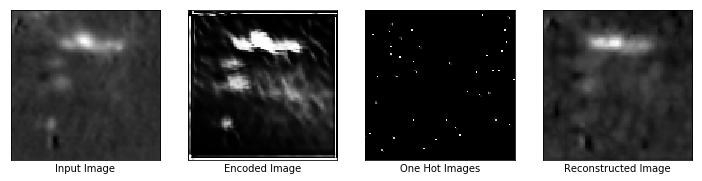

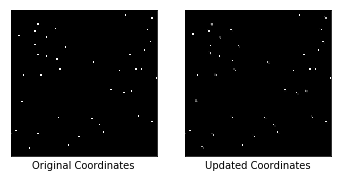

Epochs: 100, Loss: 0.0024813914205878973
Similarity scores: [0.02911231 0.13198023 0.02542704 0.10188331 0.06940512 0.07421941
 0.00105751 0.01400141 0.00290641 0.05325451 0.00230321 0.01892816
 0.34693077 0.07675144 0.02657129 0.06017317 0.04623681 0.13968328
 0.00956457 0.00095617 0.01948823 0.002253   0.0065724  0.02563664
 0.28388456 0.014667   0.0051824  0.03170498 0.30006108 0.22884287
 0.17052856 0.08100735 0.9256342  0.00643699 0.6706753  0.03406444
 0.25623494 0.02032537 0.00616095 0.61235374]
Updated Coordinates: [[[0.93687594 0.13156518]]]
Gradient min:-0.0013460901100188494, max:0.00023887059069238603



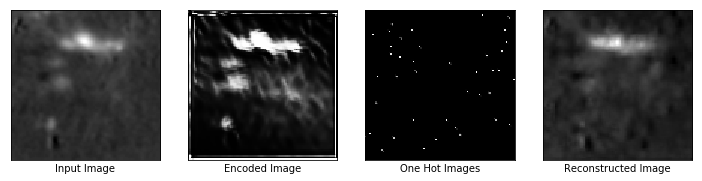

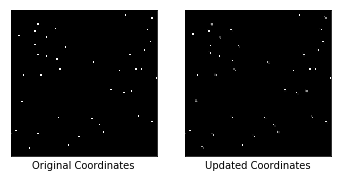

Epochs: 110, Loss: 0.002178529277443886
Similarity scores: [0.03690556 0.12323107 0.028375   0.10688182 0.08441838 0.07387022
 0.00128259 0.01523034 0.00391367 0.04983734 0.0035472  0.03596875
 0.3113996  0.12286155 0.04051699 0.09896925 0.06925379 0.11603205
 0.01403786 0.00107056 0.01764294 0.00292243 0.00926969 0.02278346
 0.24596773 0.01605852 0.00671268 0.02989248 0.29879287 0.22669111
 0.18726315 0.07808153 0.93602735 0.00972811 0.6387155  0.04850371
 0.19909173 0.03740644 0.01101964 0.6202222 ]
Updated Coordinates: [[[0.93675923 0.1313534 ]]]
Gradient min:-0.0006700213416479528, max:0.0002591763623058796



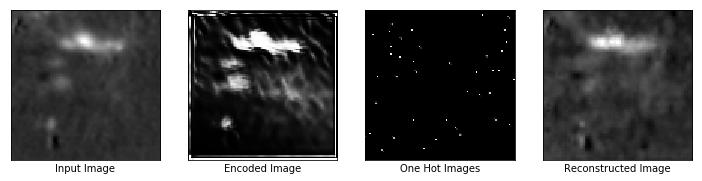

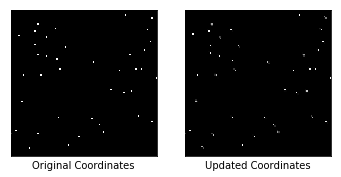

Epochs: 120, Loss: 0.002103071892634034
Similarity scores: [0.06271025 0.18448402 0.02419569 0.10631067 0.08526996 0.0759495
 0.01209308 0.01168152 0.04045558 0.04803866 0.00648614 0.04020047
 0.33515665 0.10030119 0.0453168  0.10799605 0.05480687 0.14022696
 0.01065231 0.00266053 0.03369013 0.00213745 0.00743731 0.01843549
 0.28813064 0.01307716 0.00508147 0.05800584 0.32840347 0.27325773
 0.15078638 0.10588484 0.8649119  0.009309   0.65363365 0.03733546
 0.2574108  0.03824519 0.01189685 0.6273466 ]
Updated Coordinates: [[[0.9354446  0.13026552]]]
Gradient min:-0.0006036663544364274, max:0.0001972794416360557



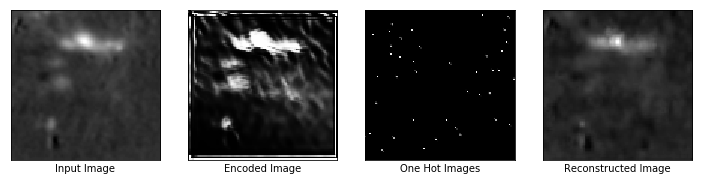

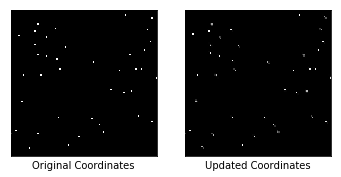

Epochs: 130, Loss: 0.0020584193989634514
Similarity scores: [0.07460324 0.21619634 0.02299082 0.09738643 0.09178331 0.0714471
 0.02610342 0.010066   0.07686148 0.04175736 0.00681951 0.05090629
 0.30794522 0.11418095 0.05618363 0.13691445 0.05624075 0.12645054
 0.00867593 0.00575078 0.04833426 0.00176333 0.00694609 0.01712931
 0.28195983 0.0119675  0.00425489 0.0628306  0.3647034  0.36339623
 0.12012696 0.12552173 0.9256816  0.00948598 0.6820541  0.01733387
 0.21446694 0.03990963 0.01479539 0.64076227]
Updated Coordinates: [[[0.9335947  0.12950559]]]
Gradient min:-0.0007800674065947533, max:5.236790457274765e-05



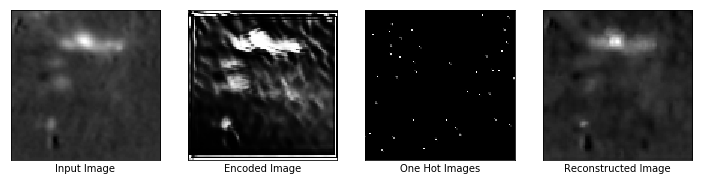

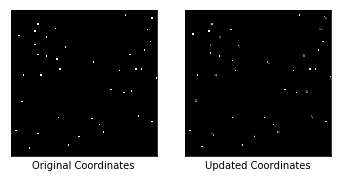

Epochs: 140, Loss: 0.00216490775346756
Similarity scores: [0.1097298  0.23596676 0.03020146 0.0992859  0.10675739 0.08626611
 0.02293049 0.01209935 0.06561089 0.04824801 0.00886197 0.06257536
 0.30630463 0.11916854 0.07803714 0.16898392 0.05441052 0.14088377
 0.00854871 0.00257586 0.07067863 0.00166193 0.00733896 0.01604383
 0.31165197 0.01892737 0.00544056 0.07673372 0.42184654 0.4182334
 0.12206906 0.14853309 0.97581464 0.01163216 0.6167986  0.0415697
 0.2178559  0.05325031 0.01927719 0.6015983 ]
Updated Coordinates: [[[0.9336306  0.12939918]]]
Gradient min:-0.0008755679591558874, max:7.377129804808646e-05



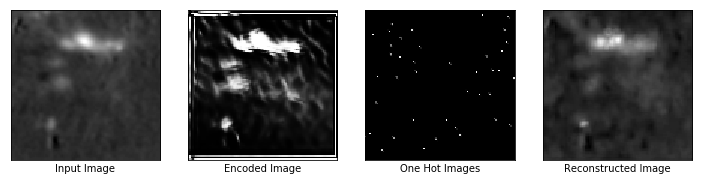

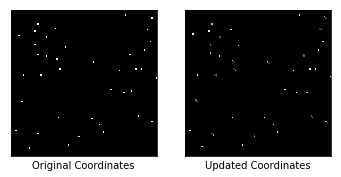

Epochs: 150, Loss: 0.002667793771252036
Similarity scores: [3.17634791e-02 1.07194304e-01 3.23179364e-02 9.24676061e-02
 1.08703256e-01 7.09601566e-02 1.06023496e-03 1.60300359e-02
 1.99410459e-03 3.60813811e-02 8.53547594e-04 4.14215699e-02
 2.34222353e-01 1.13060474e-01 5.01092114e-02 1.41779765e-01
 7.14379475e-02 8.75557140e-02 8.99821054e-03 1.23224687e-03
 2.46972740e-02 1.89478754e-03 2.06956603e-02 2.00625900e-02
 2.19528735e-01 1.74744632e-02 5.26173599e-03 4.18435335e-02
 3.73286873e-01 1.68591172e-01 1.08687475e-01 8.58689845e-02
 9.98032153e-01 8.42498522e-03 5.21880388e-01 1.36524439e-01
 1.18168294e-01 2.56326646e-02 1.52612841e-02 5.67537010e-01]
Updated Coordinates: [[[0.93368393 0.12934636]]]
Gradient min:-0.0016214065253734589, max:0.0026709053199738264



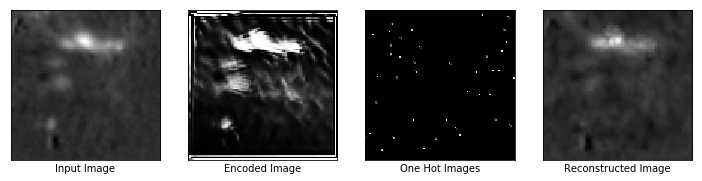

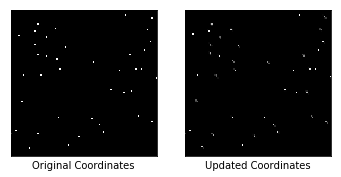

Epochs: 160, Loss: 0.0020296864677220583
Similarity scores: [0.07241447 0.16444898 0.03309479 0.1003656  0.10560092 0.06342679
 0.00425012 0.02611746 0.26104823 0.04708331 0.0049042  0.07688021
 0.24010596 0.13680631 0.08471551 0.17936178 0.09117062 0.09817383
 0.01888406 0.00123563 0.04463874 0.00350295 0.04910145 0.03140005
 0.22333455 0.02490209 0.00706398 0.05528237 0.3387783  0.35941535
 0.18986137 0.12030353 0.9938221  0.01896622 0.45894215 0.07689896
 0.14380033 0.06960665 0.03102917 0.536857  ]
Updated Coordinates: [[[0.93284374 0.12939563]]]
Gradient min:-0.00030761933885514736, max:0.0010803252225741744



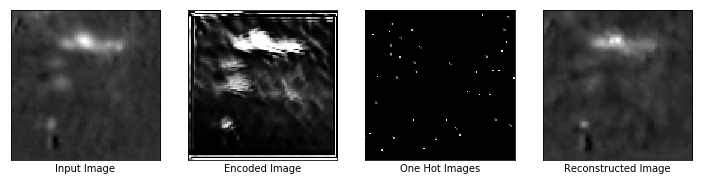

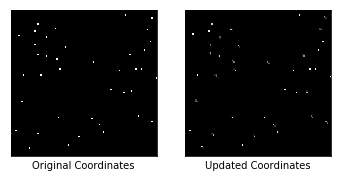

Epochs: 170, Loss: 0.0018100825836881995
Similarity scores: [0.08842373 0.15584323 0.02828883 0.09263775 0.12927105 0.05782051
 0.00984994 0.02538637 0.2906894  0.04126259 0.01541825 0.10060488
 0.24948819 0.15737437 0.1166231  0.19066417 0.08405043 0.09315412
 0.02091307 0.00127202 0.06162686 0.00302291 0.07676192 0.03668348
 0.21335444 0.02061734 0.00677628 0.08084328 0.31662938 0.22405113
 0.2007861  0.11624987 0.9939014  0.0229627  0.49491465 0.15940607
 0.11534602 0.07536975 0.03923253 0.5286145 ]
Updated Coordinates: [[[0.93269086 0.1292852 ]]]
Gradient min:-0.00041643582517281175, max:0.000426217244239524



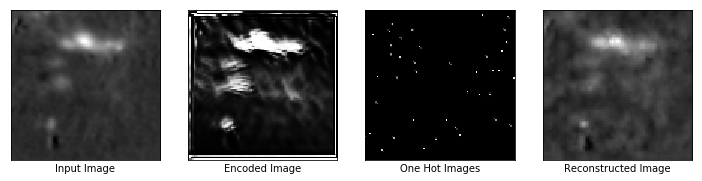

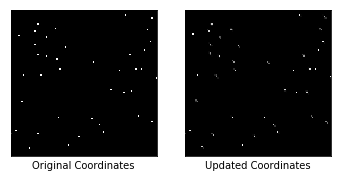

Epochs: 180, Loss: 0.0022202185355126858
Similarity scores: [0.02415914 0.0784922  0.03460921 0.10706467 0.08463086 0.06909158
 0.00513544 0.03566385 0.08035062 0.04306109 0.01634931 0.046843
 0.21721227 0.1401172  0.11238983 0.14665847 0.09338478 0.07493904
 0.0241196  0.00122911 0.01906896 0.00657571 0.07457252 0.05131195
 0.15676935 0.03023093 0.01172174 0.02950637 0.2355128  0.08358398
 0.16410653 0.06062832 0.9959608  0.01709974 0.53587776 0.20674753
 0.06432828 0.04780196 0.02350854 0.4987671 ]
Updated Coordinates: [[[0.93301994 0.12891626]]]
Gradient min:-0.0006651143776252866, max:0.0007516416953876615



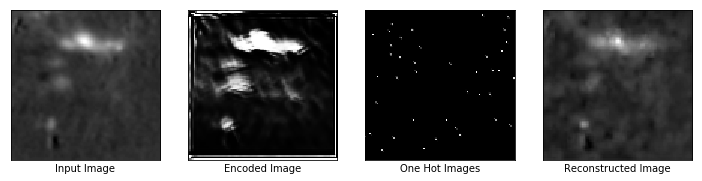

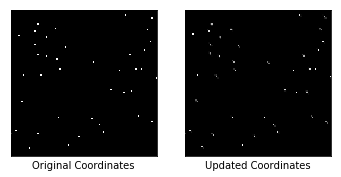

Epochs: 190, Loss: 0.0025369166396558285
Similarity scores: [0.00913488 0.04354763 0.02109798 0.07417526 0.05341847 0.03900254
 0.00150475 0.04295732 0.09910009 0.02305281 0.00630873 0.05127709
 0.13053794 0.12567921 0.10270426 0.15681772 0.12512557 0.03141153
 0.02043685 0.00122058 0.0081771  0.00483003 0.05807354 0.0510877
 0.07828508 0.02220434 0.00769959 0.01652545 0.14579749 0.03520335
 0.13614495 0.02493191 0.9932071  0.01604977 0.4742909  0.25022712
 0.03827753 0.05645226 0.0171905  0.39742133]
Updated Coordinates: [[[0.9329222  0.12891693]]]
Gradient min:-0.0019963751547038555, max:0.0006670704460702837



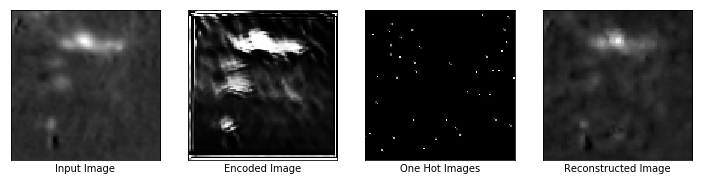

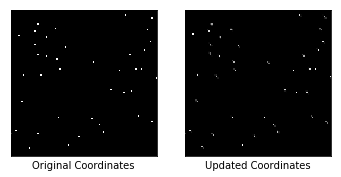

Epochs: 200, Loss: 0.0019239328103139997
Similarity scores: [0.01375935 0.05460092 0.03875033 0.09141235 0.06165397 0.06387512
 0.00609589 0.05828137 0.0924257  0.04947685 0.00342991 0.0669793
 0.16182265 0.16046394 0.1309561  0.23347342 0.18394008 0.05429281
 0.02980145 0.00118949 0.01684792 0.00621756 0.17934349 0.07905519
 0.10174962 0.03918007 0.01511549 0.02657741 0.19802046 0.08828099
 0.23996726 0.04559625 0.99353504 0.02263807 0.45118812 0.22273101
 0.05191549 0.07972102 0.04223941 0.4479178 ]
Updated Coordinates: [[[0.93279344 0.12877624]]]
Gradient min:-0.0004542329697869718, max:0.0004026040551252663



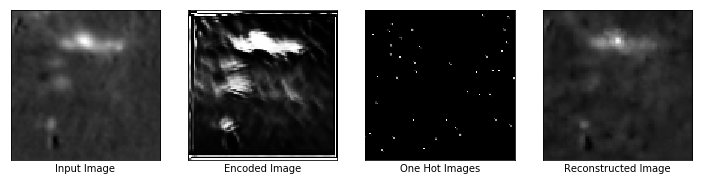

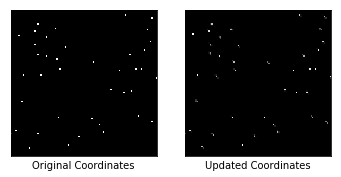

Epochs: 210, Loss: 0.001964283175766468
Similarity scores: [0.01128085 0.04791642 0.04239369 0.10118345 0.06223343 0.05759548
 0.00432242 0.06640898 0.00539489 0.04215311 0.00571624 0.05449703
 0.15689787 0.1476252  0.12698033 0.1748708  0.17062914 0.05085183
 0.02678442 0.00112661 0.01039714 0.00904178 0.12652516 0.06308497
 0.10298105 0.0399184  0.01760834 0.01721115 0.19790357 0.09186353
 0.18181786 0.0412361  0.9945429  0.01906773 0.46523157 0.34099007
 0.04286307 0.07340606 0.02470068 0.44490355]
Updated Coordinates: [[[0.93248457 0.12880483]]]
Gradient min:-0.0004345836932770908, max:0.0002026593720074743



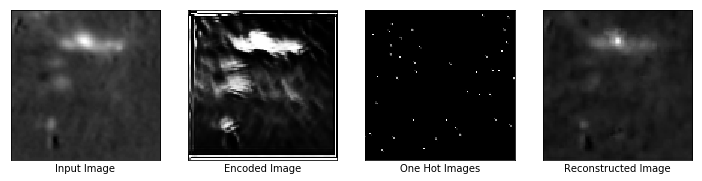

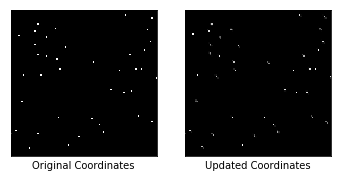

Epochs: 220, Loss: 0.0018087021308019757
Similarity scores: [0.0071533  0.04326482 0.05127618 0.11150561 0.05611827 0.06456815
 0.00375433 0.07474792 0.00504161 0.04801521 0.00273723 0.04968286
 0.1489165  0.1504539  0.13368781 0.17900462 0.20843324 0.05603078
 0.02550087 0.00112643 0.00744134 0.01087737 0.11484949 0.10386135
 0.09190539 0.05348953 0.02165234 0.01118278 0.17709528 0.08656835
 0.18302932 0.03348011 0.9928452  0.02004989 0.4619867  0.3374666
 0.03570178 0.08068106 0.0216857  0.43120635]
Updated Coordinates: [[[0.9325017 0.1286731]]]
Gradient min:-0.0005459370440803468, max:0.0003486913919914514



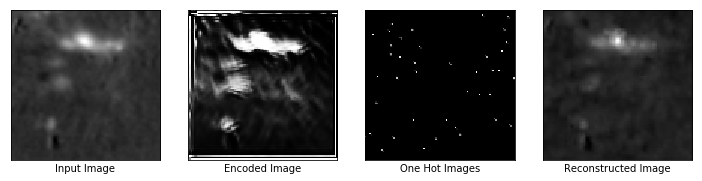

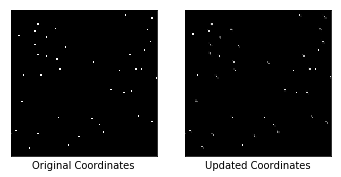

Epochs: 230, Loss: 0.0017698127776384354
Similarity scores: [0.00738843 0.04504354 0.05543386 0.12261472 0.04725033 0.07552119
 0.00122449 0.07408428 0.00930458 0.04874705 0.00246641 0.04498896
 0.14600684 0.15608893 0.10903224 0.16763479 0.21837524 0.06028584
 0.03284384 0.00112657 0.00588979 0.01495606 0.09282275 0.20489599
 0.09184427 0.06059247 0.0259194  0.01070914 0.17451505 0.06506183
 0.18751465 0.03646077 0.99071574 0.01858956 0.44295663 0.40310565
 0.04394657 0.07726447 0.02091077 0.42694372]
Updated Coordinates: [[[0.932478   0.12843949]]]
Gradient min:-0.0005181238520890474, max:0.00033943785820156336



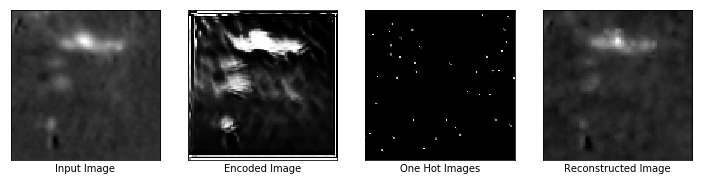

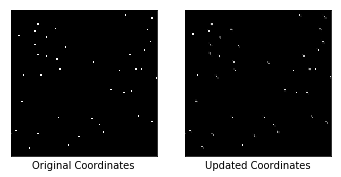

Epochs: 240, Loss: 0.0017536382656544447
Similarity scores: [0.00816653 0.03855417 0.0524648  0.11362416 0.05110613 0.06678039
 0.00215812 0.0557675  0.01724069 0.04722295 0.00522183 0.05774653
 0.1449     0.17993091 0.13329972 0.21333872 0.20522355 0.0555461
 0.0393357  0.00112604 0.00705995 0.01025256 0.06553838 0.1006062
 0.08662428 0.05218592 0.02236057 0.01367751 0.16341613 0.08986764
 0.19093175 0.03301271 0.9931767  0.02413779 0.51391125 0.452687
 0.05098593 0.07104696 0.02907988 0.4202794 ]
Updated Coordinates: [[[0.93236804 0.12824433]]]
Gradient min:-0.0005923394346609712, max:0.0005814980831928551



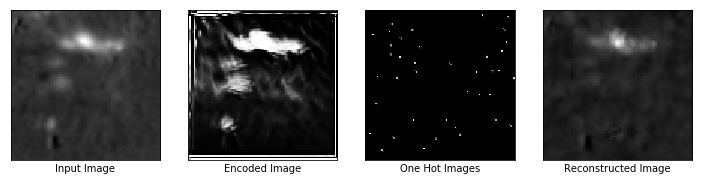

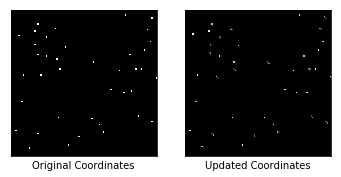

Epochs: 250, Loss: 0.0017468822188675404
Similarity scores: [8.9342734e-03 4.5864645e-02 3.7729468e-02 9.0969540e-02 8.2274422e-02
 4.8341837e-02 1.6706242e-03 4.8980180e-02 6.7906505e-03 3.6956508e-02
 7.8972406e-04 5.5602811e-02 1.4556949e-01 1.5902120e-01 1.1946500e-01
 2.1114945e-01 2.1125469e-01 4.9269848e-02 3.6770251e-02 1.1257454e-03
 6.8227910e-03 6.5389178e-03 8.7926753e-02 1.1138195e-01 8.4469482e-02
 4.3983672e-02 1.5345344e-02 1.4487917e-02 1.4396887e-01 7.9022281e-02
 2.1406600e-01 3.4130331e-02 9.8746806e-01 2.0617303e-02 4.4145831e-01
 4.7364047e-01 4.8127480e-02 7.4975342e-02 2.9294055e-02 3.9716744e-01]
Updated Coordinates: [[[0.93241733 0.12785216]]]
Gradient min:-0.0012374859070405364, max:0.00012319721281528473



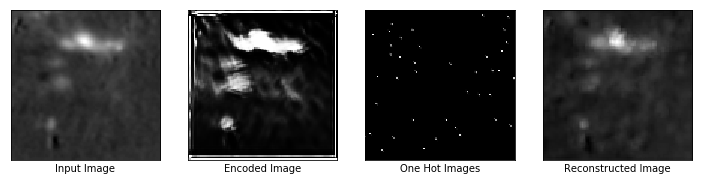

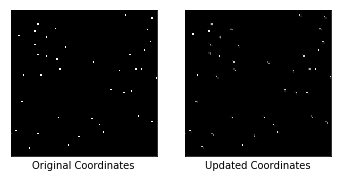

Epochs: 260, Loss: 0.001847838400863111
Similarity scores: [6.6902903e-03 3.7416805e-02 3.3927225e-02 8.9299321e-02 4.6325982e-02
 4.8709501e-02 1.1117560e-04 3.3348478e-02 2.8068322e-04 2.9884778e-02
 1.0367173e-03 3.9466139e-02 1.3341075e-01 1.9153744e-01 9.1417409e-02
 2.0529598e-01 1.9000587e-01 4.2046521e-02 3.0495992e-02 1.1247441e-03
 4.9649780e-03 6.5581864e-03 1.0573416e-01 9.8425068e-02 6.9734648e-02
 3.0012123e-02 1.1647435e-02 6.3109533e-03 1.5261792e-01 3.7486721e-02
 1.4763673e-01 2.8918291e-02 9.9210334e-01 1.6199499e-02 5.4416275e-01
 3.0470955e-01 6.1844125e-02 5.7142992e-02 2.1747462e-02 4.2379192e-01]
Updated Coordinates: [[[0.9320174  0.12805296]]]
Gradient min:-0.0014434235636144876, max:0.0001565079001011327



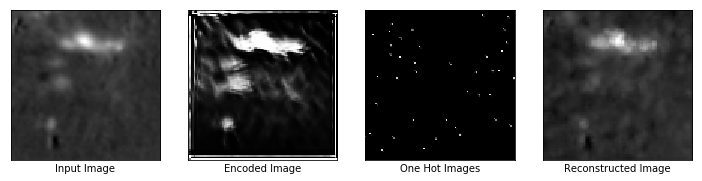

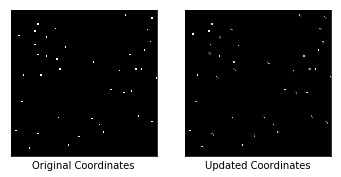

Epochs: 270, Loss: 0.0018957486608996987
Similarity scores: [1.14083355e-02 5.83311878e-02 2.70846430e-02 8.79436433e-02
 6.64596334e-02 4.54118401e-02 2.25129726e-04 3.49433012e-02
 4.33653500e-03 2.69772001e-02 2.62573222e-03 6.60078302e-02
 1.59453884e-01 1.80449933e-01 1.33515880e-01 2.09018826e-01
 1.61241397e-01 3.78533900e-02 3.79719585e-02 1.12671847e-03
 8.35339259e-03 4.15305980e-03 9.20313001e-02 5.76616749e-02
 8.26897621e-02 2.70825084e-02 1.11127105e-02 1.57791972e-02
 1.84298158e-01 1.69413626e-01 1.96680531e-01 3.24383229e-02
 9.78681028e-01 2.74248887e-02 5.47206819e-01 3.48271877e-01
 7.75182918e-02 8.46517086e-02 3.38488109e-02 3.78702015e-01]
Updated Coordinates: [[[0.9321     0.12790045]]]
Gradient min:-0.0008476126240566373, max:0.002307724440470338



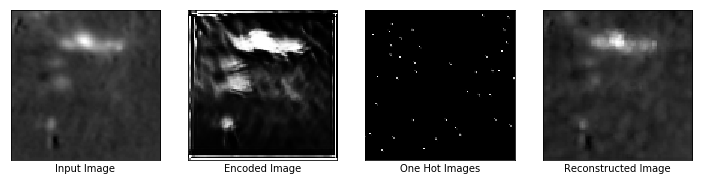

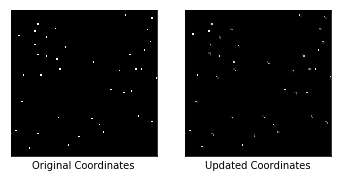

Epochs: 280, Loss: 0.0015519863227382302
Similarity scores: [1.8618250e-02 6.5309666e-02 3.3138487e-02 9.0771593e-02 8.4487908e-02
 4.9371146e-02 2.1775192e-04 3.9970268e-02 1.2294546e-02 3.1937014e-02
 3.5962260e-03 6.1824497e-02 1.7335655e-01 2.0948184e-01 1.4128429e-01
 2.6370639e-01 1.7839035e-01 4.4966392e-02 3.6758088e-02 1.1264035e-03
 1.1190583e-02 6.4053284e-03 7.9170413e-02 8.9717790e-02 8.4817350e-02
 3.3245061e-02 1.2022465e-02 2.0513389e-02 2.0818849e-01 1.3888928e-01
 1.6738044e-01 4.1501991e-02 9.8409873e-01 3.0413812e-02 5.3573745e-01
 4.0450451e-01 7.6485835e-02 1.0238325e-01 4.6662964e-02 3.8103077e-01]
Updated Coordinates: [[[0.9317442 0.1280961]]]
Gradient min:-0.0006301429821178317, max:0.0009461092995479703



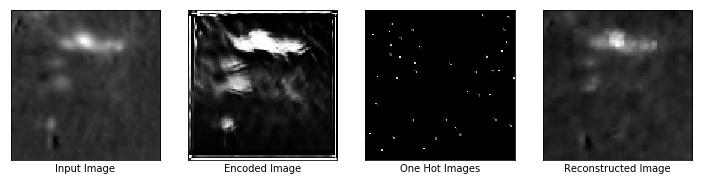

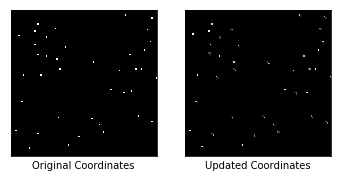

Epochs: 290, Loss: 0.0015810424229130149
Similarity scores: [9.07381251e-03 3.75985205e-02 3.52060944e-02 9.81508419e-02
 7.84048885e-02 5.43428436e-02 5.01882110e-04 4.39194292e-02
 3.97992739e-03 3.65097336e-02 4.83675487e-03 4.63179164e-02
 1.83054090e-01 1.72279820e-01 1.21211343e-01 2.49734685e-01
 1.52025670e-01 4.97446731e-02 3.59711908e-02 1.12628774e-03
 9.95077938e-03 8.27566534e-03 6.40203506e-02 7.83919543e-02
 8.16462636e-02 3.18158306e-02 1.36092575e-02 1.30946441e-02
 1.97589189e-01 9.81887728e-02 1.36778370e-01 3.96060646e-02
 9.85095620e-01 2.53248457e-02 6.19922817e-01 3.77541482e-01
 5.05484790e-02 8.82004797e-02 3.33352573e-02 4.05445635e-01]
Updated Coordinates: [[[0.9316751  0.12809522]]]
Gradient min:-0.0006186299142427742, max:0.000776199041865766



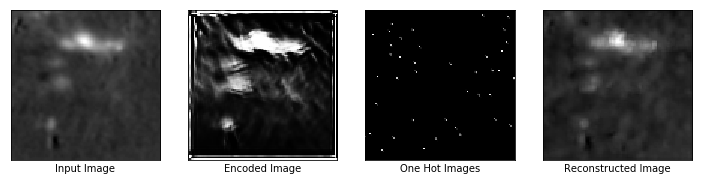

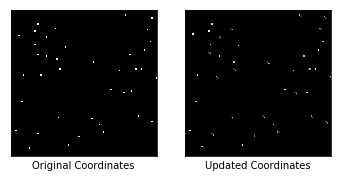

Epochs: 300, Loss: 0.0015284052351489663
Similarity scores: [1.4136297e-02 5.6593761e-02 3.5187654e-02 8.8903114e-02 6.5393664e-02
 5.1083181e-02 1.8724869e-04 4.1974083e-02 1.8748207e-02 3.3313051e-02
 7.0596631e-03 5.0629150e-02 1.7492570e-01 1.9285876e-01 1.5871719e-01
 2.6185450e-01 1.5831800e-01 4.9702644e-02 3.6003485e-02 1.1260567e-03
 1.6184909e-02 6.3332217e-03 6.6186532e-02 8.7320782e-02 8.3889529e-02
 3.6549792e-02 1.2045041e-02 1.4088841e-02 2.1529454e-01 1.9142960e-01
 1.2688164e-01 4.7993358e-02 9.6442622e-01 2.1369964e-02 5.6940830e-01
 2.7169284e-01 5.9205744e-02 8.7660931e-02 3.7792962e-02 4.0914518e-01]
Updated Coordinates: [[[0.9319135  0.12790279]]]
Gradient min:-0.001111606485210359, max:0.0012079968582838774



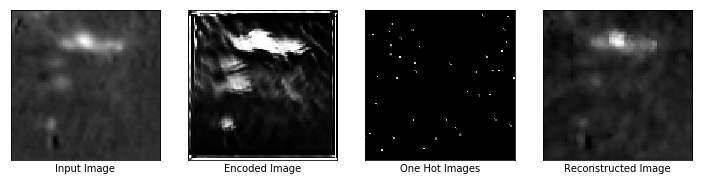

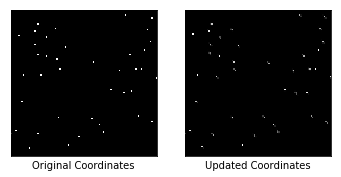

Epochs: 310, Loss: 0.0017174595268443227
Similarity scores: [1.4632173e-02 6.7207910e-02 2.9050833e-02 8.5457787e-02 4.6615411e-02
 4.0724687e-02 1.2811094e-04 2.8422525e-02 6.0481285e-03 2.8930226e-02
 2.4379410e-03 4.6429805e-02 1.6688330e-01 2.0164892e-01 1.3584484e-01
 2.5318995e-01 1.4183815e-01 4.3582294e-02 3.4938831e-02 1.1252590e-03
 1.2080331e-02 4.9809851e-03 1.9502601e-02 6.1765850e-02 7.8344949e-02
 2.6294058e-02 8.9573702e-03 1.2409556e-02 1.9932304e-01 1.6070314e-01
 1.2879835e-01 4.6656519e-02 9.7021806e-01 1.9304613e-02 5.8970815e-01
 2.5698379e-01 3.2094460e-02 8.1894532e-02 2.6205495e-02 3.9594647e-01]
Updated Coordinates: [[[0.93206364 0.12767895]]]
Gradient min:-0.000965954503044486, max:0.0008719592588022351



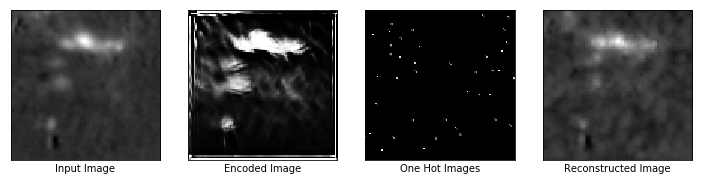

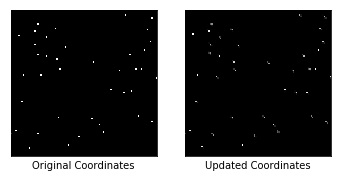

Epochs: 320, Loss: 0.0019290820928290486
Similarity scores: [7.66441273e-03 4.66093048e-02 3.67155224e-02 9.54152122e-02
 5.65809645e-02 4.15519662e-02 1.45889135e-04 4.45276313e-02
 1.17541198e-02 3.33571173e-02 1.99624500e-03 4.10419367e-02
 1.60971120e-01 1.93417400e-01 1.08299762e-01 1.94916233e-01
 1.65729269e-01 4.67940196e-02 3.46873105e-02 1.12444593e-03
 1.12553770e-02 7.40732299e-03 1.88008212e-02 6.53128549e-02
 7.52435848e-02 3.29119228e-02 1.31921638e-02 1.25980787e-02
 2.05937102e-01 1.02975912e-01 1.02357306e-01 4.17039618e-02
 9.91933227e-01 1.71977468e-02 5.94918013e-01 4.00592297e-01
 4.97086160e-02 8.14905837e-02 2.53721830e-02 3.75223517e-01]
Updated Coordinates: [[[0.9322033  0.12742192]]]
Gradient min:-0.0008089765906333923, max:0.001985288457944989



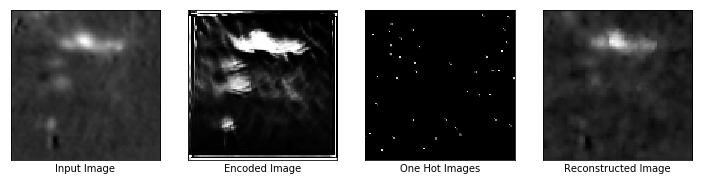

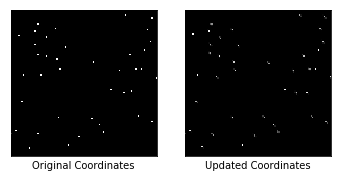

Epochs: 330, Loss: 0.0013671667547896504
Similarity scores: [7.32511561e-03 3.31533998e-02 2.38622334e-02 7.86300376e-02
 6.71196282e-02 3.72747853e-02 1.14883645e-04 3.49470079e-02
 6.87564816e-03 2.56974399e-02 1.60721748e-03 3.93943079e-02
 1.39462486e-01 1.36316508e-01 9.51599106e-02 2.34579384e-01
 1.50660038e-01 4.50855307e-02 2.18874495e-02 1.12693117e-03
 9.43202339e-03 4.05314704e-03 1.82279907e-02 6.36730120e-02
 7.02870414e-02 2.36774255e-02 8.83205235e-03 1.35984402e-02
 1.78709656e-01 1.06799930e-01 1.09649949e-01 2.72668917e-02
 9.89693046e-01 1.40200797e-02 5.65211535e-01 5.05349040e-01
 2.30333284e-02 8.59075040e-02 2.85177249e-02 3.79678845e-01]
Updated Coordinates: [[[0.9319945  0.12748043]]]
Gradient min:-0.0004470602434594184, max:0.0006095971330069005



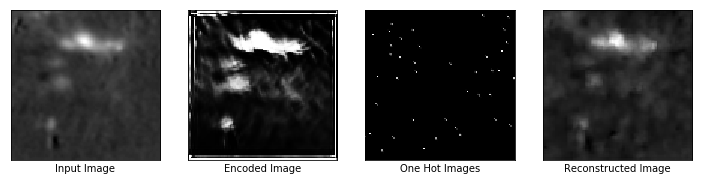

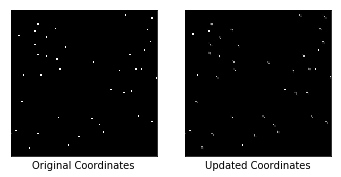

Epochs: 340, Loss: 0.001513041788712144
Similarity scores: [1.3271775e-02 5.2937813e-02 2.9724304e-02 8.3168447e-02 6.8757176e-02
 4.7761004e-02 3.0668890e-03 1.6420413e-02 2.7866466e-03 2.6398323e-02
 4.9385440e-04 3.3657633e-02 1.7518038e-01 1.5358010e-01 7.1595140e-02
 1.7098123e-01 9.4900943e-02 6.2633380e-02 1.6180648e-02 1.1266975e-03
 1.0732269e-02 3.2671636e-03 1.3569428e-02 5.7607234e-02 8.4536344e-02
 2.3437673e-02 6.0743205e-03 1.0681368e-02 2.2257587e-01 1.1755986e-01
 6.9955900e-02 3.5207357e-02 9.8973113e-01 1.0095593e-02 4.6091950e-01
 4.2607665e-01 6.6681661e-02 5.1909804e-02 3.9343629e-02 3.9275438e-01]
Updated Coordinates: [[[0.93199307 0.12769657]]]
Gradient min:-0.0013953621964901686, max:0.0007569303852505982



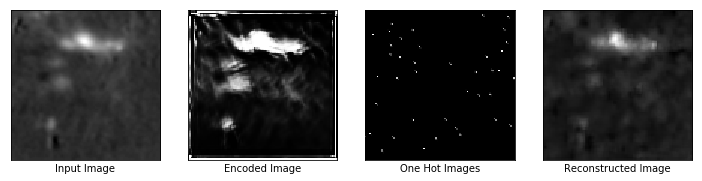

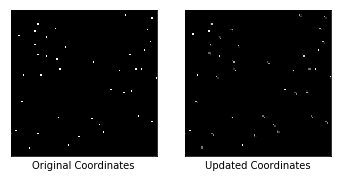

Epochs: 350, Loss: 0.0013460955815389752
Similarity scores: [0.00886892 0.04176819 0.02868873 0.08155312 0.06705376 0.03995991
 0.00141592 0.0260454  0.00413178 0.02584897 0.00155766 0.05120517
 0.17027478 0.14803089 0.12023874 0.20974311 0.11241285 0.05115654
 0.02036206 0.0011259  0.01246045 0.00349943 0.02744703 0.07422282
 0.06809986 0.02248274 0.00819147 0.01405262 0.16724885 0.06738357
 0.09921747 0.03524073 0.9739704  0.01432888 0.50432444 0.46866256
 0.03163626 0.0682786  0.03135975 0.3490056 ]
Updated Coordinates: [[[0.9320449 0.1274917]]]
Gradient min:-0.0005437766667455435, max:4.715469549410045e-05



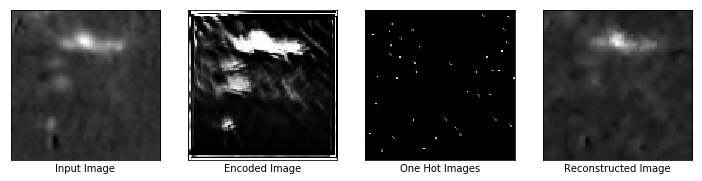

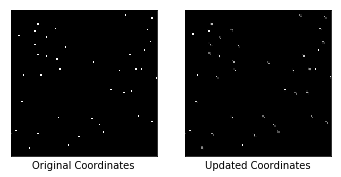

Epochs: 360, Loss: 0.0015135499415919185
Similarity scores: [0.00569754 0.034469   0.01706219 0.06520196 0.06267753 0.02852385
 0.00298284 0.02496568 0.00729135 0.01914136 0.00130053 0.07016388
 0.1224852  0.1559124  0.17271963 0.24900542 0.13693611 0.02820295
 0.0123481  0.00115513 0.01148106 0.00203    0.12660836 0.05332914
 0.0492892  0.01322142 0.00567885 0.02020037 0.18521334 0.20561275
 0.09101734 0.02316332 0.99196666 0.01221159 0.6131298  0.25609753
 0.00811264 0.1189497  0.03432428 0.3260907 ]
Updated Coordinates: [[[0.93206936 0.12685175]]]
Gradient min:-0.00030009745387360454, max:0.0006681187078356743



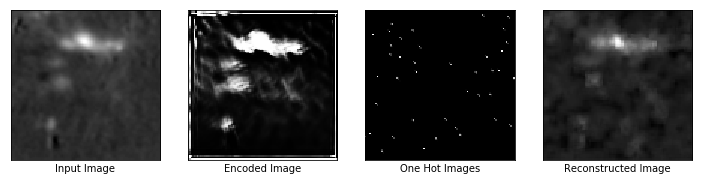

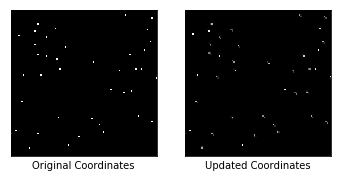

Epochs: 370, Loss: 0.002938223537057638
Similarity scores: [0.00636225 0.02666163 0.02554263 0.0792249  0.04814053 0.0380298
 0.00197525 0.02214499 0.00246263 0.02494763 0.00106146 0.03762242
 0.11503644 0.14802243 0.0989816  0.14468925 0.11700113 0.03851435
 0.02474591 0.00112565 0.00699833 0.00395853 0.05421979 0.04316712
 0.05224226 0.01781509 0.00963569 0.00992716 0.11770768 0.07782041
 0.07577545 0.02889718 0.9964154  0.01397846 0.5571362  0.24901257
 0.03697062 0.04550548 0.014413   0.28761822]
Updated Coordinates: [[[0.9309722  0.12621076]]]
Gradient min:-0.002253303537145257, max:0.004639733117073774



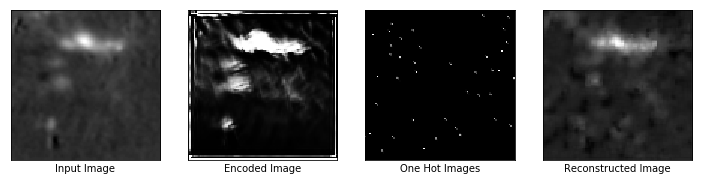

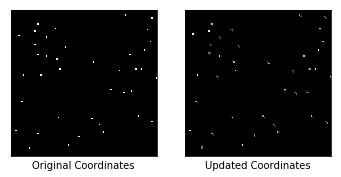

Epochs: 380, Loss: 0.00183770596049726
Similarity scores: [0.01875694 0.04411804 0.0169996  0.05877652 0.07002135 0.02950127
 0.00130098 0.01352651 0.02566668 0.02036325 0.00175739 0.05426055
 0.13663968 0.1639454  0.13072686 0.23374104 0.1059873  0.03816991
 0.02653951 0.0012971  0.01486142 0.0021138  0.03546305 0.03581897
 0.0575172  0.01416982 0.00486263 0.01426414 0.1567949  0.17185335
 0.08330136 0.03793766 0.9889288  0.01518366 0.5339118  0.11568362
 0.03637554 0.08529592 0.03511284 0.2943174 ]
Updated Coordinates: [[[0.9309424  0.12626739]]]
Gradient min:-0.0010516108013689518, max:0.0022311678621917963



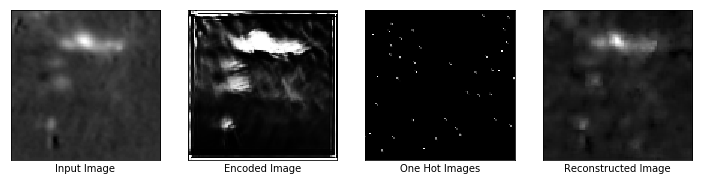

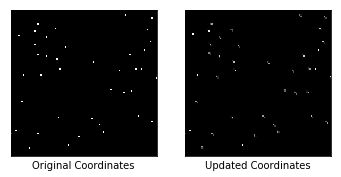

Epochs: 390, Loss: 0.0014728690730407834
Similarity scores: [0.01696747 0.05291617 0.02002249 0.06952685 0.08586088 0.03164259
 0.00242636 0.02026623 0.05278532 0.02563782 0.00454264 0.08258771
 0.17793828 0.18150987 0.16037717 0.2565892  0.11667577 0.04845679
 0.03111416 0.00115494 0.0211652  0.00219958 0.06913064 0.05460966
 0.07082959 0.01848034 0.00630262 0.02403908 0.17806557 0.1787145
 0.08887582 0.04372298 0.9976237  0.0198486  0.51412886 0.12511846
 0.0473731  0.08291954 0.05377768 0.34743676]
Updated Coordinates: [[[0.93136835 0.126503  ]]]
Gradient min:-0.0007204397697933018, max:0.0014365118695423007



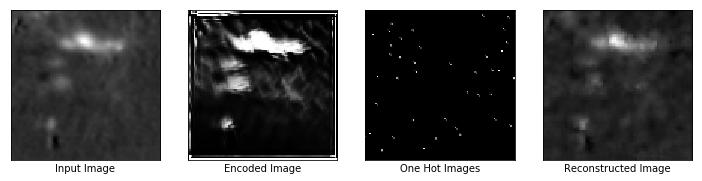

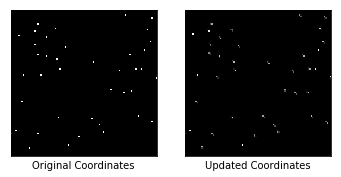

Epochs: 400, Loss: 0.001624464406631887
Similarity scores: [0.02017874 0.07120279 0.02084324 0.0762859  0.0781075  0.03608365
 0.00155826 0.01725291 0.10710739 0.02523224 0.00314823 0.06357896
 0.17667104 0.1925736  0.151047   0.23281376 0.11160726 0.04708104
 0.02949545 0.00128546 0.01385348 0.00216957 0.02438223 0.04366552
 0.07577681 0.01689539 0.00557663 0.02785285 0.18136188 0.20215459
 0.09160338 0.03881114 0.9923014  0.01747391 0.53162014 0.22266185
 0.06322572 0.09397611 0.04473705 0.3684416 ]
Updated Coordinates: [[[0.9311391  0.12658189]]]
Gradient min:-0.0006749263848178089, max:0.002065526321530342



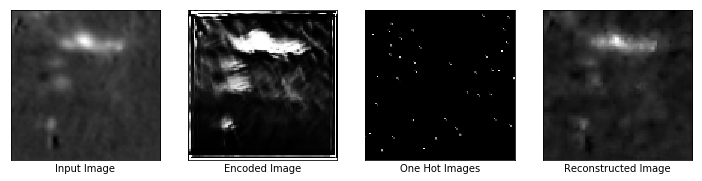

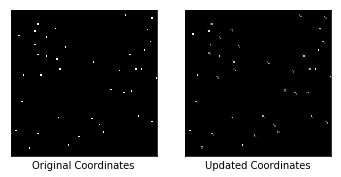

Epochs: 410, Loss: 0.0015284358523786068
Similarity scores: [0.01780426 0.04589478 0.0194439  0.06427136 0.07974281 0.03348292
 0.00121048 0.01879942 0.04303367 0.02491444 0.00230214 0.09451825
 0.16561745 0.18160579 0.186722   0.30380896 0.12306231 0.04275039
 0.03774912 0.00118027 0.02681565 0.00189221 0.06657033 0.05750166
 0.07189026 0.01343723 0.00523983 0.03473886 0.17937012 0.288537
 0.08650079 0.05192769 0.9964633  0.02019863 0.5577681  0.15819018
 0.04014741 0.09716    0.05621979 0.35934344]
Updated Coordinates: [[[0.93123996 0.126819  ]]]
Gradient min:-0.0005658973241224885, max:0.0007850421825423837



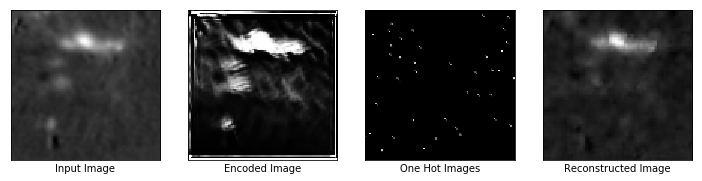

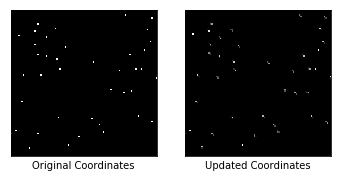

Epochs: 420, Loss: 0.0014748453395441175
Similarity scores: [0.01789369 0.06447396 0.02291079 0.07345043 0.08095071 0.0381293
 0.00143417 0.02432998 0.01086949 0.02894672 0.00301401 0.06943889
 0.16614816 0.19262446 0.154975   0.25475484 0.16113944 0.04843786
 0.04578749 0.00118666 0.02271136 0.00324062 0.0122797  0.03903688
 0.07570282 0.01573816 0.00642929 0.03243532 0.17509261 0.21532962
 0.11317664 0.04952735 0.9900845  0.0214386  0.49493304 0.2741714
 0.04947135 0.09673342 0.0449147  0.391831  ]
Updated Coordinates: [[[0.93149954 0.12664701]]]
Gradient min:-0.0006499414448626339, max:0.0017085409490391612



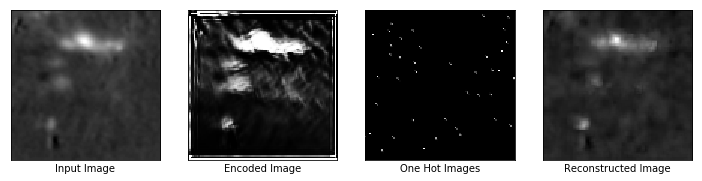

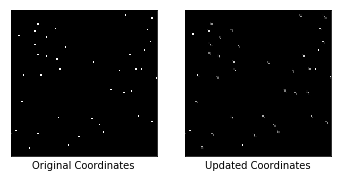

Epochs: 430, Loss: 0.001834494760259986
Similarity scores: [0.04052413 0.08849394 0.03074876 0.09629592 0.08139274 0.04809555
 0.00186235 0.01650125 0.19219244 0.03758149 0.00107949 0.05954583
 0.2096548  0.19697815 0.1348342  0.22978273 0.1570998  0.08730293
 0.03903086 0.00113014 0.03881316 0.00450341 0.05570418 0.0610645
 0.11594085 0.02119732 0.00768446 0.02612206 0.2365135  0.26531535
 0.10304409 0.06599585 0.9921302  0.01905403 0.57379514 0.21867633
 0.06471001 0.07271519 0.03038793 0.42352337]
Updated Coordinates: [[[0.93174475 0.12638322]]]
Gradient min:-0.0009517096914350986, max:0.0021770219318568707



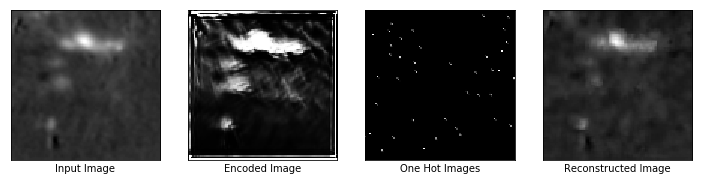

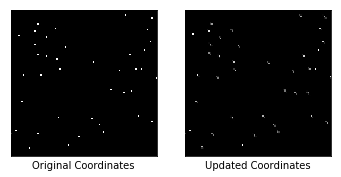

Epochs: 440, Loss: 0.0017043411498889327
Similarity scores: [0.02316176 0.06802143 0.0275704  0.08690591 0.09874105 0.04108276
 0.00112039 0.02217082 0.11853126 0.03412854 0.00433486 0.08349869
 0.16288894 0.20909722 0.18389328 0.2997698  0.14948839 0.05372641
 0.05558537 0.00120691 0.03234965 0.00286727 0.05682221 0.0560294
 0.08701552 0.01890529 0.0080886  0.04092723 0.18772428 0.25030288
 0.08628127 0.05580637 0.9967824  0.02685338 0.522866   0.15475416
 0.06935481 0.08977754 0.0556289  0.38087606]
Updated Coordinates: [[[0.9321721  0.12648459]]]
Gradient min:-0.00033205089857801795, max:0.0015697911148890853



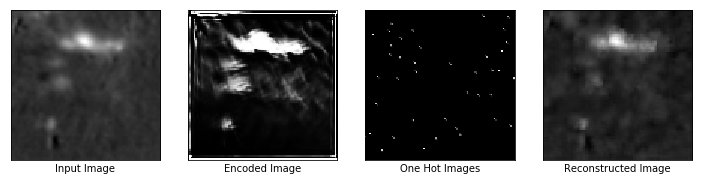

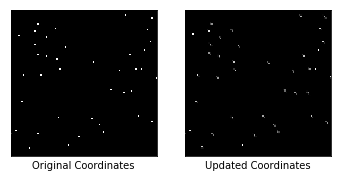

Epochs: 450, Loss: 0.001691497745923698
Similarity scores: [0.02253446 0.07026435 0.01613592 0.06351662 0.07363496 0.02888176
 0.00141653 0.0116178  0.09308879 0.02519145 0.00372193 0.0475717
 0.16983825 0.13360198 0.13951251 0.2200863  0.08987553 0.04587902
 0.02434743 0.00125819 0.02515079 0.00118576 0.03422195 0.02996258
 0.08127876 0.00952498 0.00319733 0.03576689 0.19614233 0.37612292
 0.06015778 0.0448712  0.99748635 0.01110042 0.48807043 0.09468173
 0.07153988 0.07682415 0.03547521 0.41046938]
Updated Coordinates: [[[0.9319961  0.12644435]]]
Gradient min:-0.0009098921436816454, max:0.002159216906875372



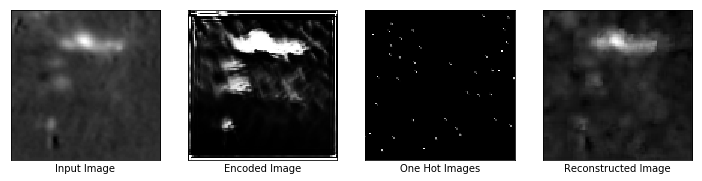

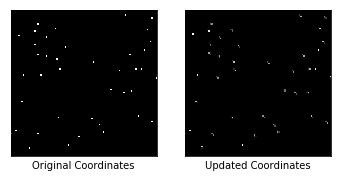

Epochs: 460, Loss: 0.0015120632015168667
Similarity scores: [1.2765243e-02 5.7675049e-02 8.3817467e-03 4.4483177e-02 8.1516951e-02
 1.6174231e-02 1.1544124e-03 9.0722321e-03 3.5912719e-02 1.1829142e-02
 1.0938058e-03 5.4868478e-02 1.3385487e-01 1.1265249e-01 1.1254110e-01
 2.0498356e-01 9.7091727e-02 2.7415281e-02 1.6116112e-02 1.4585388e-03
 1.4027352e-02 4.3843940e-04 1.1752782e-02 1.8017868e-02 5.1923025e-02
 5.6738979e-03 1.2584826e-03 3.0689621e-02 1.9818535e-01 2.8485209e-01
 5.2346982e-02 2.9062595e-02 9.9967086e-01 7.6622763e-03 5.2158958e-01
 5.5907950e-02 5.1275328e-02 7.0929296e-02 3.0964866e-02 3.1882617e-01]
Updated Coordinates: [[[0.93166435 0.12625836]]]
Gradient min:-0.00053443294018507, max:0.00011652375542325899



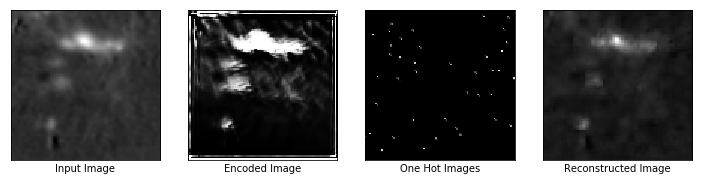

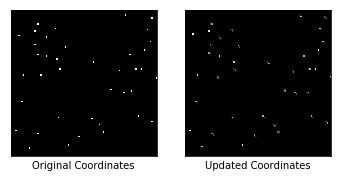

Epochs: 470, Loss: 0.0017007911810651422
Similarity scores: [2.1303054e-02 7.6898716e-02 1.1876437e-02 5.3323995e-02 8.1985913e-02
 2.2126162e-02 1.5319071e-03 1.3011205e-02 1.3531901e-01 1.6897060e-02
 1.9332175e-03 7.5054631e-02 1.3017391e-01 1.6833836e-01 1.4953852e-01
 2.3450191e-01 1.3077089e-01 3.9035559e-02 4.1449457e-02 1.2858514e-03
 2.2231188e-02 8.4808719e-04 2.6613409e-02 2.8557369e-02 7.0252478e-02
 9.0903975e-03 3.0224426e-03 3.1386331e-02 2.0729953e-01 2.7808145e-01
 6.8437159e-02 5.5682071e-02 9.9956048e-01 1.8305497e-02 5.5808127e-01
 6.3224643e-02 7.4839585e-02 8.1374668e-02 6.6440634e-02 3.8463321e-01]
Updated Coordinates: [[[0.9321248 0.1265117]]]
Gradient min:-0.00037716509541496634, max:0.0013927211984992027



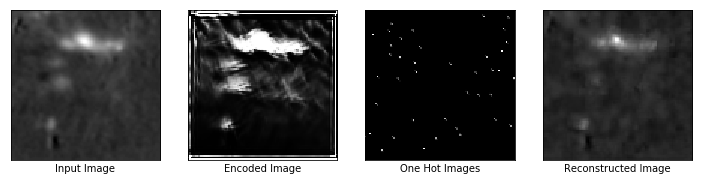

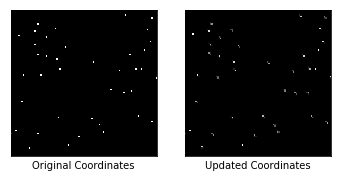

Epochs: 480, Loss: 0.0022981588263064623
Similarity scores: [0.03330975 0.11687093 0.02274623 0.07808401 0.11065648 0.03536306
 0.0014444  0.01847022 0.21287027 0.02927627 0.00287923 0.09310912
 0.16173375 0.196619   0.18660705 0.30947956 0.14720772 0.05674488
 0.04430005 0.00122644 0.03782957 0.00127544 0.04312833 0.03792248
 0.09918592 0.01565471 0.00560097 0.05454664 0.2506925  0.37452924
 0.12427008 0.06762358 0.99715316 0.02378388 0.5021399  0.04474446
 0.07812135 0.12781018 0.08948834 0.42248383]
Updated Coordinates: [[[0.93229526 0.12616426]]]
Gradient min:-0.0004798542067874223, max:0.002711449284106493



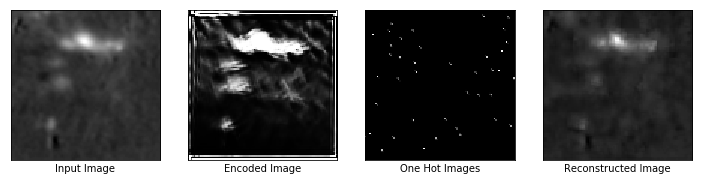

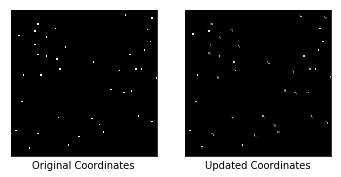

Epochs: 490, Loss: 0.0019071140559390187
Similarity scores: [0.03746887 0.12228166 0.01655699 0.06896888 0.13235681 0.03029628
 0.00259077 0.01619678 0.15406723 0.02337511 0.00164738 0.11343186
 0.14093314 0.16192539 0.19177404 0.30647606 0.14117664 0.05174945
 0.03732994 0.00234525 0.04771293 0.00104703 0.03084601 0.0288141
 0.09345476 0.00875166 0.00400066 0.05515279 0.28393447 0.4644766
 0.08176883 0.06851492 0.99822986 0.02188767 0.53452736 0.0379992
 0.12388829 0.1150965  0.08264924 0.41566974]
Updated Coordinates: [[[0.9321676  0.12575868]]]
Gradient min:-0.001011032029055059, max:0.002106474945321679



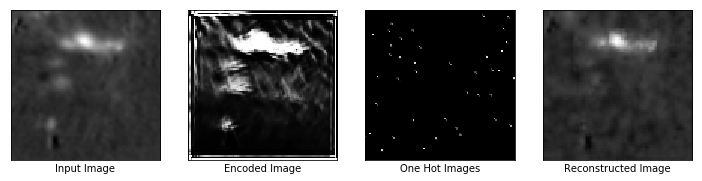

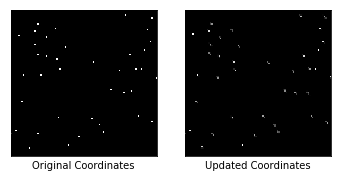

Epochs: 500, Loss: 0.0021881344728171825
Similarity scores: [0.0377751  0.12088574 0.02486342 0.08521849 0.12317807 0.03783989
 0.00355286 0.02738842 0.06070794 0.03135166 0.00146479 0.18457559
 0.19607055 0.17165476 0.25035712 0.31545582 0.15527695 0.06103823
 0.04714608 0.00122188 0.03672535 0.0012182  0.03442316 0.05406389
 0.11437808 0.01829313 0.00718334 0.05211238 0.30122778 0.54691416
 0.06479318 0.07355649 0.99875987 0.02477751 0.44491696 0.02146051
 0.05686751 0.1266546  0.10052172 0.43292555]
Updated Coordinates: [[[0.93213576 0.12553713]]]
Gradient min:-0.00033608608646318316, max:0.0022711195051670074



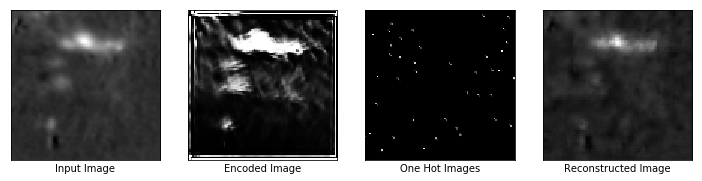

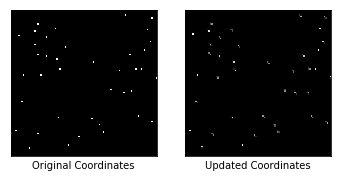

Epochs: 510, Loss: 0.001758158439770341
Similarity scores: [1.8439773e-02 8.3264217e-02 1.7311754e-02 7.1306989e-02 1.2093158e-01
 3.2422975e-02 2.3232508e-03 1.6201554e-02 6.5184265e-02 2.1303704e-02
 1.6418968e-03 1.5398674e-01 1.4112037e-01 1.5281683e-01 1.9784532e-01
 2.7881643e-01 1.1286639e-01 4.4470258e-02 4.2128839e-02 1.2837145e-03
 3.6736753e-02 6.9589919e-04 4.1233017e-03 3.0114388e-02 9.6557476e-02
 7.9840003e-03 3.7911835e-03 4.8053730e-02 2.2715187e-01 5.0502002e-01
 7.1601652e-02 7.2940908e-02 9.9877399e-01 1.9172914e-02 4.7419593e-01
 2.3809267e-02 6.7982823e-02 8.4273309e-02 8.3575025e-02 3.8680679e-01]
Updated Coordinates: [[[0.93225247 0.12554042]]]
Gradient min:-8.236454596044496e-05, max:0.0012654130114242435



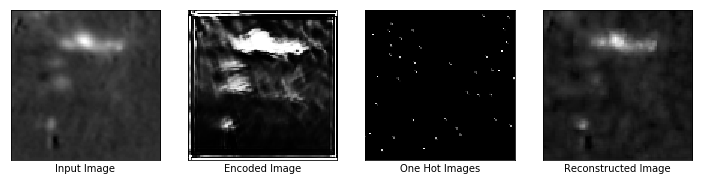

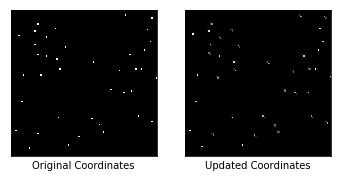

Epochs: 520, Loss: 0.0014978381805121899
Similarity scores: [0.03196668 0.09905675 0.02290886 0.08784981 0.1341638  0.03790804
 0.00204334 0.02869322 0.13574548 0.02675382 0.00215645 0.17088845
 0.13303992 0.16306305 0.24128667 0.33441165 0.144631   0.05558349
 0.04528904 0.00137075 0.06259118 0.00116675 0.00951218 0.06035021
 0.1060933  0.02107696 0.00645718 0.05634648 0.26463673 0.42478532
 0.0639854  0.08133166 0.99926    0.03495385 0.5283289  0.0350625
 0.0469582  0.13599235 0.1022628  0.40994963]
Updated Coordinates: [[[0.9321273 0.1252765]]]
Gradient min:-0.00024766940623521805, max:0.00021297839703038335



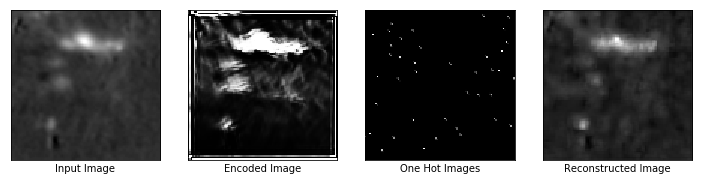

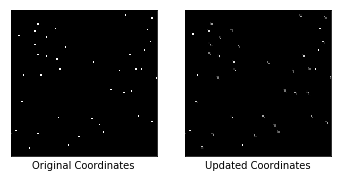

Epochs: 530, Loss: 0.0016921618953347206
Similarity scores: [0.02573394 0.09295398 0.0208068  0.07877365 0.14012487 0.03914214
 0.00198045 0.02018959 0.2487154  0.02713956 0.00145917 0.12934314
 0.16339266 0.16023467 0.16087137 0.35288447 0.13542673 0.04994918
 0.05110049 0.0025572  0.04855436 0.00156902 0.01646396 0.05793704
 0.10970899 0.01238684 0.00575703 0.03926722 0.23645943 0.28588656
 0.06143814 0.07824448 0.9983212  0.02229983 0.4963812  0.00669097
 0.05859397 0.11856128 0.08299801 0.35356918]
Updated Coordinates: [[[0.93160117 0.12453108]]]
Gradient min:-0.0005055018700659275, max:0.0010846847435459495



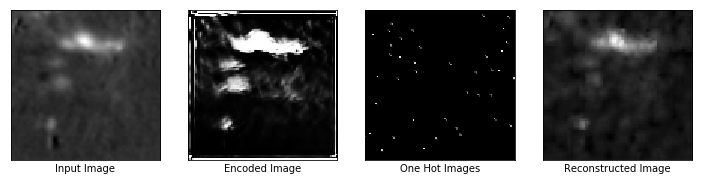

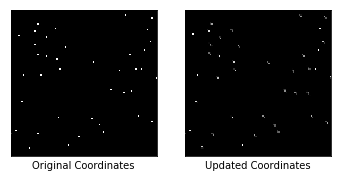

Epochs: 540, Loss: 0.0017050426686182618
Similarity scores: [7.98818469e-03 5.15806191e-02 1.41065856e-02 6.71356320e-02
 9.39710364e-02 2.93705799e-02 2.01955042e-03 1.25435395e-02
 7.29625300e-02 1.72821619e-02 5.99419232e-04 7.09845275e-02
 1.46888524e-01 1.10890344e-01 1.25295743e-01 2.46630415e-01
 9.22138691e-02 2.96915416e-02 2.22367477e-02 1.95255328e-03
 1.72770042e-02 6.62408420e-04 9.37628839e-03 4.09693532e-02
 7.46567324e-02 7.16419378e-03 2.27726251e-03 2.49805730e-02
 2.00024113e-01 1.04404226e-01 3.43840756e-02 3.74014527e-02
 9.99364495e-01 8.97890795e-03 5.61071932e-01 1.48448674e-02
 7.34168813e-02 5.06445915e-02 4.29057293e-02 3.53071868e-01]
Updated Coordinates: [[[0.93151164 0.12426361]]]
Gradient min:-0.0003851813089568168, max:0.0004106015258003026



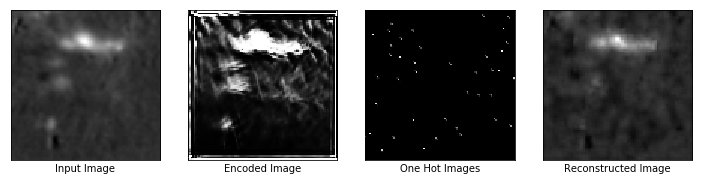

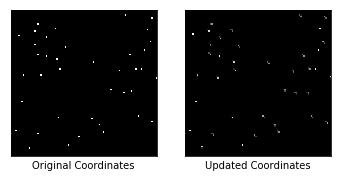

Epochs: 550, Loss: 0.0018266822444275022
Similarity scores: [1.71422325e-02 7.38579929e-02 2.77652107e-02 9.18393880e-02
 1.59650788e-01 5.75412661e-02 6.76596398e-03 2.31581964e-02
 2.60305732e-01 3.15617248e-02 7.84102536e-04 2.30346978e-01
 1.43146992e-01 1.84857085e-01 2.68210083e-01 4.23612267e-01
 1.36687696e-01 5.75045981e-02 5.89462593e-02 1.39010116e-03
 1.09270871e-01 1.39847700e-03 9.98616777e-03 5.58350831e-02
 1.17119335e-01 1.60062052e-02 6.64737774e-03 9.95913222e-02
 2.56975025e-01 7.05715716e-01 7.06164911e-02 1.11905091e-01
 9.97539639e-01 2.67210770e-02 5.00023782e-01 3.00678965e-02
 5.99078722e-02 1.11993454e-01 1.23114340e-01 4.09631699e-01]
Updated Coordinates: [[[0.9312621  0.12395677]]]
Gradient min:-0.0006492379470728338, max:0.0016641794936731458



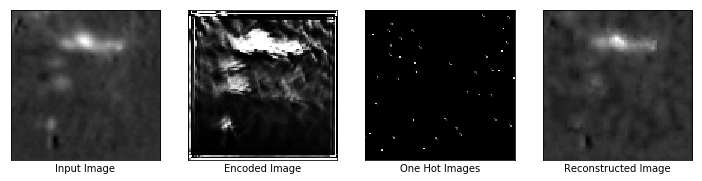

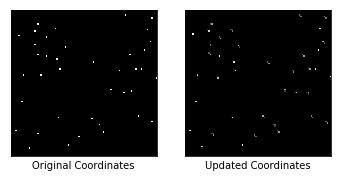

Epochs: 560, Loss: 0.002350960625335574
Similarity scores: [2.38259695e-02 1.13990404e-01 2.87989061e-02 8.70358273e-02
 1.58007175e-01 4.58261818e-02 2.00629211e-03 2.13924702e-02
 4.21740711e-01 3.80186141e-02 9.44258180e-04 1.48134068e-01
 1.63196623e-01 2.01840952e-01 2.32546240e-01 3.69114608e-01
 1.38418466e-01 6.40675575e-02 6.06770664e-02 1.57718803e-03
 1.35006160e-01 2.45039049e-03 2.94120256e-02 3.40605266e-02
 1.01756066e-01 1.33943111e-02 7.43087009e-03 1.03333831e-01
 2.51260757e-01 7.68324435e-01 7.37877488e-02 1.16367124e-01
 9.96401072e-01 3.01194582e-02 5.13483107e-01 5.27753793e-02
 8.67604911e-02 7.62548298e-02 1.14910059e-01 4.14934546e-01]
Updated Coordinates: [[[0.9311819  0.12385139]]]
Gradient min:-0.0006528442609123886, max:0.002396677155047655



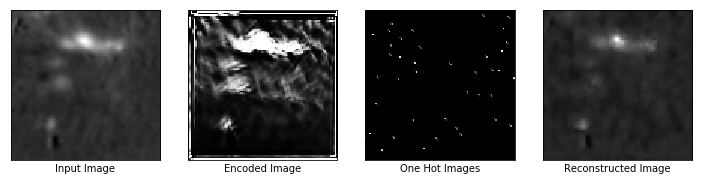

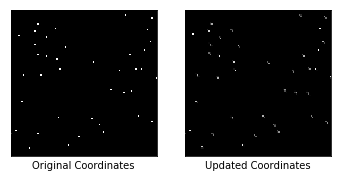

Epochs: 570, Loss: 0.003636406036093831
Similarity scores: [0.0223157  0.16389391 0.04306586 0.11360355 0.1641672  0.06584542
 0.00465736 0.03090141 0.39520234 0.04855849 0.00100471 0.18627533
 0.17867869 0.24808803 0.2534285  0.42782995 0.15636925 0.0846898
 0.0573503  0.00143801 0.11942856 0.0045669  0.04310616 0.05542969
 0.13379055 0.02290439 0.01146103 0.10014784 0.31689242 0.7655328
 0.07019255 0.14857447 0.99833757 0.03914975 0.6275798  0.04056502
 0.10755601 0.15540108 0.11217579 0.48336866]
Updated Coordinates: [[[0.9309502  0.12355305]]]
Gradient min:-0.0009134573629125953, max:0.0031392108649015427



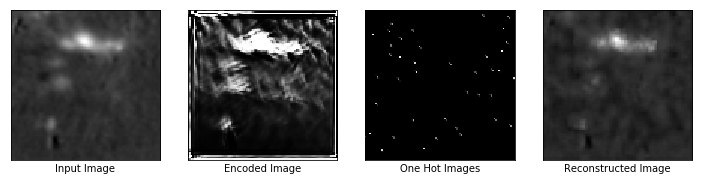

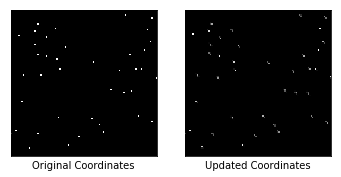

Epochs: 580, Loss: 0.002864502603188157
Similarity scores: [0.02849448 0.16613258 0.04384858 0.12006434 0.15733734 0.06164831
 0.00938885 0.03373396 0.35787654 0.05708868 0.00151093 0.19536312
 0.19552724 0.22945274 0.23212256 0.41613743 0.19222379 0.10228136
 0.07829475 0.00160119 0.16211331 0.00350557 0.05550143 0.05027479
 0.14345181 0.02296505 0.01275224 0.11977095 0.31386274 0.7354787
 0.08452795 0.16612035 0.9960805  0.04617257 0.56179416 0.04790188
 0.09801973 0.13738394 0.14135915 0.45124227]
Updated Coordinates: [[[0.93096   0.1234813]]]
Gradient min:-0.0009902222082018852, max:0.0035264750476926565



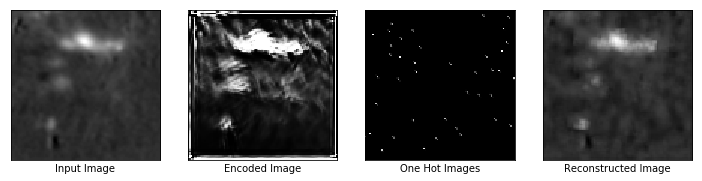

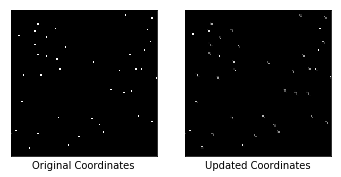

Epochs: 590, Loss: 0.0026178292464464903
Similarity scores: [0.03369922 0.17773919 0.04559877 0.1321892  0.19261388 0.06526295
 0.00635262 0.02805252 0.35855898 0.06174554 0.00195295 0.16114348
 0.19511676 0.23856138 0.18928802 0.42434287 0.15677461 0.0973347
 0.08241137 0.00124505 0.13199519 0.00477362 0.05086461 0.04345327
 0.14450714 0.0205211  0.01285341 0.0933131  0.31998262 0.69223833
 0.0777743  0.15755327 0.99639153 0.03872375 0.6033375  0.05943967
 0.06796151 0.1165346  0.12146432 0.43276155]
Updated Coordinates: [[[0.93078953 0.12324354]]]
Gradient min:-0.0009547837544232607, max:0.0027091160882264376



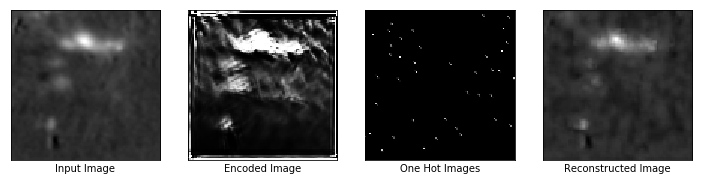

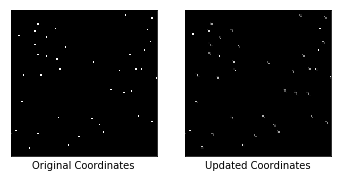

Epochs: 600, Loss: 0.0025807106867432594
Similarity scores: [0.02699237 0.18327813 0.0354004  0.11281641 0.16166815 0.0549991
 0.00377112 0.02650801 0.39883924 0.0467805  0.0013777  0.13416758
 0.18441856 0.2355569  0.192268   0.38333195 0.14027013 0.08235162
 0.06736368 0.00129766 0.16983718 0.00376292 0.03592395 0.05444752
 0.1474773  0.01857693 0.01080816 0.08900051 0.3349689  0.81972307
 0.06729648 0.15370892 0.9972849  0.03397844 0.57358867 0.07402765
 0.07835367 0.10630932 0.09843484 0.43166244]
Updated Coordinates: [[[0.9307622  0.12327544]]]
Gradient min:-0.0007614596979692578, max:0.002986665815114975



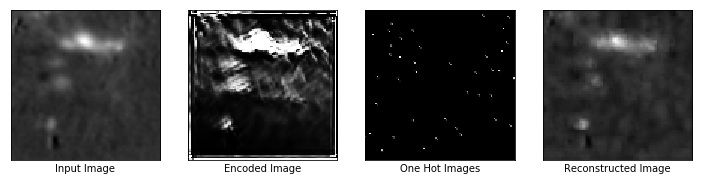

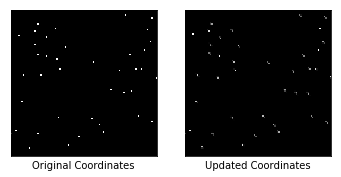

Epochs: 610, Loss: 0.0029920239467173815
Similarity scores: [0.01015204 0.21637869 0.02548615 0.09569703 0.15521987 0.04997851
 0.00405543 0.01522613 0.38885772 0.03479287 0.00336633 0.1419019
 0.18354228 0.24777211 0.18355693 0.3746693  0.1125547  0.08098243
 0.04935351 0.00119575 0.13667509 0.00270262 0.01486959 0.02689706
 0.16255225 0.01291259 0.00621893 0.07091127 0.36022887 0.82697767
 0.05190177 0.15703227 0.9991716  0.02532096 0.61242825 0.01750522
 0.04894823 0.11005974 0.11335681 0.47914356]
Updated Coordinates: [[[0.930568   0.12299577]]]
Gradient min:-0.0012623373186215758, max:0.0030857075471431017



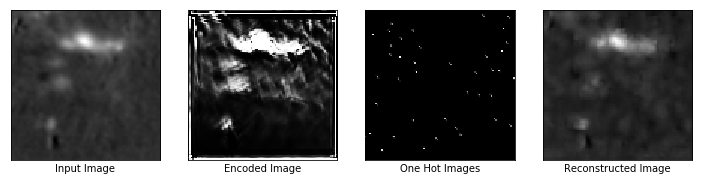

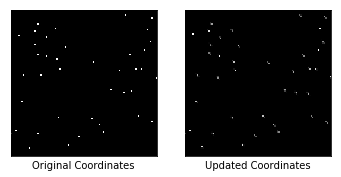

Epochs: 620, Loss: 0.002265464048832655
Similarity scores: [0.02119691 0.15012018 0.02919036 0.099888   0.11632729 0.05395306
 0.00295149 0.01696643 0.3543349  0.03430833 0.00164397 0.11036781
 0.15850978 0.19248243 0.19586001 0.36468437 0.13261068 0.07506977
 0.04810378 0.00111927 0.11180659 0.00352597 0.03088851 0.03397352
 0.12712836 0.01737211 0.00733299 0.04476938 0.27096394 0.78148556
 0.0571143  0.11840526 0.9984307  0.02348568 0.5702788  0.05489463
 0.04100745 0.10666419 0.0882891  0.4623137 ]
Updated Coordinates: [[[0.930983   0.12261789]]]
Gradient min:-0.000881115673109889, max:0.002661488251760602



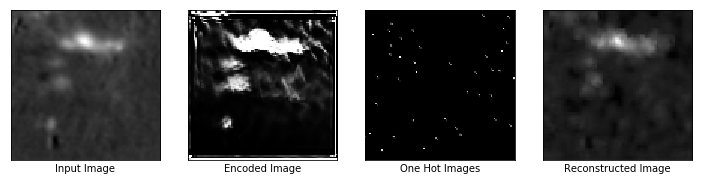

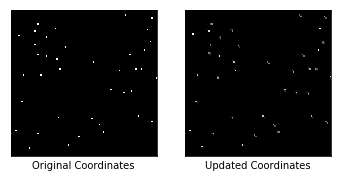

Epochs: 630, Loss: 0.0017172585939988494
Similarity scores: [2.7799299e-02 1.2070771e-01 7.7616507e-03 4.4209357e-02 8.1670485e-02
 1.8979682e-02 1.7644915e-03 3.4897341e-03 3.5379422e-01 9.7563537e-03
 7.0859864e-03 3.9858136e-02 1.5335301e-01 1.1876290e-01 9.5586441e-02
 2.6001811e-01 5.2526999e-02 3.5432205e-02 2.0205254e-02 1.1207260e-03
 6.6161647e-02 2.3241507e-04 6.8276032e-04 1.0337861e-02 1.0140615e-01
 2.7383033e-03 8.9055370e-04 3.4379080e-02 2.8603733e-01 7.8607297e-01
 2.7555792e-02 7.7334218e-02 9.9846649e-01 7.8154607e-03 6.3478351e-01
 1.8934278e-02 2.1982752e-02 4.7436219e-02 5.2450076e-02 3.3997306e-01]
Updated Coordinates: [[[0.931406   0.12222717]]]
Gradient min:-0.0009323505801148713, max:0.0011283301282674074



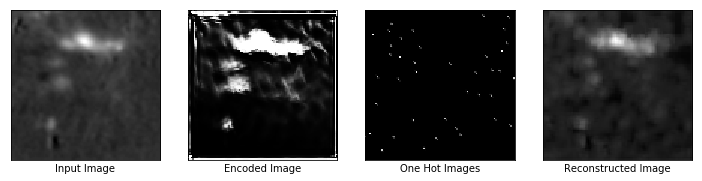

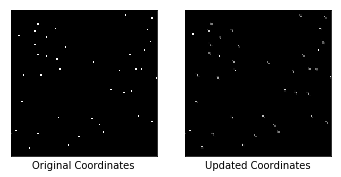

Epochs: 640, Loss: 0.0021958218421787024
Similarity scores: [1.6478000e-02 7.3350623e-02 5.9091114e-03 3.6561932e-02 7.1377672e-02
 1.6530592e-02 2.1329459e-03 4.0431889e-03 1.0565978e-01 7.9397438e-03
 5.0685871e-03 4.2284004e-02 1.5076099e-01 9.8484345e-02 1.3058440e-01
 3.1751934e-01 5.6753796e-02 2.9137492e-02 1.2275631e-02 1.1264890e-03
 5.5633344e-02 1.9303866e-04 7.4867735e-04 7.0431386e-03 8.0289595e-02
 2.2245501e-03 6.4049894e-04 3.5093985e-02 2.1351576e-01 6.2757063e-01
 3.6124516e-02 4.8005592e-02 9.9985582e-01 5.4701613e-03 5.7002109e-01
 3.8092066e-02 2.6890276e-02 6.1402820e-02 5.3764518e-02 3.3476186e-01]
Updated Coordinates: [[[0.9321731  0.12129676]]]
Gradient min:-0.001791452756151557, max:0.001409052638337016



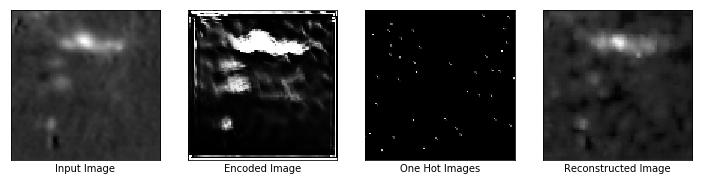

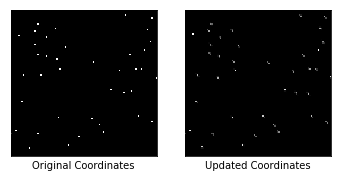

Epochs: 650, Loss: 0.0020690883975476027
Similarity scores: [1.59115754e-02 6.34740815e-02 1.53503828e-02 5.70087917e-02
 7.72292688e-02 2.79400740e-02 2.18246900e-03 8.38075299e-03
 2.89380878e-01 1.50020905e-02 8.12507293e-04 5.86651489e-02
 1.33295730e-01 1.32741854e-01 1.93030909e-01 3.12923819e-01
 9.26761478e-02 3.08117662e-02 1.97075382e-02 1.14916475e-03
 4.98895459e-02 8.74590478e-04 1.97878014e-03 2.06430778e-02
 6.04007356e-02 6.53214706e-03 2.60685710e-03 3.62755060e-02
 2.09762543e-01 3.57069641e-01 2.66576353e-02 4.36482020e-02
 9.99897838e-01 9.14580654e-03 4.99479681e-01 1.13488488e-01
 4.42229882e-02 9.75789502e-02 5.44624776e-02 2.53016144e-01]
Updated Coordinates: [[[0.9326633  0.12063061]]]
Gradient min:-0.0022326724138110876, max:0.0014634081162512302



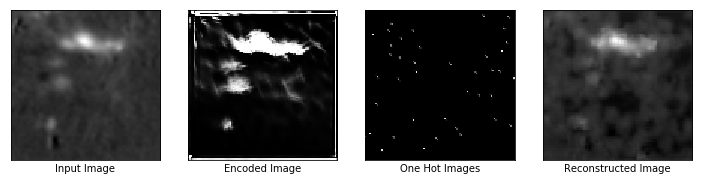

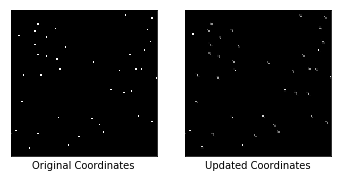

Epochs: 660, Loss: 0.0027691172435879707
Similarity scores: [5.5146748e-03 3.4940716e-02 6.6952575e-03 3.5962045e-02 4.1438553e-02
 1.6077839e-02 2.6348326e-03 5.0737211e-03 3.3993467e-03 1.0695775e-02
 1.5651280e-03 5.2919928e-02 9.6814334e-02 7.0794471e-02 1.0438236e-01
 2.0134059e-01 6.8742305e-02 1.8466508e-02 9.6782399e-03 1.1266979e-03
 2.0811580e-02 5.4888916e-04 1.6234962e-03 6.5925056e-03 4.6735093e-02
 2.9078443e-03 1.3856897e-03 1.4798403e-02 1.3881853e-01 1.6557838e-01
 3.2021601e-02 2.1537125e-02 9.9990410e-01 4.3928856e-03 4.9288630e-01
 4.7057655e-02 1.3929827e-02 6.2359255e-02 2.2876702e-02 2.5506279e-01]
Updated Coordinates: [[[0.9328014  0.12041249]]]
Gradient min:-0.0016919468762353063, max:0.0010296771069988608



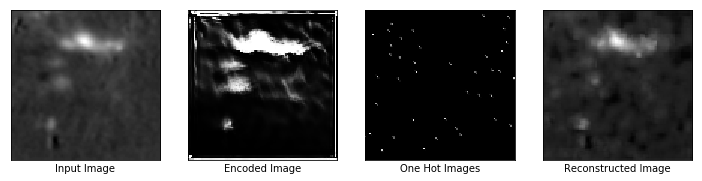

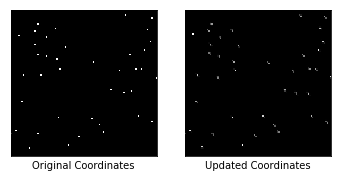

Epochs: 670, Loss: 0.0017143237637355924
Similarity scores: [1.12811252e-02 5.87369762e-02 7.48392614e-03 3.66686620e-02
 6.66345134e-02 1.77006386e-02 1.75829278e-03 6.54214434e-03
 9.08314958e-02 1.03038475e-02 1.67621020e-03 7.91862383e-02
 1.24357559e-01 1.05279617e-01 1.40849903e-01 2.70960599e-01
 8.85399953e-02 2.45942138e-02 1.57867540e-02 1.13383646e-03
 4.14031632e-02 5.75930520e-04 7.00782402e-04 1.09826094e-02
 6.49350658e-02 2.77045136e-03 1.64311146e-03 3.38716693e-02
 2.08707616e-01 4.15203661e-01 6.11236431e-02 4.06084433e-02
 9.99818683e-01 9.58312862e-03 5.58561265e-01 2.72482708e-02
 2.68594660e-02 1.07955374e-01 4.15757149e-02 3.12265843e-01]
Updated Coordinates: [[[0.9324009  0.12039412]]]
Gradient min:-0.0015537955332547426, max:0.0010083593660965562



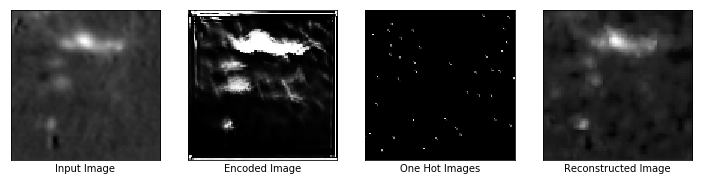

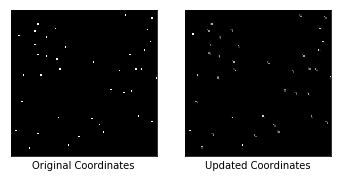

Epochs: 680, Loss: 0.0020858764182776213
Similarity scores: [7.8415815e-03 3.9800178e-02 5.2850242e-03 3.2827880e-02 6.6894643e-02
 1.5204727e-02 3.6435998e-03 3.6792781e-03 5.4585721e-02 8.1589576e-03
 4.7286344e-03 6.9295332e-02 1.0506865e-01 8.2385480e-02 1.1839023e-01
 2.0949291e-01 6.1379749e-02 2.0546716e-02 9.4347605e-03 1.1210450e-03
 3.5899136e-02 2.1019716e-04 7.4240100e-04 1.1323345e-02 4.6882279e-02
 2.4954723e-03 8.8953390e-04 3.6184657e-02 2.2849108e-01 2.8048581e-01
 5.2327611e-02 3.3248924e-02 9.9973714e-01 5.6932857e-03 6.4191329e-01
 3.1772889e-02 1.4659189e-02 6.8037227e-02 3.7822425e-02 3.4238496e-01]
Updated Coordinates: [[[0.9321178  0.12043496]]]
Gradient min:-0.001768138143233955, max:0.0007257962715812027



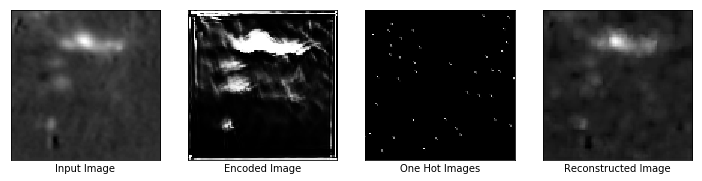

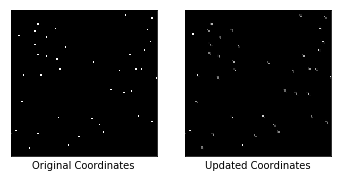

Epochs: 690, Loss: 0.0015634273877367377
Similarity scores: [6.29945984e-03 5.79399765e-02 6.59371773e-03 3.24346162e-02
 8.21556821e-02 1.75058786e-02 3.20508354e-03 5.87043073e-03
 3.49301063e-02 7.90433306e-03 1.20944413e-03 7.54508898e-02
 1.06373444e-01 1.02305144e-01 1.76239654e-01 2.84537107e-01
 8.58976021e-02 2.07812134e-02 1.46374693e-02 1.11687602e-03
 4.92741838e-02 2.46263022e-04 1.30108290e-03 1.44270668e-02
 4.30839024e-02 3.25725158e-03 9.52008530e-04 4.75965142e-02
 1.73990756e-01 3.90590638e-01 3.97051796e-02 4.67473343e-02
 9.99893904e-01 7.56042171e-03 6.96401894e-01 3.56025286e-02
 8.14299658e-03 8.89822915e-02 6.05495311e-02 3.89036149e-01]
Updated Coordinates: [[[0.93192816 0.12053908]]]
Gradient min:-0.000854813086334616, max:0.0009663268574513495



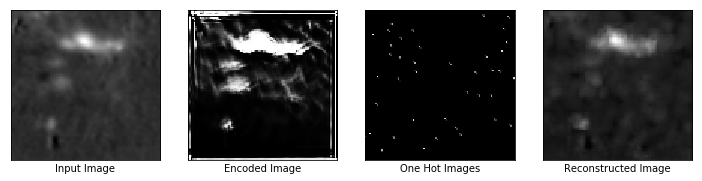

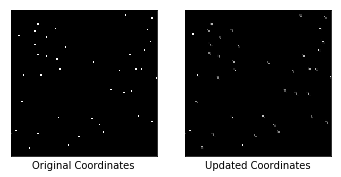

Epochs: 700, Loss: 0.0014536973321810365
Similarity scores: [5.81712741e-03 6.42027631e-02 6.91043865e-03 3.89219262e-02
 1.02136284e-01 1.77749265e-02 7.13959429e-03 5.24093490e-03
 3.39370929e-02 8.79774150e-03 8.11562582e-04 1.01931103e-01
 1.05684116e-01 1.00828536e-01 1.80876419e-01 2.54482329e-01
 1.20006680e-01 2.57304646e-02 1.47321103e-02 1.11579103e-03
 4.40969244e-02 3.16781225e-04 1.33731393e-02 1.31044760e-02
 4.48379964e-02 2.49801553e-03 1.03189109e-03 3.59436572e-02
 2.26428330e-01 2.72756636e-01 4.38156426e-02 5.13762422e-02
 9.99760270e-01 9.12062824e-03 6.87186182e-01 1.41376033e-02
 9.85116325e-03 6.95385113e-02 5.35036847e-02 3.68489176e-01]
Updated Coordinates: [[[0.93176997 0.12077156]]]
Gradient min:-0.0008873261976987123, max:0.0006050221272744238



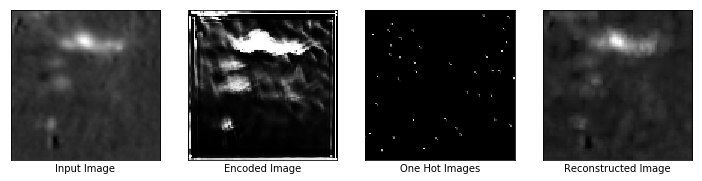

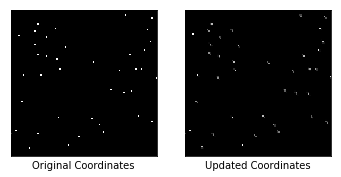

Epochs: 710, Loss: 0.0013067723484709859
Similarity scores: [2.13113278e-02 8.59836787e-02 1.69372540e-02 6.69914037e-02
 1.21112935e-01 3.56912538e-02 7.08831800e-03 1.10775707e-02
 1.10396214e-01 1.70165263e-02 2.01234315e-03 1.03621416e-01
 1.54762551e-01 1.57548845e-01 2.30390862e-01 3.24278921e-01
 1.50640249e-01 4.09837253e-02 2.75532473e-02 1.11579709e-03
 7.23696202e-02 9.40355356e-04 1.99606828e-02 1.84973814e-02
 6.70863390e-02 7.14126229e-03 2.89399968e-03 6.71932250e-02
 2.41788462e-01 4.89791155e-01 6.97504580e-02 9.28012282e-02
 9.99084473e-01 2.01077182e-02 6.76995754e-01 3.63898128e-02
 2.34989710e-02 1.05447963e-01 7.75079802e-02 3.91435206e-01]
Updated Coordinates: [[[0.9315814  0.12133078]]]
Gradient min:-0.0004091978189535439, max:0.0004892873112112284



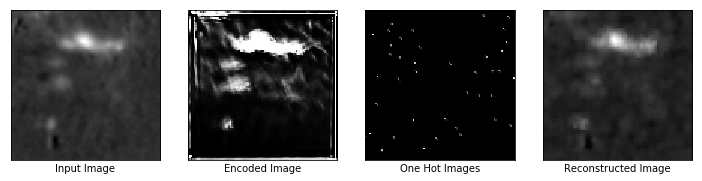

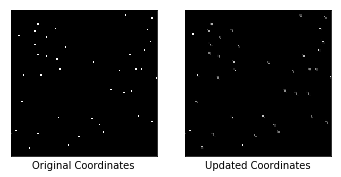

Epochs: 720, Loss: 0.0013713887892663479
Similarity scores: [1.5598338e-02 8.4322885e-02 1.1747818e-02 5.4673757e-02 9.4853066e-02
 2.9004846e-02 7.4406308e-03 1.0065993e-02 2.1319076e-01 1.4825126e-02
 1.3492774e-03 9.3890421e-02 1.3559005e-01 1.4033246e-01 1.7586887e-01
 3.1463447e-01 1.3222374e-01 3.8609520e-02 2.4770277e-02 1.1193712e-03
 7.2298825e-02 9.6729997e-04 3.8093312e-03 2.6360676e-02 6.7828342e-02
 5.1265783e-03 2.3016934e-03 4.6591029e-02 2.6130569e-01 4.1691312e-01
 6.0098078e-02 8.0879547e-02 9.9896175e-01 1.1890879e-02 6.8561167e-01
 6.9835633e-02 1.5584477e-02 8.6093336e-02 5.3961273e-02 4.0877712e-01]
Updated Coordinates: [[[0.9318085  0.12136069]]]
Gradient min:-0.0005152659141458571, max:0.0002648819063324481



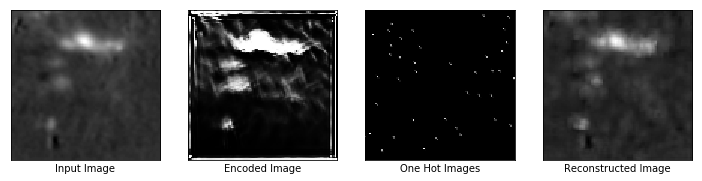

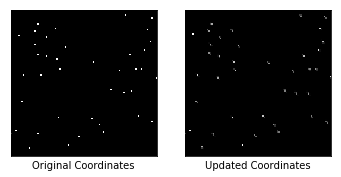

Epochs: 730, Loss: 0.0011748811230063438
Similarity scores: [0.01557955 0.08849034 0.01342089 0.05819239 0.10437624 0.02835667
 0.0028741  0.00945385 0.23544922 0.0146719  0.00135599 0.09130739
 0.1388064  0.1412827  0.19889039 0.3171785  0.13631023 0.03872021
 0.02566086 0.00112033 0.06577775 0.00105481 0.01096912 0.02355571
 0.07074883 0.00645473 0.00193922 0.04567153 0.22195603 0.5441763
 0.06179387 0.06670499 0.99699163 0.015202   0.7202141  0.06429687
 0.01039704 0.10433475 0.05085607 0.4215086 ]
Updated Coordinates: [[[0.9318302  0.12140798]]]
Gradient min:-0.00019122721278108656, max:0.0002562674635555595



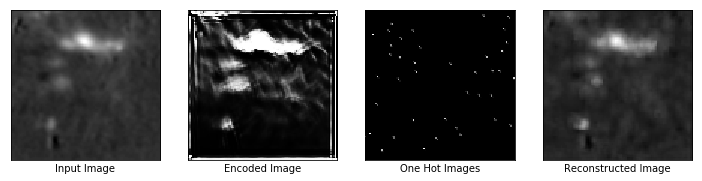

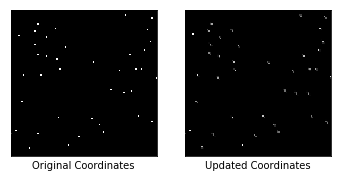

Epochs: 740, Loss: 0.001168023212812841
Similarity scores: [0.01278463 0.08469    0.01919382 0.08456827 0.11736232 0.04192179
 0.0052008  0.01407796 0.28118822 0.02098609 0.00270963 0.08923066
 0.16513452 0.1865064  0.19100791 0.36889392 0.16048625 0.04752548
 0.03588416 0.00112028 0.08299084 0.00135552 0.01869617 0.04064517
 0.06541109 0.00939935 0.00367661 0.04675469 0.22843118 0.5230864
 0.06969327 0.08284037 0.9959773  0.01970748 0.7250471  0.06609197
 0.01312366 0.11690257 0.06890804 0.46178758]
Updated Coordinates: [[[0.93186104 0.12153768]]]
Gradient min:-0.00018207199173048139, max:0.00019989811698906124



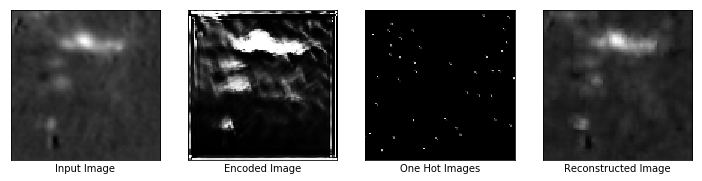

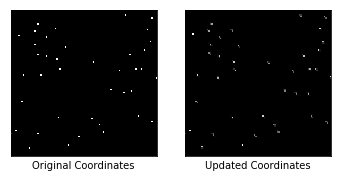

Epochs: 750, Loss: 0.0011279628379270434
Similarity scores: [0.0143602  0.09258455 0.01516676 0.06265838 0.11387993 0.03135141
 0.00133069 0.01527346 0.19444652 0.0144866  0.00257787 0.10095634
 0.12720303 0.17578864 0.22014692 0.35201854 0.157534   0.03905877
 0.02872817 0.00112101 0.07992374 0.00132239 0.01234613 0.03480475
 0.06975772 0.01005213 0.00309515 0.0457291  0.22339354 0.46469966
 0.07370421 0.06355335 0.9970522  0.02071697 0.7523203  0.05056707
 0.00896146 0.13166352 0.07227426 0.42385712]
Updated Coordinates: [[[0.93175894 0.12131112]]]
Gradient min:-0.0002809088327921927, max:0.0001331790117546916



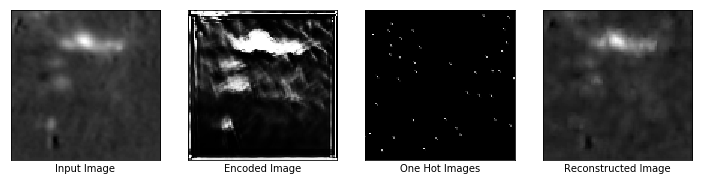

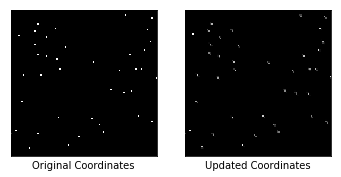

Epochs: 760, Loss: 0.0012327414005994797
Similarity scores: [0.00790236 0.0905326  0.01933668 0.08323013 0.12272186 0.0414755
 0.00615259 0.01326185 0.17780825 0.02066792 0.00197191 0.10138831
 0.14560421 0.1778607  0.19212273 0.4022244  0.13407503 0.04444335
 0.03437576 0.00112461 0.10863613 0.00142039 0.0138011  0.04317289
 0.0847073  0.0082894  0.00354671 0.05123469 0.23432669 0.54075056
 0.05744544 0.08855524 0.9979596  0.01524188 0.7181367  0.06927574
 0.01441611 0.1105151  0.08062389 0.46579513]
Updated Coordinates: [[[0.93167776 0.12115186]]]
Gradient min:-0.00012528857041615993, max:0.00045287187094800174



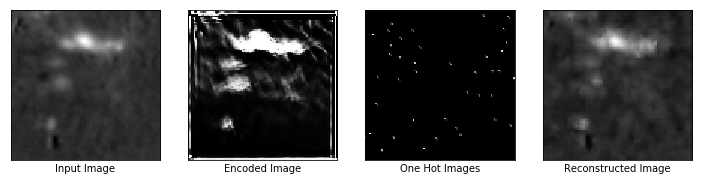

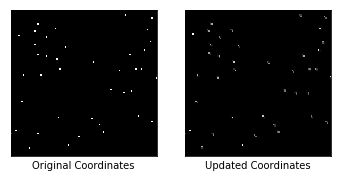

Epochs: 770, Loss: 0.0014097914099693298
Similarity scores: [0.00505408 0.06314225 0.01128946 0.05482572 0.08550544 0.02625893
 0.00603365 0.00949438 0.2651164  0.01394081 0.00271484 0.05856971
 0.12042022 0.1532186  0.13806097 0.3099566  0.11535785 0.03140046
 0.02382159 0.00111936 0.05087507 0.00111316 0.00566577 0.0225885
 0.0508215  0.00556843 0.00203066 0.02775382 0.20108253 0.5451712
 0.04473592 0.04748797 0.99700725 0.00882811 0.76033926 0.05817731
 0.00798222 0.0849852  0.03643243 0.40331462]
Updated Coordinates: [[[0.93166965 0.12116686]]]
Gradient min:-0.0003412938385736197, max:0.0010255601955577731



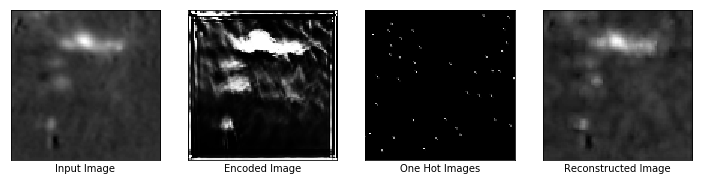

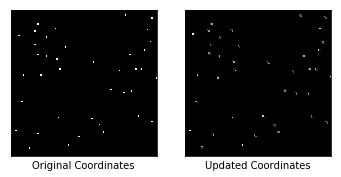

Epochs: 780, Loss: 0.001248423010110855
Similarity scores: [0.01113639 0.09134677 0.01629804 0.0673577  0.10080203 0.03298094
 0.00580449 0.0114113  0.22155155 0.02202377 0.00294477 0.07014323
 0.15653151 0.13799879 0.17651027 0.35084763 0.1232244  0.04652169
 0.0255559  0.00111812 0.11075626 0.00181987 0.00426852 0.02920498
 0.06770072 0.00924075 0.00246666 0.04106307 0.23333374 0.63649744
 0.05621389 0.06370055 0.9977521  0.01154674 0.71594924 0.05106676
 0.00946164 0.1177802  0.03734444 0.42147368]
Updated Coordinates: [[[0.931528   0.12107825]]]
Gradient min:-0.000547997304238379, max:0.0002680132747627795



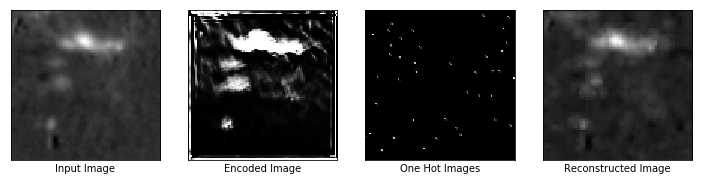

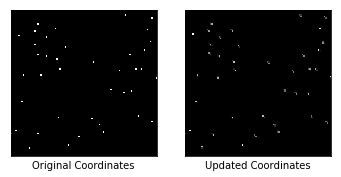

Epochs: 790, Loss: 0.0013960797805339098
Similarity scores: [4.8833685e-03 5.8244675e-02 4.8354599e-03 3.1822026e-02 7.1706854e-02
 1.3853608e-02 2.0877500e-03 2.2060361e-03 2.6581970e-01 5.9020552e-03
 1.0358347e-03 2.7922235e-02 1.2282418e-01 1.2178445e-01 1.2526202e-01
 2.9043424e-01 7.1163490e-02 2.0271771e-02 1.2366194e-02 1.1146675e-03
 5.3615049e-02 2.0455591e-04 6.1138003e-04 8.9783818e-03 3.8380381e-02
 1.5642316e-03 4.4626623e-04 1.9455558e-02 1.8611868e-01 4.5860833e-01
 2.2438781e-02 3.7010700e-02 9.9983108e-01 3.3601711e-03 7.0689082e-01
 2.1404829e-02 8.3266227e-03 4.2790353e-02 2.5514549e-02 3.6199275e-01]
Updated Coordinates: [[[0.93112147 0.12065129]]]
Gradient min:-0.0006063349428586662, max:0.0003302989061921835



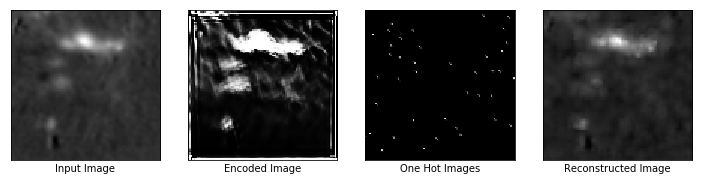

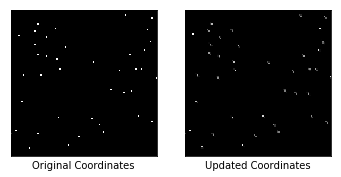

Epochs: 800, Loss: 0.0011773414444178343
Similarity scores: [0.00685049 0.06643666 0.01514094 0.06368944 0.12879087 0.02959394
 0.00404463 0.01461643 0.10580838 0.01861972 0.00176988 0.07657615
 0.14254194 0.18619554 0.20588958 0.36431387 0.18183394 0.03669103
 0.02798346 0.00111459 0.05172778 0.00211031 0.01866311 0.02592341
 0.05942678 0.00788015 0.00378158 0.04110155 0.23795782 0.5809514
 0.05038811 0.0620319  0.99763083 0.01053742 0.6685575  0.14226687
 0.00970058 0.09308227 0.06010951 0.3316145 ]
Updated Coordinates: [[[0.93107194 0.12074033]]]
Gradient min:-9.799874533200637e-05, max:0.0004065560351591557



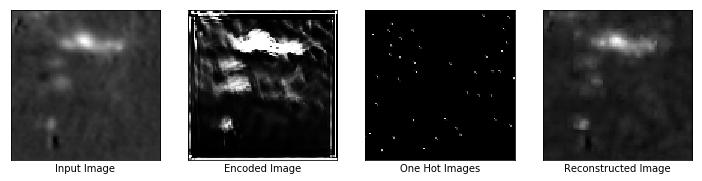

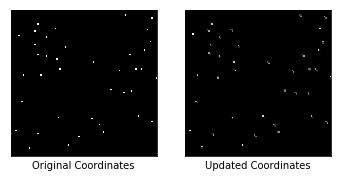

Epochs: 810, Loss: 0.0012110648676753044
Similarity scores: [0.01759316 0.08020534 0.01641797 0.06898935 0.11968552 0.02880783
 0.00433753 0.01000495 0.10283076 0.01911331 0.00372886 0.09816236
 0.12590572 0.16441269 0.14835523 0.3305656  0.13622576 0.03503561
 0.02927347 0.0011127  0.04725455 0.00164599 0.00776144 0.03335416
 0.05444932 0.01003339 0.00325416 0.04376507 0.25298682 0.4660494
 0.05841488 0.06933612 0.9977497  0.01438137 0.6888635  0.07958532
 0.00692882 0.08897309 0.05938438 0.34216973]
Updated Coordinates: [[[0.931383 0.120845]]]
Gradient min:-0.0004003449284937233, max:7.579544035252184e-05



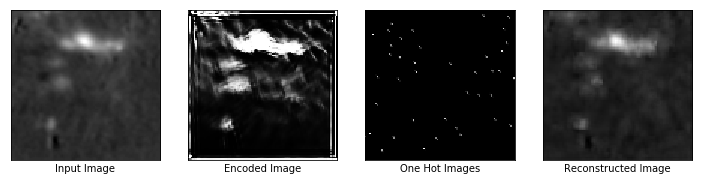

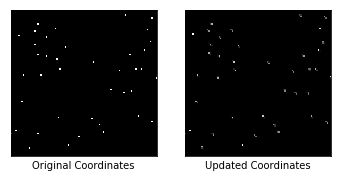

Epochs: 820, Loss: 0.0010313206585124135
Similarity scores: [0.00796297 0.082038   0.01779512 0.07534565 0.11758567 0.0349947
 0.0047106  0.01754448 0.1012209  0.02053768 0.00189977 0.08736759
 0.12869585 0.16933176 0.21726021 0.44151437 0.17052878 0.04197244
 0.03296867 0.00111264 0.08609124 0.00189356 0.01874415 0.03317842
 0.0635478  0.01146097 0.00352678 0.05027051 0.24001795 0.7004989
 0.07710099 0.07311963 0.99598026 0.01517335 0.7388971  0.0623796
 0.00719727 0.11109253 0.0720523  0.34327278]
Updated Coordinates: [[[0.9314778  0.12106521]]]
Gradient min:-0.0004628770984709263, max:0.00043172764708288014



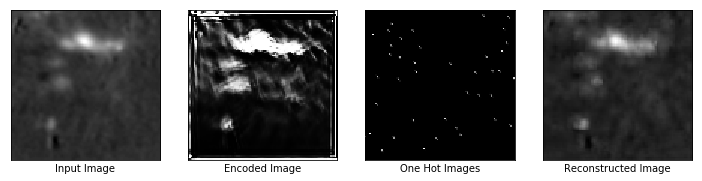

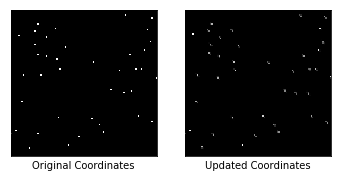

Epochs: 830, Loss: 0.0013834730489179492
Similarity scores: [9.17183235e-03 8.07506740e-02 2.29363982e-02 9.12908837e-02
 1.30391002e-01 4.08219062e-02 5.61665511e-03 2.10132115e-02
 1.02453679e-01 2.53406428e-02 9.16656514e-04 8.98375362e-02
 1.30326167e-01 1.93891630e-01 2.77822167e-01 4.43991125e-01
 2.11228624e-01 4.63460386e-02 3.85150202e-02 1.11382175e-03
 1.09772325e-01 3.30389640e-03 2.55132075e-02 4.56614308e-02
 6.54368401e-02 1.37027493e-02 4.75514913e-03 5.58499731e-02
 2.48134911e-01 7.21981585e-01 7.17334524e-02 7.32057840e-02
 9.96841371e-01 1.46492850e-02 7.07265973e-01 7.08282068e-02
 1.39904022e-02 1.33411318e-01 7.55914450e-02 3.48648220e-01]
Updated Coordinates: [[[0.9313286  0.12082912]]]
Gradient min:-0.000249928270932287, max:0.00143479707185179



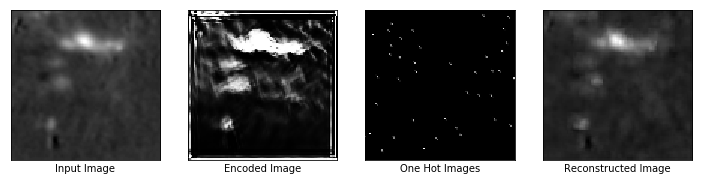

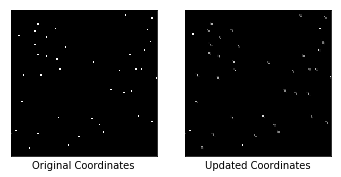

Epochs: 840, Loss: 0.0013584651751443744
Similarity scores: [0.00604853 0.08110709 0.02269522 0.07656036 0.1354988  0.03815145
 0.00459213 0.02167437 0.20245005 0.02487643 0.00103208 0.0745629
 0.13969445 0.18602245 0.23856665 0.42343736 0.18553469 0.04768537
 0.03275338 0.0011134  0.17211573 0.00288218 0.01452261 0.04059813
 0.0709699  0.0138109  0.00572122 0.04333716 0.22065513 0.538346
 0.05078293 0.06464203 0.9969603  0.01407938 0.69203585 0.11406853
 0.00984057 0.13300674 0.06850329 0.3248222 ]
Updated Coordinates: [[[0.9309918  0.12102527]]]
Gradient min:-0.00045918102841824293, max:0.0013356267008930445



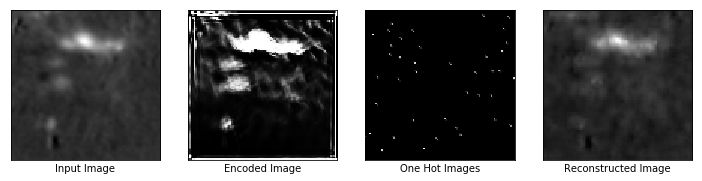

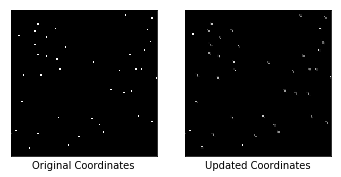

Epochs: 850, Loss: 0.0012490891385823488
Similarity scores: [6.87240856e-03 8.20642710e-02 1.55242933e-02 5.65389283e-02
 1.21926375e-01 2.94567496e-02 3.18637700e-03 1.37482770e-02
 1.40375361e-01 1.50587037e-02 8.97908816e-04 1.15894124e-01
 1.20617315e-01 1.64132327e-01 2.01257557e-01 3.70028913e-01
 1.81123614e-01 3.17967348e-02 2.58271676e-02 1.11276191e-03
 7.03115389e-02 1.45859504e-03 1.62656493e-02 3.34147215e-02
 5.54904491e-02 6.37383899e-03 2.70431628e-03 5.31821288e-02
 2.56915718e-01 6.31740808e-01 4.00980972e-02 6.84627667e-02
 9.99513030e-01 1.08095380e-02 6.31852746e-01 9.30828825e-02
 2.94247512e-02 8.39292407e-02 6.15529753e-02 3.81009400e-01]
Updated Coordinates: [[[0.9314006 0.1203022]]]
Gradient min:-0.0004313660319894552, max:0.0008923026616685092



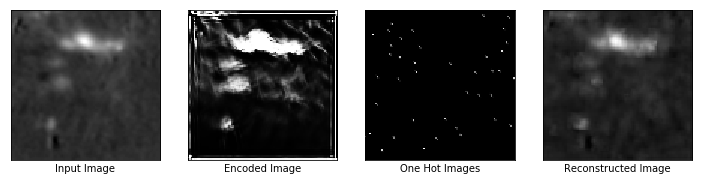

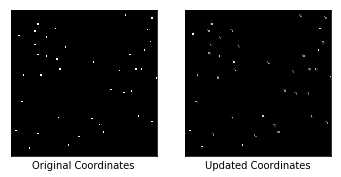

Epochs: 860, Loss: 0.0010262560099363327
Similarity scores: [6.07608072e-03 8.19727108e-02 1.65416747e-02 7.49850422e-02
 1.06592797e-01 2.85896007e-02 3.76978167e-03 1.41282585e-02
 2.35271841e-01 1.99193265e-02 8.75761849e-04 8.25039372e-02
 1.20015539e-01 1.51996911e-01 1.59899324e-01 3.51609647e-01
 1.64872319e-01 3.78961153e-02 3.00499648e-02 1.11584633e-03
 6.39123023e-02 2.54714955e-03 1.03114340e-02 3.07142325e-02
 5.73666990e-02 9.29111149e-03 3.65949608e-03 4.84870784e-02
 2.35508680e-01 5.91863573e-01 5.36841974e-02 5.97456209e-02
 9.97766018e-01 1.20572606e-02 6.87808096e-01 5.62998690e-02
 1.26582142e-02 1.11546606e-01 5.12043238e-02 3.63102823e-01]
Updated Coordinates: [[[0.9312675  0.12037715]]]
Gradient min:-0.00014091476623434573, max:0.00040791856008581817



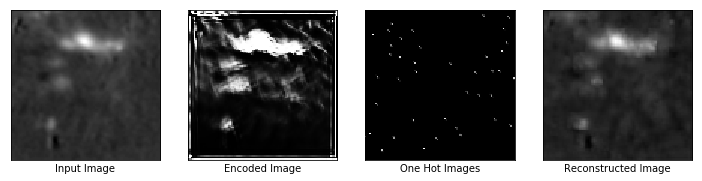

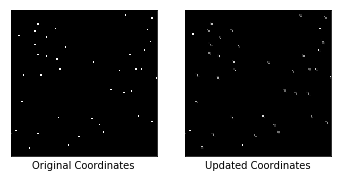

Epochs: 870, Loss: 0.0012791939079761505
Similarity scores: [3.58678703e-03 7.44222552e-02 1.66860633e-02 6.87779039e-02
 1.31764308e-01 3.33312228e-02 5.07359207e-03 1.66668762e-02
 2.11295813e-01 2.06697006e-02 8.17182357e-04 7.57019520e-02
 1.25065312e-01 1.47432148e-01 2.05247745e-01 4.02595729e-01
 1.69876277e-01 4.08410579e-02 2.75420304e-02 1.11808022e-03
 1.41454622e-01 1.99804618e-03 1.04328720e-02 2.89552622e-02
 6.37919307e-02 7.92775024e-03 4.01509134e-03 6.90861866e-02
 2.41634279e-01 6.38466537e-01 6.56972975e-02 6.88204244e-02
 9.98878241e-01 1.57664828e-02 7.14100361e-01 6.30196109e-02
 9.40009300e-03 1.23877615e-01 6.14041910e-02 3.72062445e-01]
Updated Coordinates: [[[0.9309232  0.12070505]]]
Gradient min:-0.0003750405739992857, max:0.0011420984519645572



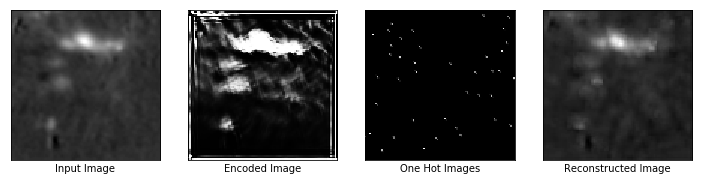

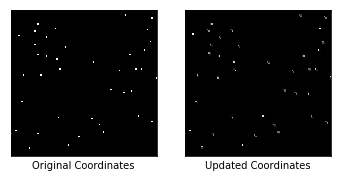

Epochs: 880, Loss: 0.0015538738807663321
Similarity scores: [1.0166020e-02 1.0725566e-01 1.9032836e-02 8.1295915e-02 1.3972659e-01
 3.5606567e-02 6.3632680e-03 1.8950248e-02 3.1592688e-01 2.0160507e-02
 6.9293391e-04 9.1444112e-02 1.3503744e-01 1.5905470e-01 2.2894281e-01
 4.4434443e-01 1.8512551e-01 4.2300414e-02 3.0235488e-02 1.1201437e-03
 1.7380434e-01 2.0255612e-03 3.5178442e-02 3.6734909e-02 6.2926896e-02
 7.1645770e-03 4.4378377e-03 7.5825654e-02 2.5201693e-01 5.4642862e-01
 4.6130642e-02 7.0514396e-02 9.9717975e-01 1.2641744e-02 7.1895725e-01
 2.6931355e-02 8.6382059e-03 1.3744809e-01 7.0820078e-02 3.5343739e-01]
Updated Coordinates: [[[0.93072265 0.12085077]]]
Gradient min:-0.0003431197546888143, max:0.0017510757315903902



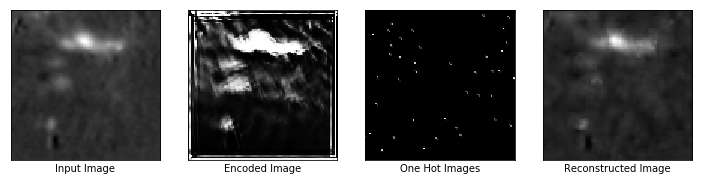

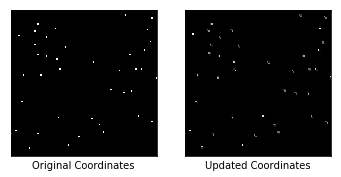

Epochs: 890, Loss: 0.001195732969790697
Similarity scores: [1.46787157e-02 9.26278010e-02 2.68135145e-02 9.40718055e-02
 1.29940316e-01 4.22372930e-02 6.86174864e-03 2.92878523e-02
 2.93606013e-01 2.85957772e-02 7.92451494e-04 1.09060764e-01
 1.29772186e-01 1.87392980e-01 2.46544704e-01 4.38721746e-01
 2.26224437e-01 4.47108261e-02 3.32761779e-02 1.11893355e-03
 1.30593807e-01 3.95861501e-03 7.21206069e-02 4.45715375e-02
 6.51197284e-02 1.77798979e-02 6.93943398e-03 4.57020663e-02
 2.75070608e-01 4.93391097e-01 6.31807446e-02 6.21608011e-02
 9.95420873e-01 1.97452959e-02 6.69243336e-01 1.00003734e-01
 1.42934136e-02 1.44560456e-01 6.67255595e-02 3.69542867e-01]
Updated Coordinates: [[[0.9308643  0.12077029]]]
Gradient min:-0.0002567031770013273, max:0.001043500960804522



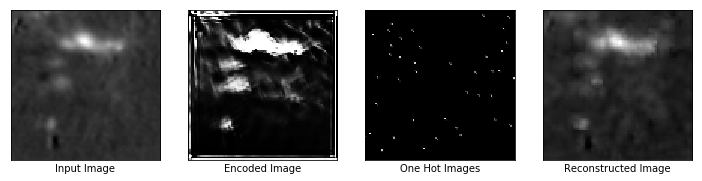

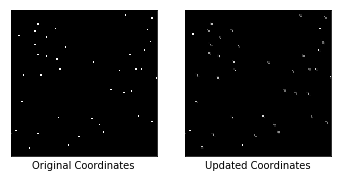

Epochs: 900, Loss: 0.0015282107051461935
Similarity scores: [6.2598567e-03 6.3812681e-02 1.5595032e-02 5.6497399e-02 1.0235841e-01
 2.5173400e-02 4.0039686e-03 1.5813915e-02 1.8070252e-01 1.7011452e-02
 6.2131492e-04 8.1325494e-02 9.7077101e-02 1.4414182e-01 1.7375344e-01
 3.5378814e-01 1.8646146e-01 3.1341545e-02 2.6054958e-02 1.1271170e-03
 7.8139640e-02 1.2439499e-03 3.0468302e-02 2.6852194e-02 5.3027775e-02
 5.3799935e-03 3.4886410e-03 4.5977898e-02 2.2986494e-01 4.5583290e-01
 4.6878994e-02 5.2737579e-02 9.9846977e-01 1.4052714e-02 6.2324953e-01
 5.4377511e-02 8.9872712e-03 8.5180819e-02 6.3509129e-02 3.1117657e-01]
Updated Coordinates: [[[0.93084306 0.12082656]]]
Gradient min:-0.00047142422408796847, max:0.001496479264460504



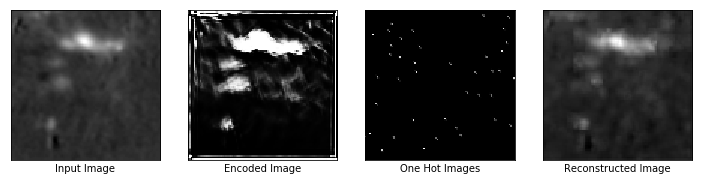

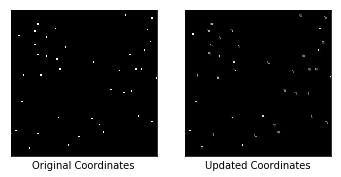

Epochs: 910, Loss: 0.0022134266328066587
Similarity scores: [2.2113482e-03 5.4732442e-02 8.2672089e-03 4.3035507e-02 1.0575752e-01
 1.6881272e-02 5.4978458e-03 5.7602893e-03 1.1393078e-01 8.6213686e-03
 5.7936163e-04 5.4359362e-02 9.4383232e-02 1.0442909e-01 1.2610556e-01
 3.0952141e-01 1.3542990e-01 1.8322369e-02 1.8187730e-02 1.1658544e-03
 8.4209405e-02 4.2608895e-04 1.0502806e-02 1.4926411e-02 3.8236290e-02
 2.5311743e-03 1.0656069e-03 3.6179833e-02 2.6903275e-01 4.8228776e-01
 3.8396809e-02 4.5245353e-02 9.9958640e-01 4.9791778e-03 6.9959092e-01
 3.9413612e-02 1.0717853e-02 5.9940591e-02 3.3086725e-02 2.7232552e-01]
Updated Coordinates: [[[0.93116343 0.12042087]]]
Gradient min:-0.0020678986329585314, max:0.0006961335311643779



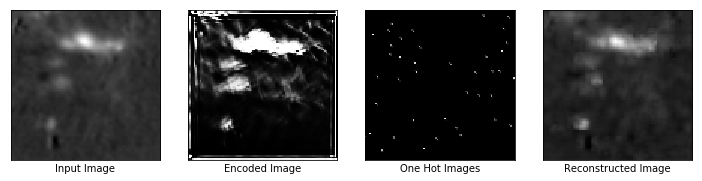

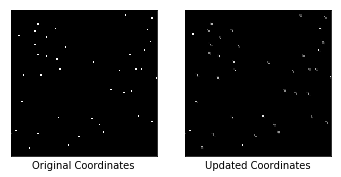

Epochs: 920, Loss: 0.001291861874051392
Similarity scores: [2.88353721e-03 7.08518624e-02 1.30710006e-02 5.66455461e-02
 1.32539257e-01 2.20294073e-02 6.53747376e-03 7.38717569e-03
 1.25562269e-02 1.26727000e-02 6.83826394e-04 6.00788668e-02
 1.06030859e-01 1.35951608e-01 1.82762340e-01 3.79232883e-01
 1.51103020e-01 2.78186165e-02 2.03223787e-02 1.14557543e-03
 1.24826685e-01 6.91515510e-04 3.45112220e-03 2.96595711e-02
 5.90284131e-02 4.35510790e-03 2.02259351e-03 5.20886034e-02
 2.23822221e-01 6.22714221e-01 3.75551544e-02 5.07633835e-02
 9.95366216e-01 9.14680865e-03 7.75856853e-01 1.00334235e-01
 1.14250602e-02 7.29588419e-02 4.72813733e-02 3.56118143e-01]
Updated Coordinates: [[[0.9313052  0.12017136]]]
Gradient min:-0.00034112369758076966, max:0.00024912547087296844



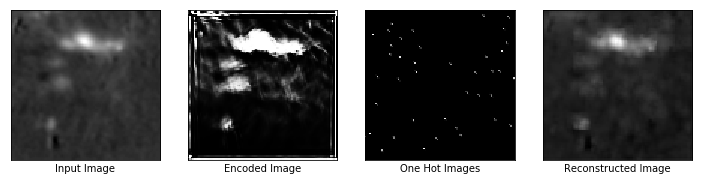

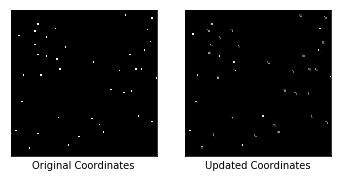

Epochs: 930, Loss: 0.0013174709165468812
Similarity scores: [3.13540408e-03 6.27155080e-02 9.97559074e-03 4.92863655e-02
 1.14033796e-01 2.05610879e-02 4.20191512e-03 8.22338462e-03
 7.74682015e-02 1.20058125e-02 4.35515423e-04 5.95172979e-02
 1.16674550e-01 1.22427322e-01 1.43796295e-01 3.23252052e-01
 1.38000742e-01 2.08714213e-02 2.29282659e-02 1.14448182e-03
 7.83923119e-02 1.03799347e-03 2.02953606e-03 2.04540659e-02
 4.33721952e-02 4.61857161e-03 2.00566486e-03 3.54470126e-02
 2.23430231e-01 5.06524265e-01 4.28283699e-02 5.45256957e-02
 9.96102154e-01 6.76331297e-03 6.83825910e-01 1.14458665e-01
 1.08788433e-02 7.23030940e-02 4.32008766e-02 3.62262696e-01]
Updated Coordinates: [[[0.9312338 0.1202511]]]
Gradient min:-0.0002888776652980596, max:0.00014908926095813513



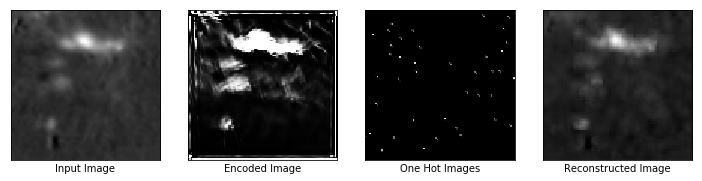

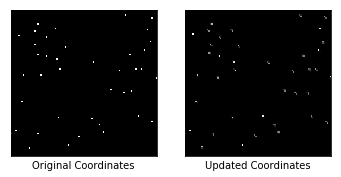

Epochs: 940, Loss: 0.0012615997111424804
Similarity scores: [2.29352410e-03 6.69737160e-02 1.64254867e-02 6.00529127e-02
 1.05248079e-01 2.49521155e-02 2.24000961e-03 8.17752164e-03
 7.43648633e-02 1.77834854e-02 8.84249806e-04 6.37072250e-02
 1.16542764e-01 1.34463206e-01 1.23026818e-01 3.11779320e-01
 1.74307674e-01 3.27314623e-02 3.30652259e-02 1.13344810e-03
 5.17867580e-02 1.64796540e-03 8.05065781e-03 3.43850665e-02
 4.97881323e-02 6.98775519e-03 2.83461879e-03 2.75859348e-02
 1.98482856e-01 5.03474295e-01 4.53437977e-02 4.54575792e-02
 9.87701774e-01 9.47468635e-03 7.40118265e-01 6.31783381e-02
 1.22003919e-02 6.43676519e-02 3.79035957e-02 3.73752773e-01]
Updated Coordinates: [[[0.9311389  0.12044993]]]
Gradient min:-0.0002394739567534998, max:0.00027851140475831926



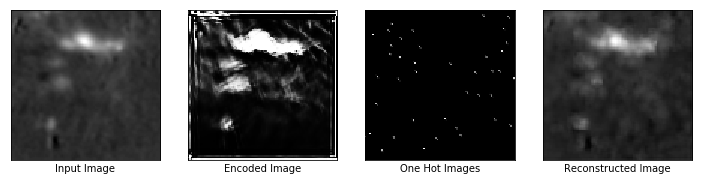

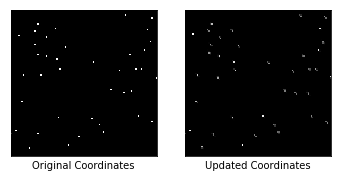

Epochs: 950, Loss: 0.0012873572995886207
Similarity scores: [3.48564493e-03 6.63338080e-02 1.59033574e-02 6.16178066e-02
 1.41839370e-01 2.86394656e-02 3.94382002e-03 1.30432108e-02
 9.39695984e-02 1.80555116e-02 7.92975246e-04 6.80035651e-02
 1.23764344e-01 1.43178359e-01 1.81819901e-01 3.56582075e-01
 1.61183685e-01 2.67492868e-02 2.92714983e-02 1.13905617e-03
 9.07664821e-02 1.67178304e-03 1.04685910e-02 2.97511630e-02
 4.38029580e-02 7.27009587e-03 2.49164458e-03 4.68276665e-02
 2.44028986e-01 5.45591831e-01 5.26655205e-02 6.12342805e-02
 9.94443297e-01 1.10519864e-02 6.80589795e-01 1.24504656e-01
 1.52909234e-02 9.43702981e-02 5.86303286e-02 3.51686895e-01]
Updated Coordinates: [[[0.9311989  0.12046581]]]
Gradient min:-0.00037518911994993687, max:0.0009615446324460208



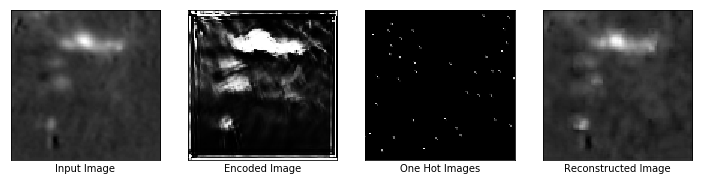

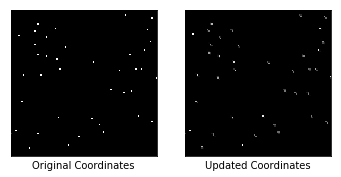

Epochs: 960, Loss: 0.0010806627105921507
Similarity scores: [5.13570104e-03 8.93958136e-02 2.56716050e-02 8.13024268e-02
 1.40541345e-01 4.09587696e-02 1.83905254e-03 1.72717534e-02
 2.55060345e-01 2.55941693e-02 9.31983173e-04 1.05519526e-01
 1.47025198e-01 1.84599444e-01 1.63102612e-01 3.66518140e-01
 1.96385652e-01 4.31567803e-02 5.01361862e-02 1.12601067e-03
 6.27417862e-02 3.27057461e-03 3.32778804e-02 3.02762389e-02
 6.39289245e-02 1.21273603e-02 5.64183481e-03 3.71677503e-02
 2.86065698e-01 5.69608688e-01 7.25611821e-02 7.30894431e-02
 9.80842590e-01 1.54491374e-02 7.10486710e-01 1.51612908e-01
 1.62580647e-02 9.44710672e-02 6.78276196e-02 3.38986278e-01]
Updated Coordinates: [[[0.9314565  0.12033002]]]
Gradient min:-0.00017933407798409462, max:0.0002693825226742774



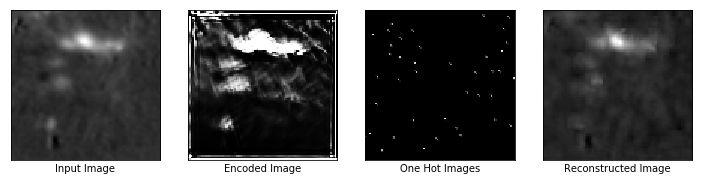

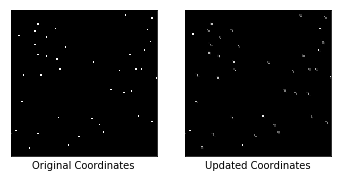

Epochs: 970, Loss: 0.0018250300781801343
Similarity scores: [5.00161247e-03 1.02139466e-01 2.31883936e-02 8.46653581e-02
 1.47930056e-01 3.98577340e-02 6.89036492e-03 2.30940506e-02
 4.00515348e-01 2.60484237e-02 8.66481918e-04 1.35787979e-01
 1.36860088e-01 1.85690001e-01 2.37900123e-01 3.81330281e-01
 2.03131825e-01 4.37007174e-02 3.46830674e-02 1.12108397e-03
 2.24299610e-01 2.31616432e-03 4.70912531e-02 7.12557882e-02
 7.50915706e-02 6.37949025e-03 6.74106972e-03 6.56082407e-02
 2.66610503e-01 6.54031873e-01 7.24836513e-02 7.30265304e-02
 9.99047935e-01 1.48022175e-02 6.87133789e-01 1.47980869e-01
 1.44746583e-02 1.05907738e-01 8.33982229e-02 3.56031626e-01]
Updated Coordinates: [[[0.9312394  0.12060835]]]
Gradient min:-0.000334482901962474, max:0.0020496470388025045



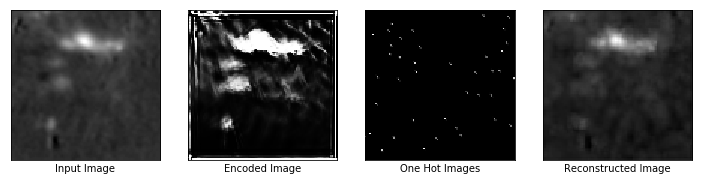

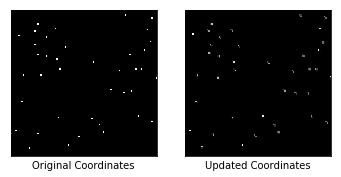

Epochs: 980, Loss: 0.0014829343417659402
Similarity scores: [4.95182397e-03 7.41935894e-02 1.82700865e-02 6.47353157e-02
 1.21474139e-01 3.47096696e-02 6.01261808e-03 1.39648123e-02
 3.91606614e-02 1.68783069e-02 9.62304010e-04 1.03374086e-01
 1.39447629e-01 1.53362751e-01 1.58091068e-01 3.31540495e-01
 2.04114676e-01 3.35607193e-02 3.49627808e-02 1.13585696e-03
 1.64516762e-01 1.96256884e-03 9.12462082e-03 2.74938922e-02
 6.11117631e-02 7.64224865e-03 3.57153965e-03 3.56347710e-02
 2.77814507e-01 7.72717714e-01 6.13659620e-02 6.18608296e-02
 9.98176336e-01 1.11203082e-02 6.53286338e-01 8.03458840e-02
 1.25767095e-02 7.73141310e-02 6.12466484e-02 3.84384423e-01]
Updated Coordinates: [[[0.93151677 0.12049063]]]
Gradient min:-9.542993939248845e-05, max:0.0005935578374192119



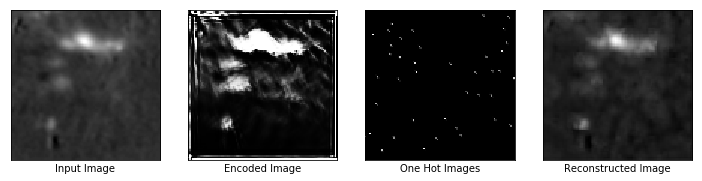

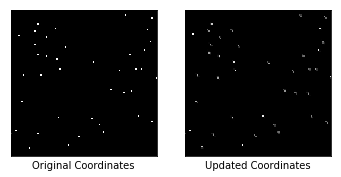

Epochs: 990, Loss: 0.0011505985166877508
Similarity scores: [8.75264220e-03 9.52897295e-02 1.78781189e-02 7.34662712e-02
 1.08733565e-01 2.91244704e-02 5.73180476e-03 1.23891653e-02
 1.70183480e-01 1.71032622e-02 5.83799963e-04 7.84286335e-02
 1.21544145e-01 1.68789938e-01 1.84908062e-01 3.34358692e-01
 2.04801515e-01 3.17351036e-02 3.26980017e-02 1.13845617e-03
 1.00553721e-01 2.04224535e-03 6.81462791e-03 3.17401774e-02
 6.76611140e-02 8.61589052e-03 3.28229251e-03 4.35618199e-02
 2.55278021e-01 7.74080515e-01 6.62299395e-02 6.41111061e-02
 9.95639682e-01 1.09628802e-02 7.19946265e-01 7.30700344e-02
 2.37135459e-02 6.71563819e-02 5.76375797e-02 4.20444250e-01]
Updated Coordinates: [[[0.93143684 0.12055562]]]
Gradient min:-0.00013910462439525872, max:0.0003192403819411993



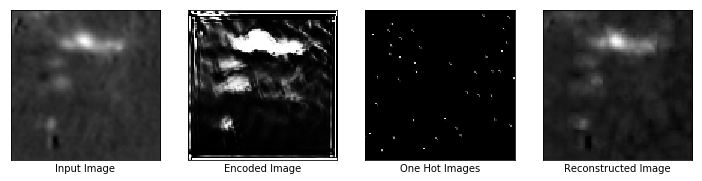

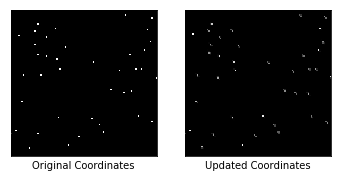

Epochs: 1000, Loss: 0.00117010367102921
Similarity scores: [3.57004534e-03 7.31265098e-02 1.46693168e-02 6.85351714e-02
 1.20663054e-01 2.55929083e-02 4.89098718e-03 1.28830327e-02
 1.75556883e-01 1.47792697e-02 5.95827587e-04 7.96858147e-02
 1.07581511e-01 1.61549196e-01 2.20750451e-01 3.87302577e-01
 2.08597153e-01 2.75299475e-02 2.35094614e-02 1.13479909e-03
 1.86741248e-01 1.90755469e-03 3.10224742e-02 2.85391547e-02
 4.54063006e-02 7.38548068e-03 2.70284084e-03 4.58533838e-02
 2.57004917e-01 6.50419772e-01 4.62484211e-02 4.56170850e-02
 9.98796701e-01 9.58227739e-03 7.29486406e-01 4.20924276e-02
 1.16256839e-02 9.64500308e-02 5.76261580e-02 3.48127425e-01]
Updated Coordinates: [[[0.9312579  0.12057842]]]
Gradient min:-0.0002282519853906706, max:0.0003999387554358691



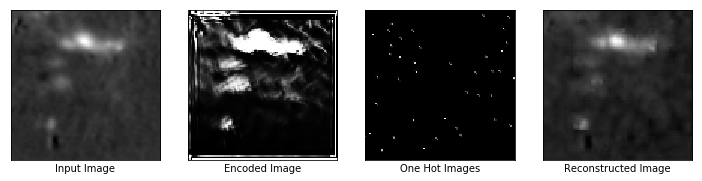

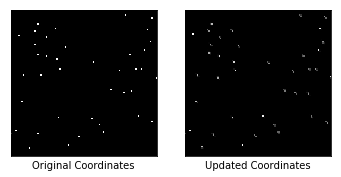

Epochs: 1010, Loss: 0.0013904476072639227
Similarity scores: [5.4303398e-03 7.4613988e-02 1.2088000e-02 5.2969098e-02 9.2548355e-02
 1.8791152e-02 4.9908301e-03 9.0007531e-03 2.5647280e-01 1.1964997e-02
 1.7096322e-03 9.9642806e-02 1.0921344e-01 2.0675401e-01 2.5543186e-01
 3.8323832e-01 2.0809005e-01 2.4444617e-02 2.8919145e-02 1.1562475e-03
 1.4557990e-01 8.9177658e-04 8.6663412e-03 2.3280500e-02 4.0542621e-02
 4.4846879e-03 2.4439760e-03 3.6377281e-02 2.4979675e-01 6.0724962e-01
 5.2960988e-02 4.8951298e-02 9.9803066e-01 1.3120941e-02 7.2373974e-01
 7.4948356e-02 1.4056359e-02 1.1442578e-01 8.0080241e-02 2.8069970e-01]
Updated Coordinates: [[[0.93119806 0.12055187]]]
Gradient min:-0.00010706889588618651, max:0.0009991000406444073



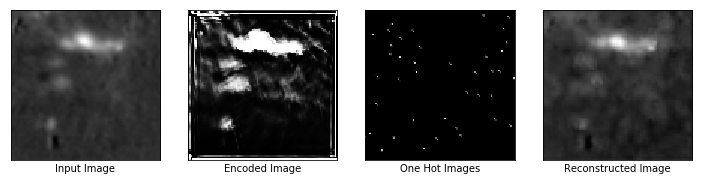

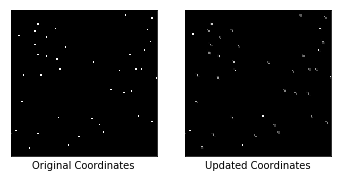

Epochs: 1020, Loss: 0.001342686708085239
Similarity scores: [7.20085576e-03 9.32941958e-02 1.99950859e-02 7.27315247e-02
 1.28421113e-01 3.64661887e-02 9.19559319e-03 1.48425279e-02
 1.34645596e-01 1.90913714e-02 7.35704438e-04 9.35292691e-02
 1.21313691e-01 1.38532966e-01 1.76852793e-01 3.44980240e-01
 1.92128703e-01 4.11147252e-02 2.85440888e-02 1.13670842e-03
 1.12305544e-01 1.88645243e-03 1.66659318e-02 2.91053858e-02
 4.54559699e-02 6.73977472e-03 3.30435252e-03 4.10194099e-02
 2.40847066e-01 5.52827537e-01 3.82845104e-02 6.23350888e-02
 9.97967362e-01 9.45196580e-03 6.17805719e-01 5.41894026e-02
 2.16466114e-02 7.64771551e-02 6.50146678e-02 3.42091769e-01]
Updated Coordinates: [[[0.9312749  0.12043959]]]
Gradient min:-0.0003650308644864708, max:0.00015679314674343914



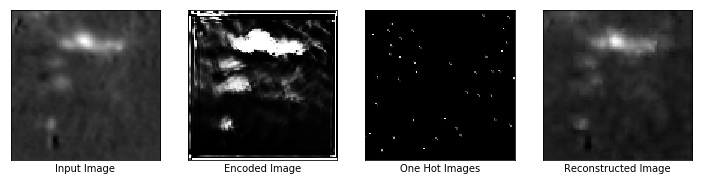

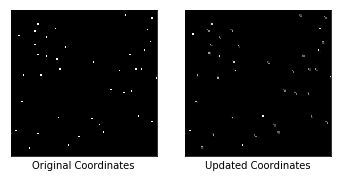

Epochs: 1030, Loss: 0.001639172900468111
Similarity scores: [2.88907182e-03 5.25366515e-02 1.14996564e-02 4.91209477e-02
 1.03741586e-01 1.90685913e-02 5.72072621e-03 1.01850843e-02
 1.51886158e-02 1.31905619e-02 7.59561721e-04 7.66115636e-02
 8.66888836e-02 1.20355427e-01 1.69800594e-01 3.76778156e-01
 2.00600147e-01 2.36224756e-02 2.43902616e-02 1.12952851e-03
 6.05375580e-02 1.09044067e-03 2.17081532e-02 1.93853211e-02
 3.70965004e-02 4.84522525e-03 2.17959913e-03 3.31932530e-02
 2.58222699e-01 4.81404006e-01 3.86563018e-02 4.19968069e-02
 9.98208940e-01 8.84311087e-03 7.18979716e-01 3.10756955e-02
 1.53951440e-02 7.32646212e-02 4.55329195e-02 2.90159792e-01]
Updated Coordinates: [[[0.9310749  0.12071967]]]
Gradient min:-0.0005375086911953986, max:0.001908177975565195



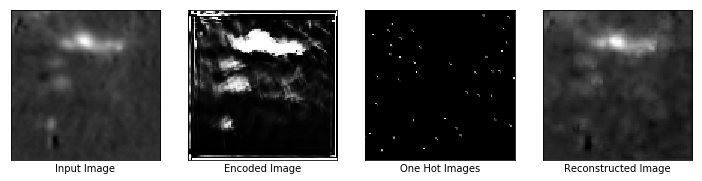

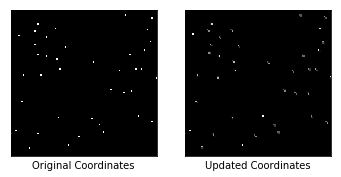

Epochs: 1040, Loss: 0.001538190059363842
Similarity scores: [3.19767976e-03 5.72913066e-02 1.45288054e-02 5.94340228e-02
 1.04424722e-01 2.30860654e-02 9.02067963e-03 1.17601901e-02
 6.69616461e-02 1.60387680e-02 5.96861180e-04 8.00730810e-02
 8.53825510e-02 1.13546595e-01 1.61318019e-01 4.16474551e-01
 1.83595568e-01 2.65619177e-02 2.38161087e-02 1.12233788e-03
 8.75910893e-02 1.53723126e-03 2.17552222e-02 2.27159485e-02
 4.19017859e-02 7.19024334e-03 2.34945980e-03 3.82325687e-02
 2.33075574e-01 4.05544579e-01 3.76547128e-02 5.18464893e-02
 9.99429345e-01 8.78259726e-03 6.81830049e-01 4.31703366e-02
 1.76337101e-02 6.59170076e-02 6.04481809e-02 3.42085660e-01]
Updated Coordinates: [[[0.9312496  0.12046027]]]
Gradient min:-0.0006504357443191111, max:0.001447367249056697



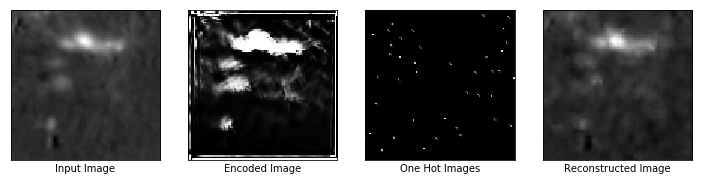

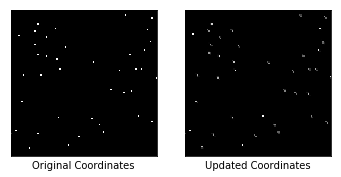

Epochs: 1050, Loss: 0.0012480394216254354
Similarity scores: [5.7005254e-03 7.2107442e-02 1.8266726e-02 6.6904917e-02 1.4576127e-01
 3.0033819e-02 6.3763834e-03 8.1800185e-03 6.1914351e-02 1.9491024e-02
 4.4334587e-04 9.6493281e-02 1.1167395e-01 1.4404124e-01 1.2671751e-01
 3.0065677e-01 1.8088613e-01 3.3317942e-02 3.4367077e-02 1.1182680e-03
 6.2395740e-02 1.5471643e-03 1.0768701e-02 2.2425385e-02 5.8048680e-02
 7.1362518e-03 3.0559900e-03 3.9063334e-02 2.5530323e-01 4.0310076e-01
 4.3827750e-02 6.2380627e-02 9.9949229e-01 1.0080147e-02 5.9265506e-01
 3.2188740e-02 3.2592691e-02 5.3669732e-02 5.4244734e-02 3.6401364e-01]
Updated Coordinates: [[[0.93112177 0.12060419]]]
Gradient min:-0.0005626367637887597, max:0.0006424480234272778



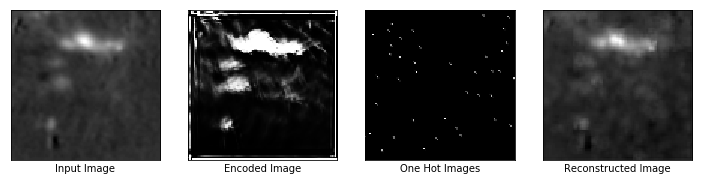

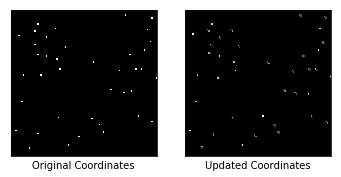

Epochs: 1060, Loss: 0.0013325096806511283
Similarity scores: [2.41569127e-03 4.69200872e-02 1.21618360e-02 4.66763787e-02
 9.41238031e-02 2.31266469e-02 8.20509065e-03 7.64156459e-03
 7.98031036e-03 1.23254685e-02 5.31469239e-04 9.08726752e-02
 7.25324899e-02 1.03942968e-01 1.14792623e-01 3.52026284e-01
 1.43017784e-01 2.35142224e-02 1.93061195e-02 1.11834530e-03
 3.54520679e-02 9.60957259e-04 1.64297167e-02 1.62211955e-02
 3.97347361e-02 4.73958580e-03 1.78804167e-03 2.66365632e-02
 2.37995341e-01 4.02203560e-01 3.42429392e-02 4.01594527e-02
 9.99784946e-01 5.82014723e-03 6.05698884e-01 5.23426011e-02
 1.67570170e-02 4.89184707e-02 4.58508097e-02 2.92656183e-01]
Updated Coordinates: [[[0.93146175 0.12028214]]]
Gradient min:-0.0005768132396042347, max:0.0008373671444132924



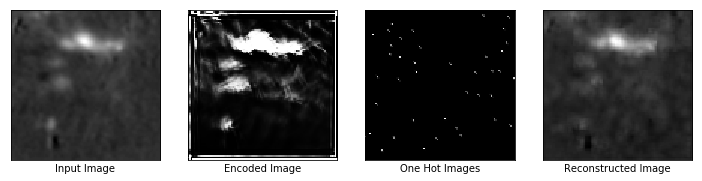

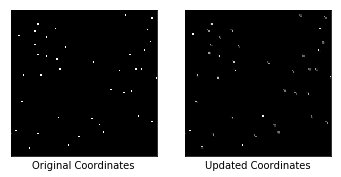

Epochs: 1070, Loss: 0.0012943808687850833
Similarity scores: [7.23855756e-03 6.35694936e-02 1.96059216e-02 6.81908876e-02
 1.12808041e-01 3.51980664e-02 5.55033982e-03 1.06162848e-02
 1.19420029e-02 2.16332208e-02 6.64228457e-04 9.17967483e-02
 1.06407881e-01 1.13754004e-01 1.24021553e-01 3.45094383e-01
 1.46910802e-01 3.86856087e-02 2.73195412e-02 1.11945812e-03
 4.37879302e-02 1.73094671e-03 1.30238365e-02 2.61178166e-02
 6.29400387e-02 8.89307354e-03 3.69168352e-03 4.64243516e-02
 2.68759966e-01 4.99485821e-01 3.88386324e-02 5.33973910e-02
 9.98976350e-01 8.97802226e-03 6.02180183e-01 3.96218151e-02
 2.40757633e-02 5.77354021e-02 5.40042333e-02 3.55792701e-01]
Updated Coordinates: [[[0.9313252  0.12043583]]]
Gradient min:-0.0006849454366602004, max:0.001255590352229774



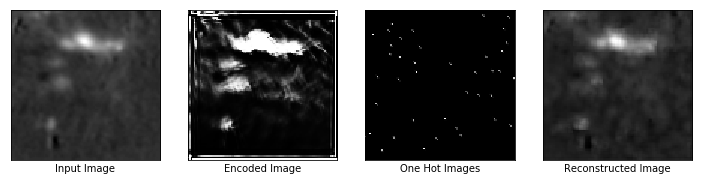

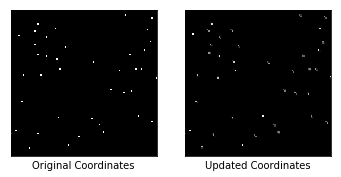

Epochs: 1080, Loss: 0.0010810181265696883
Similarity scores: [6.38392568e-03 7.76850730e-02 1.86990295e-02 6.71488121e-02
 1.14164792e-01 3.41663808e-02 4.65294300e-03 1.04842028e-02
 8.74576531e-03 1.76646151e-02 8.44146998e-04 7.40116537e-02
 1.16646335e-01 1.20635308e-01 1.49564430e-01 3.64411175e-01
 1.47556707e-01 3.63526456e-02 2.52897628e-02 1.12449436e-03
 5.61862923e-02 1.43351196e-03 1.39523791e-02 3.58104669e-02
 6.13884740e-02 5.28115965e-03 3.20372288e-03 4.20322865e-02
 2.58647740e-01 6.12382054e-01 4.72676791e-02 5.62160388e-02
 9.99547243e-01 9.23469383e-03 6.73903942e-01 4.47254814e-02
 1.84788518e-02 7.09078461e-02 5.41056804e-02 3.56528759e-01]
Updated Coordinates: [[[0.9313289  0.12040015]]]
Gradient min:-0.00030453543877229095, max:0.00012827788305003196



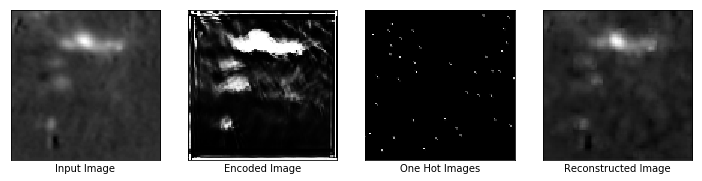

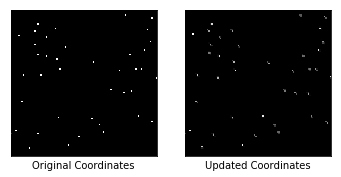

Epochs: 1090, Loss: 0.0018557613948360085
Similarity scores: [3.4255201e-03 4.2253952e-02 1.3180275e-02 5.4116827e-02 1.4062454e-01
 2.7023330e-02 9.3788849e-03 1.0091310e-02 1.0604172e-02 1.7568467e-02
 5.6235056e-04 5.9054993e-02 9.9891305e-02 9.3721241e-02 1.0903039e-01
 2.8679973e-01 1.0882414e-01 3.0229084e-02 2.4764545e-02 1.1286803e-03
 4.4461261e-02 8.9621916e-04 2.1772552e-02 3.0450271e-02 5.0534096e-02
 4.5848568e-03 2.3923153e-03 3.7407514e-02 2.5605628e-01 5.1397443e-01
 3.3881154e-02 5.8477577e-02 9.9959373e-01 7.3694792e-03 5.9354937e-01
 4.4375043e-02 1.9347528e-02 4.5852233e-02 4.5081094e-02 3.1959248e-01]
Updated Coordinates: [[[0.9316027 0.1201215]]]
Gradient min:-0.0013256297679618, max:0.00043987418757751584



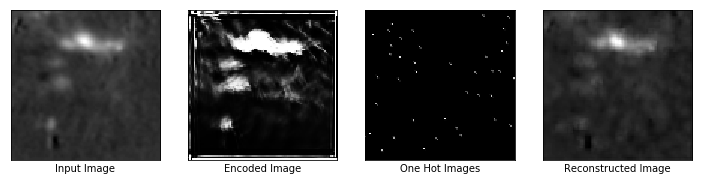

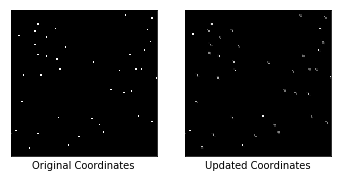

Epochs: 1100, Loss: 0.0011594173265621066
Similarity scores: [4.44125151e-03 7.44669437e-02 2.14864705e-02 7.93780759e-02
 1.46028504e-01 3.97966094e-02 5.21396520e-03 1.10836318e-02
 1.56830270e-02 2.35504042e-02 7.56660651e-04 6.97594509e-02
 1.29336894e-01 1.24043934e-01 1.31338939e-01 3.31423432e-01
 1.49187431e-01 3.97092663e-02 2.87015773e-02 1.11596251e-03
 5.60995489e-02 1.53473380e-03 9.63708572e-03 4.06395532e-02
 6.96899369e-02 7.49402400e-03 3.42574739e-03 4.79117557e-02
 2.53914982e-01 6.13595426e-01 4.87808511e-02 6.89269826e-02
 9.99084175e-01 9.42536630e-03 5.78818142e-01 3.91066372e-02
 2.97482237e-02 5.40976450e-02 5.72242290e-02 3.84445995e-01]
Updated Coordinates: [[[0.93133473 0.12032072]]]
Gradient min:-0.000215219784877263, max:0.00016704827430658042



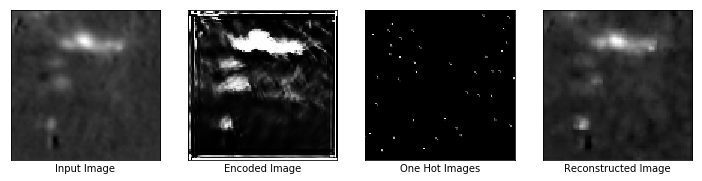

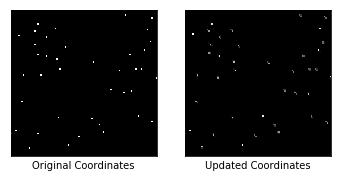

Epochs: 1110, Loss: 0.001097207423299551
Similarity scores: [3.57545051e-03 7.09330887e-02 2.73496378e-02 9.08399671e-02
 1.23334303e-01 4.41162623e-02 4.81495261e-03 1.58467218e-02
 7.53857344e-02 2.49068737e-02 6.89695997e-04 6.57300726e-02
 1.40189901e-01 1.20288469e-01 1.05583288e-01 2.94435680e-01
 1.28564358e-01 5.11634834e-02 3.34376767e-02 1.11880829e-03
 6.30233884e-02 2.12462107e-03 1.20545607e-02 6.64620101e-02
 8.03504810e-02 1.03775365e-02 4.58313851e-03 4.21262160e-02
 3.14740628e-01 5.23318052e-01 5.24794646e-02 7.08324686e-02
 9.97665882e-01 8.12902395e-03 6.07856214e-01 4.13581394e-02
 3.75920571e-02 4.70770858e-02 5.54119535e-02 4.05360639e-01]
Updated Coordinates: [[[0.9311889  0.12048137]]]
Gradient min:-0.0003269747830927372, max:0.0001868782564997673



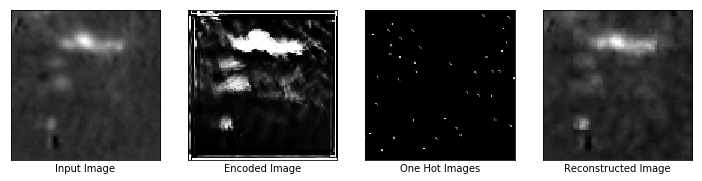

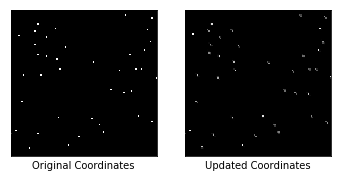

Epochs: 1120, Loss: 0.0012823970755562186
Similarity scores: [5.72156813e-03 7.76235014e-02 2.83406507e-02 9.54721346e-02
 1.45492435e-01 5.20106070e-02 6.96176384e-03 1.71206575e-02
 4.46550734e-02 3.05345953e-02 5.12868166e-04 7.95889795e-02
 1.18684597e-01 1.21274605e-01 1.05744928e-01 3.08137119e-01
 1.58025220e-01 4.73256595e-02 3.61935310e-02 1.11115503e-03
 6.85095116e-02 2.64049880e-03 1.47534767e-02 4.14837003e-02
 7.63210952e-02 1.21489335e-02 4.35457099e-03 4.62587923e-02
 2.71279484e-01 5.09433568e-01 4.44662385e-02 8.39659423e-02
 9.97832656e-01 1.03812218e-02 6.21848226e-01 4.14508507e-02
 5.13423681e-02 5.75154796e-02 6.45751208e-02 4.05463696e-01]
Updated Coordinates: [[[0.93111634 0.12056262]]]
Gradient min:-0.0008744819206185639, max:0.0007772676763124764



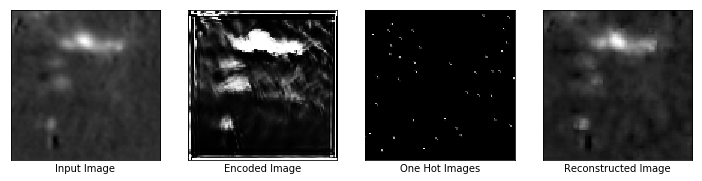

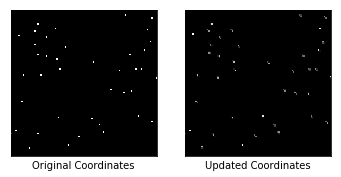

Epochs: 1130, Loss: 0.0010489138076081872
Similarity scores: [6.90232404e-03 1.02816395e-01 3.08907162e-02 8.92984420e-02
 1.57947719e-01 5.10761328e-02 6.15955517e-03 1.67229269e-02
 1.38628006e-01 3.05102635e-02 7.00991892e-04 7.06283078e-02
 1.62188724e-01 1.23453572e-01 1.56491071e-01 3.62396359e-01
 1.54795483e-01 6.37133121e-02 2.94235349e-02 1.13167590e-03
 9.23714563e-02 2.42419471e-03 4.19993699e-02 3.89565565e-02
 9.11783576e-02 9.52200219e-03 5.88971796e-03 6.06560856e-02
 3.07023764e-01 6.72855675e-01 5.24850786e-02 8.46936554e-02
 9.98824716e-01 9.52631515e-03 6.43747628e-01 9.69156474e-02
 3.32270116e-02 6.49790838e-02 6.25592917e-02 3.89133513e-01]
Updated Coordinates: [[[0.93109965 0.12057261]]]
Gradient min:-0.00013717036927118897, max:0.00014407742128241807



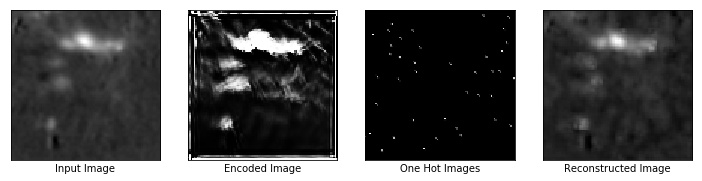

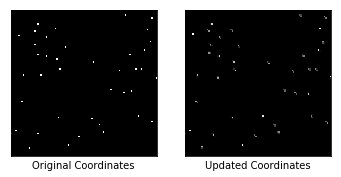

Epochs: 1140, Loss: 0.0013079363852739334
Similarity scores: [3.7374496e-03 1.0651909e-01 3.5873134e-02 1.2030748e-01 1.3349630e-01
 6.1306112e-02 6.3387943e-03 1.3722129e-02 2.2409610e-01 3.6865585e-02
 4.9729284e-04 7.0546150e-02 1.6263673e-01 1.5686345e-01 1.0633091e-01
 3.1370303e-01 1.7240448e-01 6.9332182e-02 3.6847912e-02 1.1013149e-03
 4.6551324e-02 4.8436644e-03 1.8157979e-02 5.7437658e-02 9.8140582e-02
 1.9401738e-02 6.2041110e-03 6.0640249e-02 2.8974232e-01 6.6026521e-01
 6.1341558e-02 9.0028003e-02 9.9438506e-01 1.0164993e-02 6.3210440e-01
 8.5008621e-02 5.0780453e-02 5.2683953e-02 5.0337676e-02 4.4320202e-01]
Updated Coordinates: [[[0.9311451  0.12065267]]]
Gradient min:-0.0005419691442511976, max:0.0009563383064232767



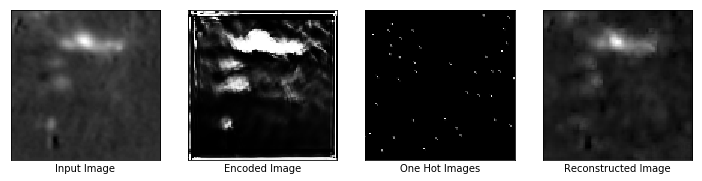

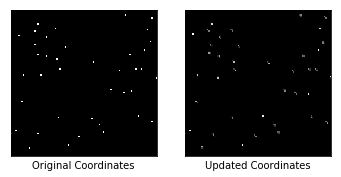

Epochs: 1150, Loss: 0.003956386353820562
Similarity scores: [5.60730509e-03 9.04780179e-02 1.35486899e-02 6.13570996e-02
 6.62209243e-02 2.78189443e-02 1.29161067e-02 6.41286233e-03
 1.09432666e-02 1.85147561e-02 6.76869357e-04 8.70210826e-02
 1.69305637e-01 1.22073278e-01 1.68305397e-01 3.08212459e-01
 1.00772284e-01 4.41129953e-02 1.75454151e-02 1.09374174e-03
 9.50705260e-02 7.98548339e-04 4.33945563e-03 1.77591406e-02
 8.25824887e-02 5.26332902e-03 2.14817631e-03 4.43053171e-02
 2.67366827e-01 5.60908139e-01 3.51734497e-02 6.45917282e-02
 9.99764860e-01 8.27527232e-03 6.85443819e-01 2.16438435e-02
 5.29075041e-02 7.11511374e-02 5.94566427e-02 3.46869707e-01]
Updated Coordinates: [[[0.931388   0.12017902]]]
Gradient min:-0.0009540988830849528, max:0.0037850537337362766



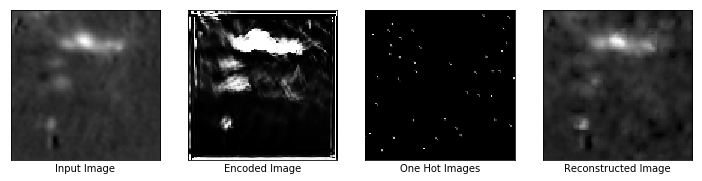

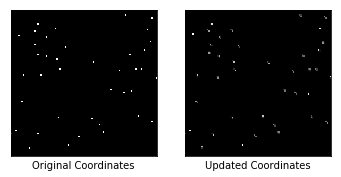

Epochs: 1160, Loss: 0.0015607505338266492
Similarity scores: [2.3804202e-03 6.2636256e-02 8.3517740e-03 4.4569384e-02 1.1147541e-01
 1.4984360e-02 5.4965140e-03 4.0586824e-03 4.2781866e-01 9.6856728e-03
 4.3395496e-04 6.7597747e-02 9.5857397e-02 1.1800220e-01 1.2538891e-01
 3.0340776e-01 1.2794726e-01 2.3652557e-02 2.4744779e-02 1.0998028e-03
 3.6404599e-02 3.4371062e-04 3.3868495e-03 8.9063616e-03 4.3875519e-02
 2.4847542e-03 9.7541593e-04 4.5089379e-02 2.6009986e-01 4.9025443e-01
 2.6296200e-02 4.1310661e-02 9.9993706e-01 3.9377031e-03 5.9759957e-01
 5.1754430e-02 1.8069306e-02 3.7321083e-02 5.4306392e-02 3.3607277e-01]
Updated Coordinates: [[[0.93128645 0.1203751 ]]]
Gradient min:-9.688461432233453e-05, max:0.0011624215403571725



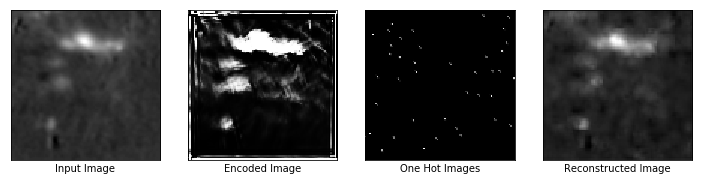

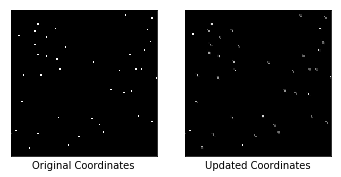

Epochs: 1170, Loss: 0.0012809064937755466
Similarity scores: [3.58327245e-03 5.68518341e-02 1.54943317e-02 6.78901225e-02
 1.19794905e-01 3.34200710e-02 4.52647638e-03 1.01602543e-02
 1.99617699e-01 1.55040361e-02 5.30120917e-04 5.45224845e-02
 1.10606171e-01 1.11526988e-01 1.18899822e-01 3.06420743e-01
 1.70864657e-01 3.77081893e-02 2.37856861e-02 1.09524280e-03
 7.86598474e-02 1.27231574e-03 2.90362816e-03 2.98172235e-02
 5.22580259e-02 7.85395503e-03 1.92849222e-03 4.16455865e-02
 2.55993903e-01 4.97737557e-01 2.66615730e-02 5.35469130e-02
 9.99929786e-01 4.15140530e-03 7.17236519e-01 4.79921028e-02
 9.40007903e-03 5.34205213e-02 3.89184840e-02 3.55806231e-01]
Updated Coordinates: [[[0.9312582 0.1204626]]]
Gradient min:-0.0006189391715452075, max:0.0009553944692015648



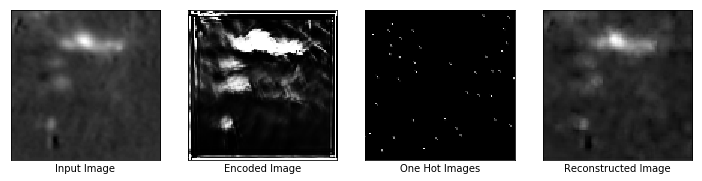

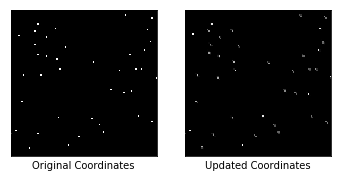

Epochs: 1180, Loss: 0.001411215984262526
Similarity scores: [4.6951207e-03 7.4047521e-02 2.3561029e-02 8.3928645e-02 1.3855955e-01
 4.0791698e-02 4.9939733e-03 1.3498096e-02 1.4438808e-01 2.2671733e-02
 5.2561343e-04 7.2575375e-02 1.3116609e-01 1.4773540e-01 1.7162539e-01
 3.3385247e-01 2.1861155e-01 4.5657020e-02 4.0799890e-02 1.0920933e-03
 1.4628331e-01 2.7083133e-03 1.2410294e-02 3.8256675e-02 6.3432373e-02
 1.2572733e-02 4.7929017e-03 4.9635824e-02 2.7851251e-01 6.3217884e-01
 4.0833838e-02 6.6689976e-02 9.9914461e-01 9.1277258e-03 6.9406146e-01
 5.3289168e-02 2.0253975e-02 7.5541578e-02 5.6234226e-02 3.4760404e-01]
Updated Coordinates: [[[0.9313694 0.1204179]]]
Gradient min:-0.0006026268238201737, max:0.0014657407300546765



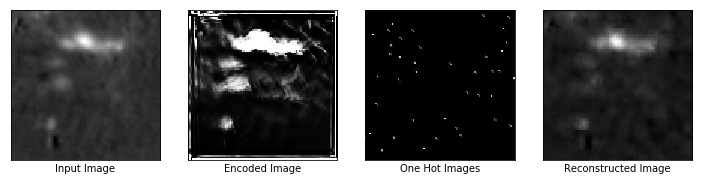

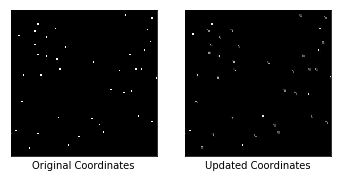

Epochs: 1190, Loss: 0.0012647132389247417
Similarity scores: [3.12028150e-03 7.77065903e-02 2.56344769e-02 9.03510824e-02
 1.13342002e-01 4.45428677e-02 5.44741191e-03 1.51897259e-02
 2.23720282e-01 2.44488008e-02 9.04334884e-04 7.15733394e-02
 1.18909806e-01 1.40243888e-01 1.70783609e-01 2.84597218e-01
 1.78102210e-01 4.78014164e-02 3.97166163e-02 1.08949933e-03
 5.56409769e-02 2.70194025e-03 7.07880501e-03 4.79128957e-02
 6.38239011e-02 1.35324076e-02 4.38947510e-03 4.28643376e-02
 2.60262311e-01 6.77782714e-01 4.82842922e-02 5.81004471e-02
 9.98439670e-01 1.07199829e-02 6.47062480e-01 6.27398938e-02
 2.22185291e-02 7.26320595e-02 5.30679524e-02 3.24646741e-01]
Updated Coordinates: [[[0.9312979  0.12052464]]]
Gradient min:-0.00036126549821347, max:0.0012856833636760712



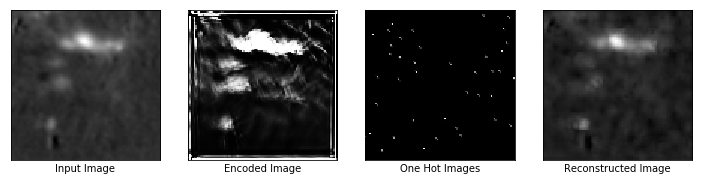

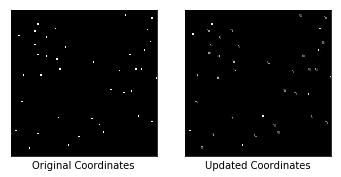

Epochs: 1200, Loss: 0.0016810436500236392
Similarity scores: [2.93500070e-03 7.53899440e-02 3.82050313e-02 1.16264686e-01
 1.14747949e-01 6.14728294e-02 6.40055723e-03 2.46951282e-02
 3.69732589e-01 4.01497521e-02 5.65756520e-04 9.12103727e-02
 1.35738999e-01 1.59124702e-01 1.75597489e-01 3.63398671e-01
 2.15675235e-01 6.80480301e-02 4.46554124e-02 1.09225232e-03
 1.29216507e-01 6.01824699e-03 3.70923094e-02 5.37387840e-02
 7.95524791e-02 2.17967909e-02 9.67038050e-03 6.30102530e-02
 2.86729425e-01 7.08948612e-01 5.30980863e-02 7.42603466e-02
 9.91568387e-01 1.57323442e-02 6.00400269e-01 8.05506185e-02
 2.11942084e-02 9.49501321e-02 6.53580576e-02 4.10738230e-01]
Updated Coordinates: [[[0.9312156  0.12068126]]]
Gradient min:-0.001860472490079701, max:0.0024368532467633486



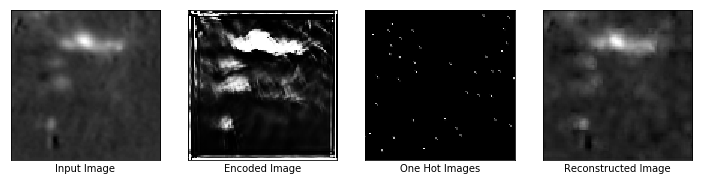

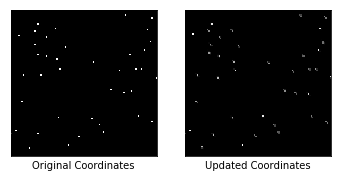

Epochs: 1210, Loss: 0.0019899022299796343
Similarity scores: [3.18365684e-03 8.35744143e-02 3.53352614e-02 1.09674796e-01
 1.12411626e-01 5.66197112e-02 6.40977966e-03 1.86341610e-02
 1.78738147e-01 3.48994136e-02 4.16114082e-04 9.57678482e-02
 1.32186607e-01 1.35711640e-01 1.54508099e-01 3.40699315e-01
 1.80736661e-01 6.44573867e-02 3.45614217e-02 1.09167304e-03
 7.77542442e-02 6.13511400e-03 2.14226451e-02 4.15220112e-02
 7.71026462e-02 2.23285016e-02 7.49111921e-03 8.65433291e-02
 3.01470250e-01 6.85108781e-01 4.03517708e-02 6.59332797e-02
 9.99093175e-01 1.00030676e-02 6.42330825e-01 4.47175466e-02
 2.31254809e-02 5.44679053e-02 4.44722138e-02 3.70327353e-01]
Updated Coordinates: [[[0.93139327 0.12056963]]]
Gradient min:-0.003090720623731613, max:0.0032793839927762747



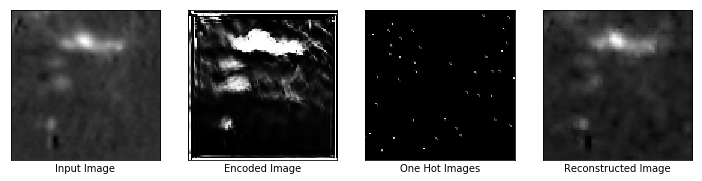

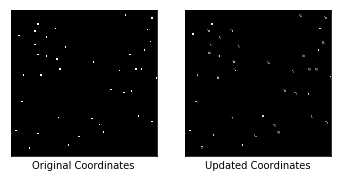

Epochs: 1220, Loss: 0.001427621697075665
Similarity scores: [2.9288707e-03 6.5462418e-02 1.0579175e-02 5.1734369e-02 1.1653591e-01
 2.3602938e-02 4.5510237e-03 7.6936581e-03 2.2413912e-01 1.3562386e-02
 5.6995533e-04 6.8721794e-02 1.0624001e-01 1.2676015e-01 1.7233078e-01
 3.0667511e-01 1.3028800e-01 2.9924231e-02 1.9723665e-02 1.0915245e-03
 1.4297421e-01 7.5817725e-04 4.1112881e-03 1.3307327e-02 5.0546858e-02
 4.6699932e-03 1.7023815e-03 6.3289128e-02 2.7252111e-01 6.7405146e-01
 3.0822534e-02 6.1931688e-02 9.9993885e-01 7.3274723e-03 6.0275406e-01
 9.1523752e-03 1.1483327e-02 5.8895174e-02 6.2207855e-02 3.6681566e-01]
Updated Coordinates: [[[0.931473   0.12060666]]]
Gradient min:-0.000981218065135181, max:0.0013915461022406816



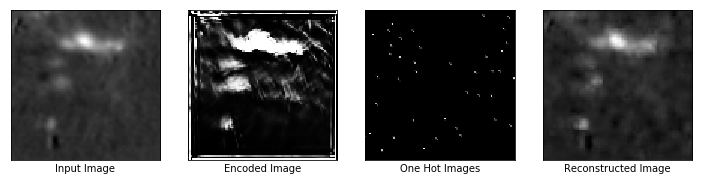

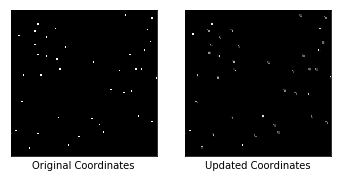

Epochs: 1230, Loss: 0.0012314574560150504
Similarity scores: [3.46182380e-03 8.43720734e-02 1.49050429e-02 5.83614185e-02
 1.42633885e-01 3.46255787e-02 5.09544229e-03 8.63596704e-03
 3.92837584e-01 1.55772483e-02 6.16303645e-04 6.86638579e-02
 1.39823064e-01 1.14737734e-01 1.96437985e-01 3.22654039e-01
 1.36488169e-01 3.78079563e-02 1.75807774e-02 1.09118852e-03
 2.00704217e-01 1.30811951e-03 1.26436064e-02 2.50573270e-02
 6.30622506e-02 6.91813836e-03 2.18347530e-03 7.56704211e-02
 2.88997740e-01 6.53711081e-01 2.24899389e-02 7.26183280e-02
 9.99812722e-01 6.93906657e-03 6.67253017e-01 2.48537324e-02
 1.62605774e-02 7.83390105e-02 7.06426799e-02 4.02978778e-01]
Updated Coordinates: [[[0.93164843 0.12080015]]]
Gradient min:-0.00072908541187644, max:0.0007730292854830623



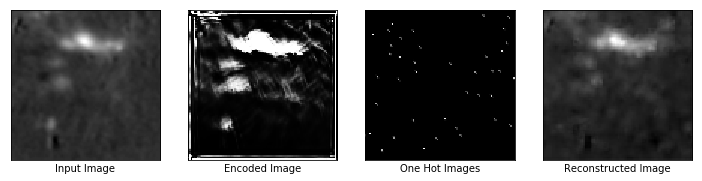

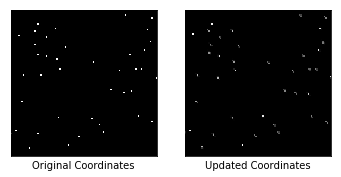

Epochs: 1240, Loss: 0.0017269729869440198
Similarity scores: [3.02725122e-03 3.64000611e-02 1.15645099e-02 5.96418194e-02
 1.29879877e-01 2.60570347e-02 6.52449345e-03 1.40319299e-02
 2.70254999e-01 1.33357383e-02 5.23075927e-04 7.01216012e-02
 1.02442615e-01 9.42614228e-02 1.95431918e-01 3.76109302e-01
 1.40653059e-01 2.58874800e-02 1.66519973e-02 1.08979782e-03
 1.40083551e-01 8.09585501e-04 9.65312589e-03 3.85881327e-02
 4.74879555e-02 5.62250242e-03 2.70837569e-03 7.97579736e-02
 2.08515108e-01 4.16993558e-01 2.18800064e-02 4.55457121e-02
 9.99969363e-01 6.75834063e-03 5.42153180e-01 4.24954072e-02
 1.96276158e-02 5.72102293e-02 6.72560483e-02 3.82878542e-01]
Updated Coordinates: [[[0.9317887  0.12061408]]]
Gradient min:-0.0006054528639651835, max:0.0016457736492156982



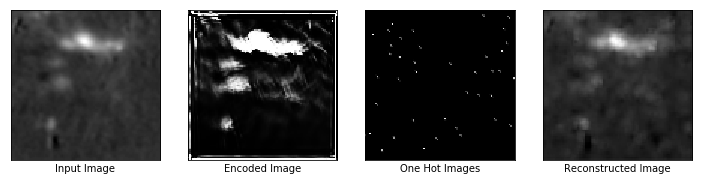

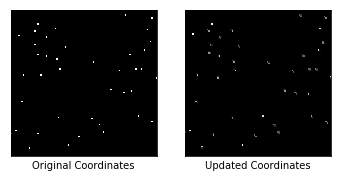

Epochs: 1250, Loss: 0.0013392111286520958
Similarity scores: [4.4224001e-03 4.8946690e-02 1.4953967e-02 6.3536152e-02 1.0285206e-01
 2.7980171e-02 5.6549688e-03 8.2541760e-03 1.9831094e-01 1.6790370e-02
 5.7018810e-04 5.6442939e-02 9.5049247e-02 8.3064377e-02 1.3419105e-01
 3.5494331e-01 1.0237697e-01 3.3982247e-02 1.5834508e-02 1.0882250e-03
 8.7208651e-02 1.2127465e-03 3.2637985e-03 2.2101611e-02 4.3451134e-02
 6.7351703e-03 2.8282818e-03 5.8980875e-02 2.4469423e-01 4.4043663e-01
 2.9547391e-02 4.7599699e-02 9.9994838e-01 4.9750097e-03 5.7014102e-01
 5.7665609e-02 1.6086655e-02 4.2585112e-02 4.9047984e-02 4.0060714e-01]
Updated Coordinates: [[[0.9318263 0.1209281]]]
Gradient min:-0.000759915797971189, max:0.0010399860329926014



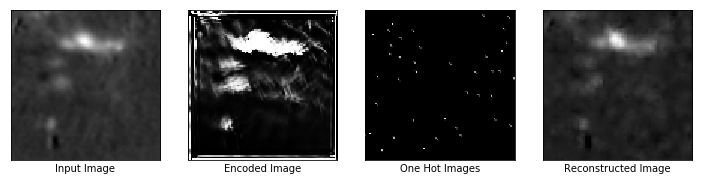

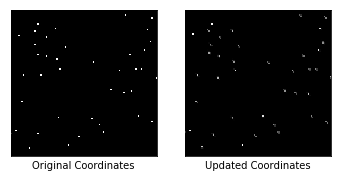

Epochs: 1260, Loss: 0.001261210534721613
Similarity scores: [4.32063267e-03 5.67712858e-02 2.04355028e-02 7.67035186e-02
 1.51066601e-01 3.90220061e-02 4.36914759e-03 1.49179073e-02
 3.09753597e-01 2.20386200e-02 6.09931012e-04 1.11570314e-01
 1.17837906e-01 1.29115924e-01 1.77855983e-01 3.98256093e-01
 1.61525026e-01 4.45254818e-02 2.12453268e-02 2.31681787e-03
 1.46786109e-01 1.53302087e-03 1.64839309e-02 2.01152749e-02
 5.35004064e-02 1.02232965e-02 3.99076985e-03 8.54093730e-02
 2.28104398e-01 5.42794943e-01 3.22127454e-02 8.03775713e-02
 9.99575734e-01 8.36060196e-03 5.93731880e-01 6.23172745e-02
 1.98738575e-02 5.94193041e-02 8.25138763e-02 4.57892120e-01]
Updated Coordinates: [[[0.9317611  0.12103394]]]
Gradient min:-0.000420639495132491, max:0.001022764598019421



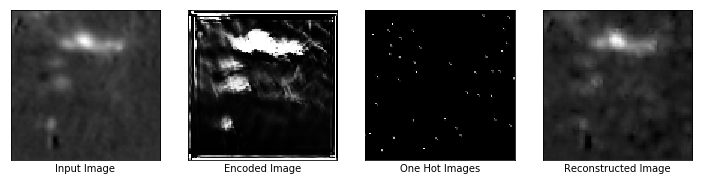

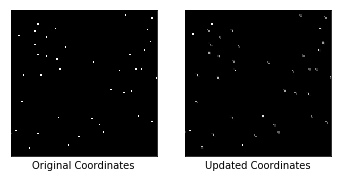

Epochs: 1270, Loss: 0.0015476812841370702
Similarity scores: [3.83512187e-03 5.26268519e-02 1.68837626e-02 7.12513402e-02
 1.30228832e-01 2.86539029e-02 5.51214488e-03 1.36270495e-02
 2.83444822e-01 1.69575159e-02 6.43991400e-04 1.13426194e-01
 9.74367857e-02 1.42993629e-01 1.84791327e-01 3.82288963e-01
 2.00883478e-01 2.85791792e-02 3.53050902e-02 2.35079089e-03
 8.36700797e-02 1.55509729e-03 8.18612240e-03 2.50391383e-02
 5.26658259e-02 6.87718857e-03 4.24178597e-03 7.48695955e-02
 2.34415963e-01 4.28696722e-01 3.77775393e-02 6.35506734e-02
 9.99908924e-01 1.40592009e-02 5.76097667e-01 1.79035962e-01
 2.15841141e-02 6.91948608e-02 8.35333541e-02 4.52797621e-01]
Updated Coordinates: [[[0.9318479  0.12072096]]]
Gradient min:-0.00020713826233986765, max:0.0015734027838334441



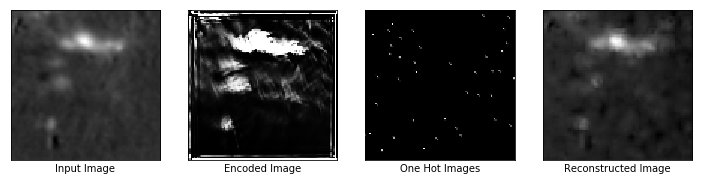

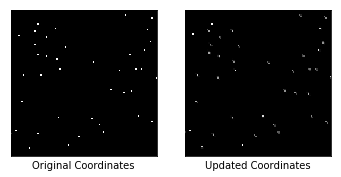

Epochs: 1280, Loss: 0.0018540010787546635
Similarity scores: [5.04000066e-03 8.87592658e-02 1.10970400e-02 6.44444823e-02
 1.35712534e-01 2.56377030e-02 3.59260477e-03 1.29336696e-02
 5.55112004e-01 1.51524218e-02 7.60606548e-04 8.64601433e-02
 1.06721304e-01 1.44476414e-01 1.82582945e-01 3.73225063e-01
 1.39116287e-01 3.37313563e-02 2.60901991e-02 1.54840131e-03
 1.33569807e-01 1.04091573e-03 4.55343816e-03 3.11752334e-02
 5.07757217e-02 7.26426998e-03 2.53064511e-03 6.95875734e-02
 2.59740531e-01 4.02965277e-01 1.92975458e-02 6.99413866e-02
 9.99884009e-01 1.02751665e-02 5.70075274e-01 2.20024381e-02
 6.14961656e-03 8.25893581e-02 8.03274214e-02 3.03477287e-01]
Updated Coordinates: [[[0.931961   0.12049511]]]
Gradient min:-0.0001203441497636959, max:0.001454919925890863



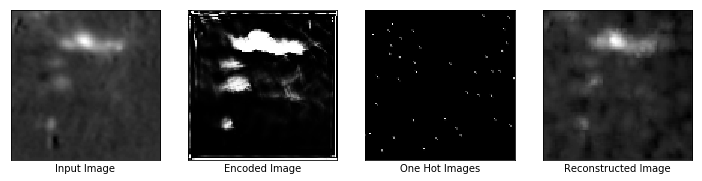

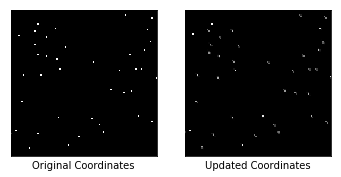

Epochs: 1290, Loss: 0.00269285193644464
Similarity scores: [1.15671195e-03 3.49394009e-02 3.40293720e-03 2.40797792e-02
 4.31671292e-02 1.11402385e-02 2.67610513e-03 1.95734273e-03
 4.58139926e-01 3.69506679e-03 2.75229540e-04 1.48217287e-02
 7.80886561e-02 3.55420858e-02 4.06111777e-02 9.92419496e-02
 4.56212871e-02 8.41424987e-03 7.32899690e-03 1.08680350e-03
 2.11271644e-02 1.19823846e-04 2.14312851e-04 4.99539776e-03
 2.49380041e-02 1.03653374e-03 3.67149041e-04 1.50996652e-02
 1.23212300e-01 1.32444724e-01 7.70545425e-03 1.80928595e-02
 9.99980092e-01 5.94028737e-04 6.46438956e-01 7.12399557e-02
 1.04407473e-02 1.31642781e-02 9.91705060e-03 3.36493731e-01]
Updated Coordinates: [[[0.9318635  0.12112515]]]
Gradient min:-0.002093093702569604, max:0.0014950408367440104



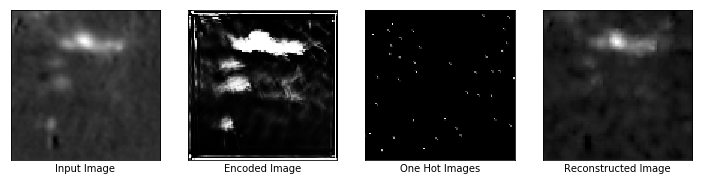

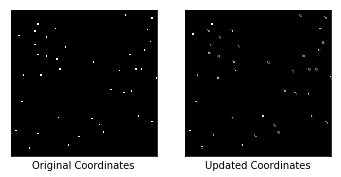

Epochs: 1300, Loss: 0.001681664027273655
Similarity scores: [3.3734755e-03 4.8978858e-02 1.7708758e-02 6.5406844e-02 5.5104308e-02
 4.4235598e-02 4.2253085e-03 8.9290356e-03 8.6793467e-02 1.6870890e-02
 4.0024865e-04 3.3949524e-02 1.3300131e-01 7.5943097e-02 8.8513628e-02
 2.2529209e-01 1.1150676e-01 3.2218602e-02 1.4701279e-02 1.0870523e-03
 5.7277985e-02 1.6551061e-03 2.2196716e-03 2.7046653e-02 5.9705786e-02
 8.2341731e-03 2.3920033e-03 3.2043952e-02 2.2255705e-01 2.9520920e-01
 2.5363274e-02 4.1187141e-02 9.9990380e-01 2.7875530e-03 6.6722029e-01
 1.2573400e-01 2.5720796e-02 3.6018375e-02 1.9494858e-02 4.3211040e-01]
Updated Coordinates: [[[0.9322573  0.12103947]]]
Gradient min:-0.0015096954302862287, max:0.00037749981856904924



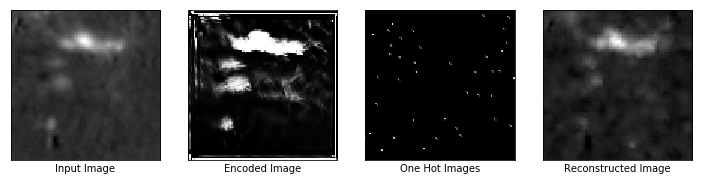

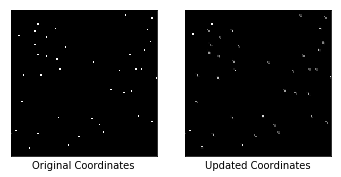

Epochs: 1310, Loss: 0.0014573651133105159
Similarity scores: [4.34473157e-03 6.65850937e-02 1.38358772e-02 6.39881790e-02
 8.08674321e-02 3.31436917e-02 5.10594295e-03 7.93647207e-03
 3.59799825e-02 1.47098117e-02 7.04800826e-04 3.57975550e-02
 1.20017849e-01 9.02518407e-02 1.22478686e-01 2.69697517e-01
 1.26012638e-01 2.94396672e-02 1.27240280e-02 1.08640757e-03
 9.25280005e-02 1.22952065e-03 5.31146443e-03 2.78630015e-02
 4.86698337e-02 6.29381090e-03 1.99671532e-03 3.80331539e-02
 2.13621244e-01 3.43812376e-01 2.12578010e-02 4.90818359e-02
 9.99959946e-01 3.54122766e-03 7.32751369e-01 6.34671971e-02
 2.09714938e-02 4.38979007e-02 2.57321708e-02 3.99526417e-01]
Updated Coordinates: [[[0.932207 0.120827]]]
Gradient min:-0.0010433923453092575, max:0.0004779398732353002



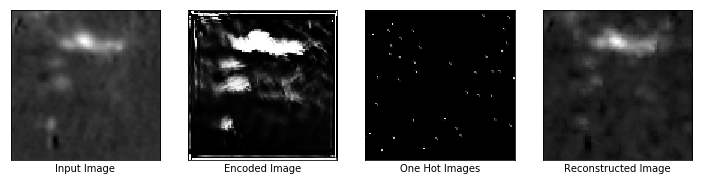

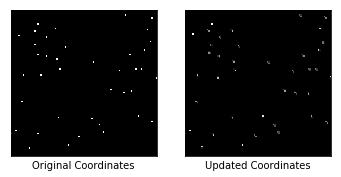

Epochs: 1320, Loss: 0.0013732860097661614
Similarity scores: [6.9424347e-03 5.9088670e-02 1.3145545e-02 6.3296847e-02 8.7478302e-02
 3.1550203e-02 4.4194465e-03 7.8331474e-03 5.6428310e-02 1.3314510e-02
 1.0525609e-03 5.9491813e-02 1.0112642e-01 9.7184718e-02 1.0848224e-01
 3.1761664e-01 1.2168719e-01 3.1080095e-02 1.5831724e-02 1.0879821e-03
 8.3095334e-02 9.9851156e-04 4.6764342e-03 2.3924118e-02 4.7037885e-02
 3.5808966e-03 1.6871106e-03 4.7339369e-02 2.1590427e-01 3.3729875e-01
 2.2350449e-02 4.6736006e-02 9.9996173e-01 3.8791427e-03 6.9414210e-01
 5.2761886e-02 1.8658236e-02 4.1085619e-02 2.4640765e-02 4.0440896e-01]
Updated Coordinates: [[[0.9321897  0.12097773]]]
Gradient min:-0.0009798862738534808, max:0.00025956163881346583



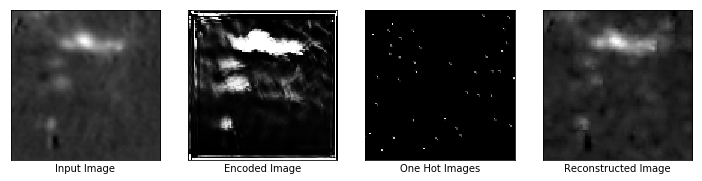

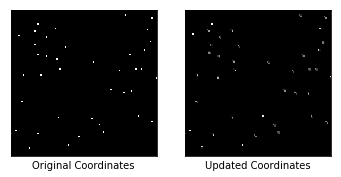

Epochs: 1330, Loss: 0.0013266212772578
Similarity scores: [7.9060346e-03 5.6217145e-02 1.5945487e-02 6.4623073e-02 1.2189103e-01
 2.8511921e-02 3.6168871e-03 1.0978060e-02 6.4405687e-02 1.4790415e-02
 5.3776684e-04 7.2725400e-02 1.0039844e-01 1.4732604e-01 1.4029764e-01
 3.9557585e-01 1.8691902e-01 3.0938948e-02 2.4561545e-02 1.0899400e-03
 1.2205737e-01 1.1184890e-03 9.3922373e-03 3.1080987e-02 4.4449016e-02
 4.2258911e-03 2.7849744e-03 6.5962441e-02 2.2355519e-01 3.1721026e-01
 3.9282482e-02 6.1283674e-02 9.9970126e-01 7.6768300e-03 6.5523505e-01
 1.3572894e-01 2.5490684e-02 5.4862093e-02 5.0596386e-02 4.2089501e-01]
Updated Coordinates: [[[0.9320226  0.12091062]]]
Gradient min:-0.0010242083808407187, max:0.0003899162111338228



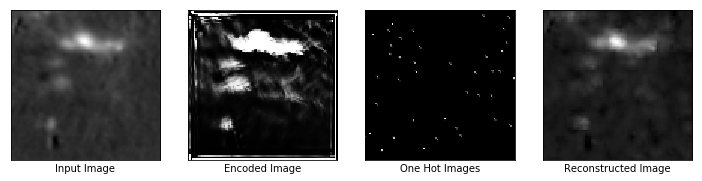

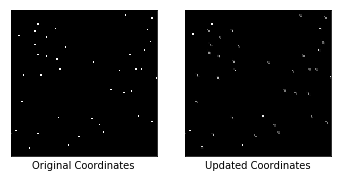

Epochs: 1340, Loss: 0.0011300595942884684
Similarity scores: [6.04714546e-03 6.57295510e-02 1.76735502e-02 7.28566200e-02
 1.55669451e-01 3.83175835e-02 4.56918450e-03 1.27955787e-02
 1.35517910e-01 1.95267946e-02 7.88643491e-04 9.12643746e-02
 1.09068416e-01 1.25520214e-01 1.35091409e-01 3.63079727e-01
 1.31732509e-01 3.80643792e-02 2.09215265e-02 1.08791073e-03
 9.58844945e-02 1.03767333e-03 6.40933728e-03 3.06008141e-02
 5.81987575e-02 4.39736620e-03 2.74167093e-03 6.31380901e-02
 2.80542284e-01 3.48191112e-01 4.35937271e-02 6.72269613e-02
 9.99019384e-01 7.63228396e-03 6.81722522e-01 7.06560537e-02
 1.89589616e-02 5.71746416e-02 6.84700459e-02 4.21775132e-01]
Updated Coordinates: [[[0.9318716  0.12073945]]]
Gradient min:-0.0006025737966410816, max:0.00021276145707815886



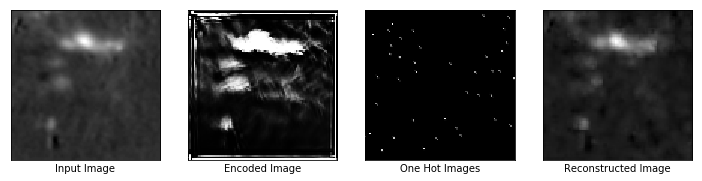

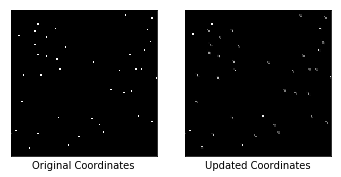

Epochs: 1350, Loss: 0.0010211883345618844
Similarity scores: [1.5664399e-02 9.6690029e-02 2.5596300e-02 8.0417380e-02 1.5938804e-01
 4.8491739e-02 4.8399661e-03 1.5857980e-02 3.0027121e-01 2.6247015e-02
 6.0844969e-04 8.2476236e-02 1.4702445e-01 1.4701061e-01 1.5827571e-01
 3.8260937e-01 1.7507593e-01 5.2066430e-02 3.3834681e-02 1.0877085e-03
 1.3480248e-01 2.2023155e-03 7.0402878e-03 4.8638992e-02 7.0588730e-02
 7.4568992e-03 5.1690657e-03 7.5794324e-02 3.1738189e-01 3.9689419e-01
 4.5105275e-02 9.4275616e-02 9.9937570e-01 9.3897926e-03 6.8829006e-01
 1.1010021e-01 2.0573204e-02 6.7024752e-02 6.8964496e-02 3.6628953e-01]
Updated Coordinates: [[[0.93189025 0.12064293]]]
Gradient min:-0.0002843672700691968, max:0.0002317309845238924



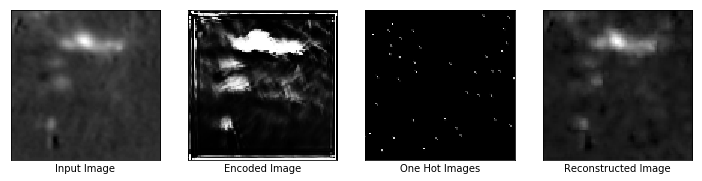

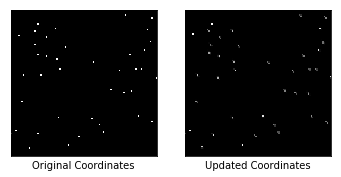

Epochs: 1360, Loss: 0.0012542713666334748
Similarity scores: [7.41528859e-03 6.72834665e-02 2.53455415e-02 8.82069916e-02
 1.45087034e-01 5.00983112e-02 4.31317091e-03 1.56785324e-02
 2.09067270e-01 2.65976638e-02 4.94531821e-04 9.55004394e-02
 1.53219312e-01 1.32372722e-01 1.44150645e-01 3.21671993e-01
 1.52353197e-01 5.27872704e-02 2.65724156e-02 1.08631863e-03
 1.29427969e-01 1.80313876e-03 1.31873125e-02 6.26732484e-02
 7.09908456e-02 4.81566833e-03 4.29227715e-03 6.76256642e-02
 2.80119747e-01 2.94544250e-01 4.44513485e-02 8.83022621e-02
 9.99820888e-01 8.52964539e-03 6.93782270e-01 1.07217588e-01
 4.03348729e-02 5.75569384e-02 6.12819307e-02 4.17515248e-01]
Updated Coordinates: [[[0.9315746  0.12050491]]]
Gradient min:-0.0011012176983058453, max:0.0004673183721024543



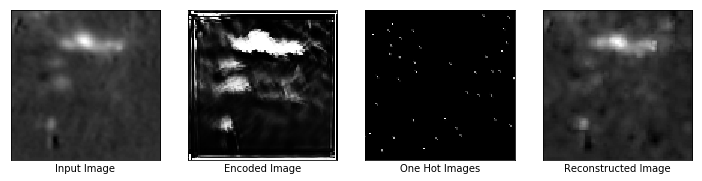

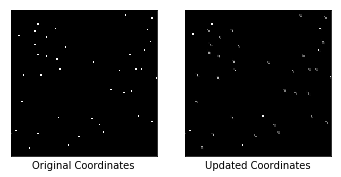

Epochs: 1370, Loss: 0.0012523018522188067
Similarity scores: [7.4014259e-03 6.1814222e-02 4.0080786e-02 1.1555185e-01 1.3466801e-01
 5.5898674e-02 4.6064630e-03 2.4751449e-02 1.0240304e-01 3.5858028e-02
 5.4838654e-04 9.7507164e-02 1.3727984e-01 1.2050042e-01 1.3609561e-01
 3.1049594e-01 1.8409550e-01 5.6851611e-02 3.2493394e-02 1.0912269e-03
 6.8694092e-02 3.4970124e-03 1.5627921e-02 6.7559816e-02 6.2724009e-02
 1.8763503e-02 8.7182298e-03 5.8102638e-02 2.6563904e-01 2.2804427e-01
 4.5551304e-02 7.5749308e-02 9.9990487e-01 1.2069006e-02 5.9519833e-01
 1.2993598e-01 3.0509772e-02 5.8454055e-02 5.4462388e-02 3.5637900e-01]
Updated Coordinates: [[[0.9313897  0.12093109]]]
Gradient min:-0.000693851092364639, max:0.0007686787866987288



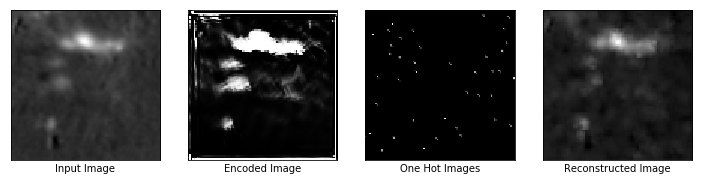

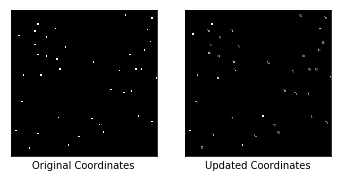

Epochs: 1380, Loss: 0.0013515775790438056
Similarity scores: [3.7548912e-03 4.0345632e-02 9.3333051e-03 4.6609044e-02 7.1461268e-02
 2.1618338e-02 6.5182666e-03 5.5634682e-03 1.0459911e-02 1.0289966e-02
 6.6186715e-04 3.7131764e-02 1.4192870e-01 7.4818186e-02 7.5603053e-02
 2.3551878e-01 1.0426242e-01 2.5961539e-02 1.2141178e-02 1.0923819e-03
 3.6532871e-02 5.4604956e-04 2.0352234e-03 1.5405926e-02 3.8732767e-02
 3.7595402e-03 1.3834004e-03 2.8738827e-02 2.2683747e-01 1.8490137e-01
 3.2468688e-02 3.2188412e-02 9.9991226e-01 3.1913063e-03 6.9329309e-01
 7.7767417e-02 1.5349334e-02 3.1073755e-02 2.1955408e-02 3.5007030e-01]
Updated Coordinates: [[[0.9322092  0.12062547]]]
Gradient min:-0.0005866505671292543, max:0.001082260743714869



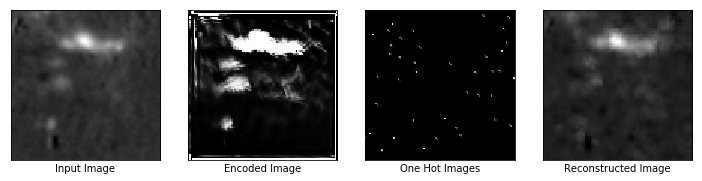

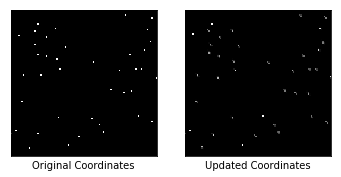

Epochs: 1390, Loss: 0.001080672605894506
Similarity scores: [5.14648017e-03 5.20156249e-02 1.43209882e-02 5.83598837e-02
 1.05235413e-01 3.03964764e-02 5.54570695e-03 8.94906651e-03
 1.16486177e-02 1.55909639e-02 4.88871243e-04 7.48483464e-02
 1.05192885e-01 9.81344283e-02 1.21931091e-01 3.36051941e-01
 1.31088719e-01 3.15499380e-02 1.81860104e-02 1.09141448e-03
 5.85243143e-02 9.93121997e-04 4.13579633e-03 2.02824697e-02
 4.25637066e-02 4.43321746e-03 1.75060704e-03 4.10078503e-02
 2.70818979e-01 3.40070188e-01 4.26628776e-02 5.01000062e-02
 9.99771535e-01 4.08206787e-03 6.75336540e-01 7.00018331e-02
 1.64467208e-02 5.07687367e-02 4.48292792e-02 3.88973206e-01]
Updated Coordinates: [[[0.93184245 0.1208487 ]]]
Gradient min:-0.00022613625333178788, max:0.0003894291876349598



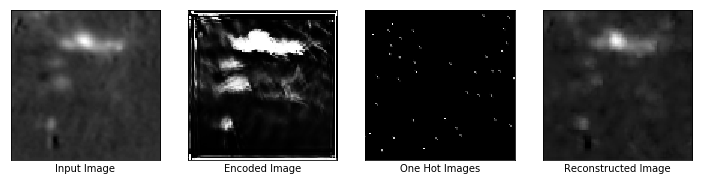

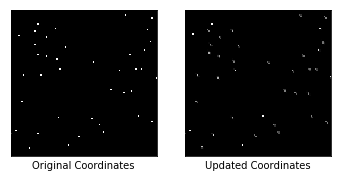

Epochs: 1400, Loss: 0.0011550997151061893
Similarity scores: [3.4721235e-03 5.3722963e-02 1.9248357e-02 7.0281938e-02 1.0565102e-01
 3.9156035e-02 4.6903277e-03 1.1879509e-02 1.9234946e-02 2.0723149e-02
 4.9459125e-04 8.6853340e-02 1.2108091e-01 1.0214705e-01 1.3342357e-01
 2.8203472e-01 1.4426687e-01 3.4999043e-02 1.8284602e-02 1.0910886e-03
 1.2440157e-01 1.1259994e-03 5.6481129e-03 3.4403533e-02 5.0738584e-02
 7.9396879e-03 2.4469674e-03 4.9242489e-02 2.5967270e-01 3.8862354e-01
 3.8341489e-02 4.7653109e-02 9.9918258e-01 5.0321631e-03 6.1732668e-01
 9.3032867e-02 2.2790140e-02 5.2566960e-02 3.9964620e-02 3.7445694e-01]
Updated Coordinates: [[[0.9315915  0.12077924]]]
Gradient min:-0.0009476742707192898, max:0.0010059695923700929



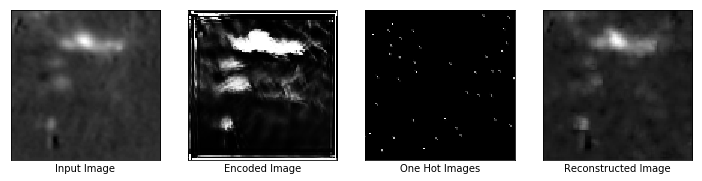

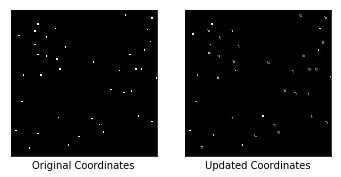

Epochs: 1410, Loss: 0.0010106961708515882
Similarity scores: [4.32903320e-03 6.70214519e-02 2.27478743e-02 7.89625421e-02
 1.04000472e-01 4.59205844e-02 5.23333251e-03 1.33044859e-02
 1.01614505e-01 2.39786878e-02 5.51083125e-04 7.79612213e-02
 1.31766140e-01 1.09191716e-01 1.36757433e-01 3.01461637e-01
 1.45812437e-01 4.67299633e-02 2.35894229e-02 1.09000818e-03
 9.60311368e-02 1.83998619e-03 1.74148623e-02 4.05171216e-02
 5.56648374e-02 6.24565966e-03 3.20185418e-03 4.50092033e-02
 2.41299927e-01 4.28769827e-01 3.63969952e-02 5.81937768e-02
 9.99531865e-01 5.85428346e-03 6.07164025e-01 1.16246320e-01
 2.66347006e-02 5.66830486e-02 5.05905971e-02 3.83180737e-01]
Updated Coordinates: [[[0.93170065 0.12088901]]]
Gradient min:-0.0003167977265547961, max:0.00018414818623568863



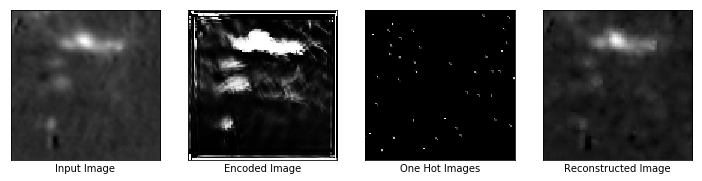

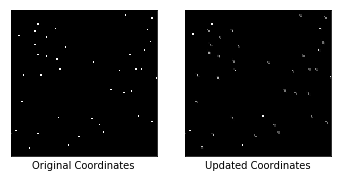

Epochs: 1420, Loss: 0.0011260181199759245
Similarity scores: [5.8913003e-03 5.3411387e-02 2.2397023e-02 8.1200726e-02 1.0811887e-01
 4.9969200e-02 4.8691854e-03 1.4011884e-02 1.8865784e-01 2.3618752e-02
 5.7973037e-04 8.5262135e-02 1.1013947e-01 1.1818793e-01 1.2322503e-01
 3.2278278e-01 1.3053006e-01 4.3088544e-02 2.0743214e-02 1.0891345e-03
 1.3353127e-01 2.2545254e-03 1.5424781e-02 4.1309476e-02 5.2406430e-02
 7.9736747e-03 3.8900177e-03 4.6500348e-02 2.5456536e-01 4.4929269e-01
 3.8579766e-02 5.7940386e-02 9.9880409e-01 7.5590536e-03 6.1577660e-01
 3.6597490e-01 1.6892772e-02 5.3070154e-02 4.5213673e-02 3.8585436e-01]
Updated Coordinates: [[[0.9318016  0.12081652]]]
Gradient min:-0.0005862984107807279, max:0.0005012587644159794



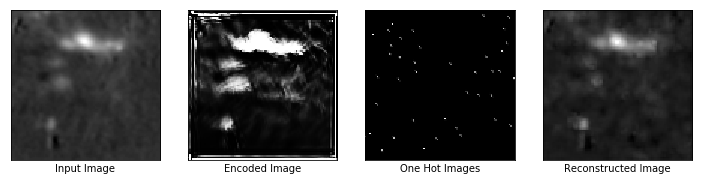

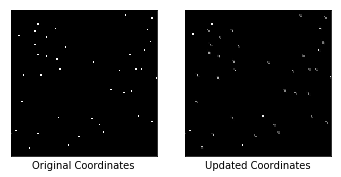

Epochs: 1430, Loss: 0.0009351833141408861
Similarity scores: [5.64914290e-03 7.23621622e-02 3.01642828e-02 9.69479457e-02
 1.34004816e-01 5.71492240e-02 4.85649286e-03 2.07418445e-02
 2.51651287e-01 2.87396349e-02 7.17499177e-04 7.38364384e-02
 1.30908057e-01 1.12689905e-01 1.42132819e-01 3.14722300e-01
 1.51814520e-01 5.84200695e-02 2.48372536e-02 1.08474796e-03
 1.10474363e-01 3.61999311e-03 1.14753321e-02 5.56671172e-02
 6.32421821e-02 1.17242010e-02 6.07636757e-03 4.88114730e-02
 2.84439445e-01 3.72303993e-01 4.47767489e-02 6.34084493e-02
 9.99609470e-01 7.60381948e-03 6.16923511e-01 2.80922562e-01
 1.99281666e-02 6.96444809e-02 5.60850650e-02 3.89358997e-01]
Updated Coordinates: [[[0.93217933 0.12064696]]]
Gradient min:-0.00031475062132813036, max:0.0002829360601026565



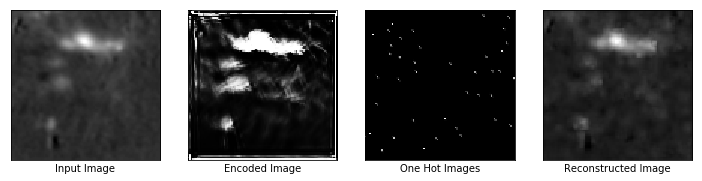

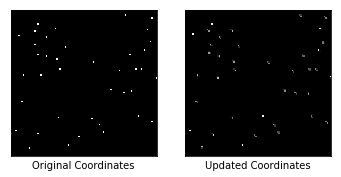

Epochs: 1440, Loss: 0.0010689663467928767
Similarity scores: [0.00311338 0.06068053 0.03119685 0.08653619 0.10003665 0.05657919
 0.00475698 0.02016899 0.03679527 0.02616644 0.00204972 0.07084984
 0.13198577 0.10935863 0.10933656 0.3037346  0.15485965 0.05255569
 0.02814807 0.00108588 0.07420228 0.00373918 0.00481095 0.04364887
 0.06320842 0.01069837 0.0058512  0.0359727  0.2520655  0.32686993
 0.04678814 0.05332619 0.9992987  0.00562387 0.64710855 0.36490124
 0.02893968 0.05369645 0.03194183 0.3670025 ]
Updated Coordinates: [[[0.93202263 0.1205126 ]]]
Gradient min:-0.0009334271308034658, max:0.0010241807904094458



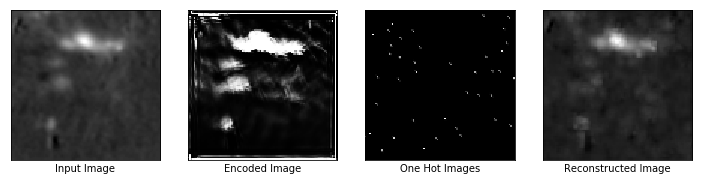

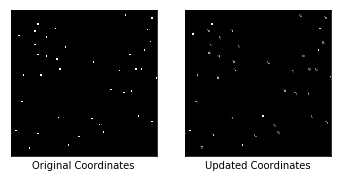

Epochs: 1450, Loss: 0.0013062328798696399
Similarity scores: [4.23164666e-03 5.07250577e-02 2.23135073e-02 8.05330053e-02
 9.74893123e-02 4.25352715e-02 4.48455848e-03 1.61537621e-02
 1.63278967e-01 2.20029186e-02 7.70928513e-04 5.40506169e-02
 1.22704022e-01 9.54052135e-02 1.04251266e-01 2.49066517e-01
 1.56254381e-01 3.98539007e-02 2.39338540e-02 1.08245166e-03
 7.27725327e-02 2.68957065e-03 8.48820899e-03 4.30919304e-02
 4.58510667e-02 1.23433620e-02 4.63677198e-03 2.57080458e-02
 2.01317027e-01 2.76937783e-01 3.59590650e-02 3.81432623e-02
 9.99611497e-01 3.98619426e-03 6.06131375e-01 2.27657795e-01
 1.41489273e-02 5.49202412e-02 2.89122369e-02 3.41358513e-01]
Updated Coordinates: [[[0.9320398 0.1205975]]]
Gradient min:-0.001030529965646565, max:0.0011197589337825775



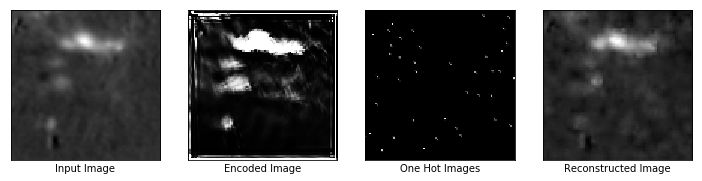

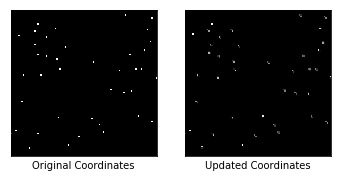

Epochs: 1460, Loss: 0.0012296151835471392
Similarity scores: [5.91304153e-03 6.00600429e-02 1.50901964e-02 7.16960356e-02
 8.81329626e-02 3.45827155e-02 4.12801839e-03 1.21206939e-02
 5.09289920e-01 1.68151725e-02 6.73276430e-04 8.82747546e-02
 9.38941687e-02 1.09661609e-01 1.05302624e-01 3.13139826e-01
 1.24455780e-01 3.06033734e-02 2.76219640e-02 1.07655313e-03
 5.37931807e-02 2.05587386e-03 3.84912780e-03 2.22972855e-02
 4.33277451e-02 6.75246492e-03 3.54306074e-03 3.74109969e-02
 1.83814302e-01 3.16691607e-01 3.27841640e-02 4.00814451e-02
 9.99887884e-01 6.92873448e-03 6.03440046e-01 9.83499661e-02
 2.48429682e-02 4.66486886e-02 4.23706025e-02 3.39711457e-01]
Updated Coordinates: [[[0.93196994 0.12019876]]]
Gradient min:-0.00042138443677686155, max:0.0007722549489699304



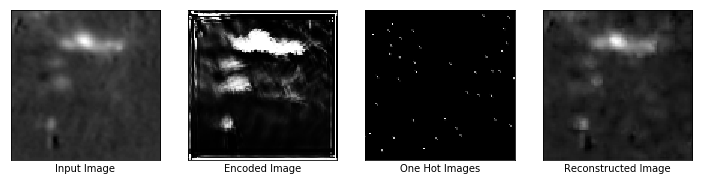

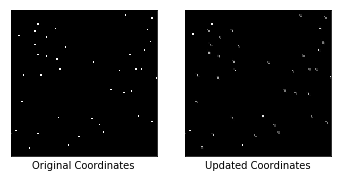

Epochs: 1470, Loss: 0.0011298690224066377
Similarity scores: [6.85536535e-03 5.01886047e-02 1.89147927e-02 7.13045970e-02
 1.08446531e-01 3.79681252e-02 3.83229344e-03 1.83853544e-02
 3.74980718e-01 2.09008325e-02 6.25846325e-04 1.16820775e-01
 8.60697851e-02 1.15840122e-01 1.46824628e-01 3.61875832e-01
 1.81602120e-01 2.87996475e-02 2.80737057e-02 1.07583008e-03
 6.64891526e-02 2.60911137e-03 8.01756885e-03 3.15477848e-02
 4.37139198e-02 7.35919410e-03 5.43570286e-03 3.95899303e-02
 2.22224176e-01 2.81031281e-01 4.84824479e-02 3.83827128e-02
 9.99653518e-01 8.66534747e-03 6.57309234e-01 1.90536261e-01
 6.69753132e-03 7.43311644e-02 5.26148565e-02 3.63582850e-01]
Updated Coordinates: [[[0.9318894  0.12038013]]]
Gradient min:-0.00036985770566388965, max:0.0008372486918233335



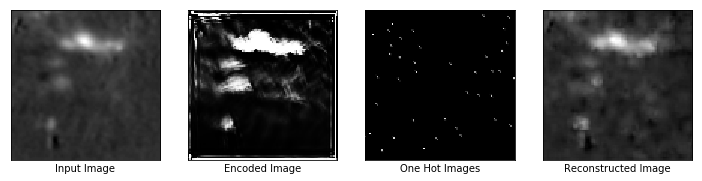

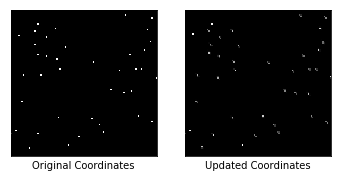

Epochs: 1480, Loss: 0.0011689105303958058
Similarity scores: [6.62779342e-03 4.81586196e-02 1.32216886e-02 6.12767339e-02
 7.16121495e-02 2.98978761e-02 3.72857274e-03 1.30094113e-02
 4.27824616e-01 1.52179897e-02 4.91085113e-04 7.53462091e-02
 9.16857272e-02 1.04001872e-01 1.08475044e-01 2.97895193e-01
 1.43995658e-01 2.71638539e-02 1.90966800e-02 1.07120280e-03
 4.46875170e-02 1.85368897e-03 6.44936785e-03 3.33295502e-02
 4.88862135e-02 5.41430758e-03 3.00952466e-03 2.32205521e-02
 2.13240042e-01 2.36169696e-01 3.76824960e-02 3.01209781e-02
 9.99650955e-01 5.02769463e-03 7.44729102e-01 1.66357189e-01
 4.41470370e-03 6.29675686e-02 2.53986772e-02 3.69516581e-01]
Updated Coordinates: [[[0.9319469  0.12032183]]]
Gradient min:-0.0008555527310818434, max:0.0011775688035413623



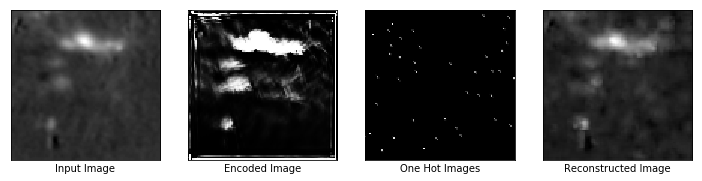

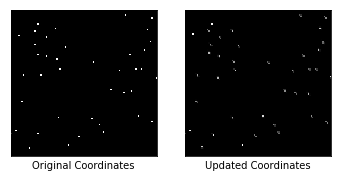

Epochs: 1490, Loss: 0.0011833722237497568
Similarity scores: [4.1456362e-03 5.1417269e-02 1.1253752e-02 5.2053850e-02 1.0526573e-01
 2.4217036e-02 4.0248451e-03 7.4691037e-03 3.9509520e-01 1.3519780e-02
 3.3794742e-04 6.6099539e-02 1.0772748e-01 8.8933155e-02 1.0928228e-01
 2.6511586e-01 1.3255811e-01 2.6743976e-02 1.6049448e-02 1.0709387e-03
 4.7210280e-02 1.3145424e-03 6.0844654e-03 2.2361478e-02 4.0987831e-02
 3.3878265e-03 1.4585099e-03 3.3641703e-02 2.1489938e-01 2.5957724e-01
 2.4952713e-02 3.6659904e-02 9.9994338e-01 3.5520860e-03 6.9565088e-01
 1.3384059e-01 9.1296574e-03 5.4916650e-02 3.2633834e-02 3.8005707e-01]
Updated Coordinates: [[[0.9320735  0.12016622]]]
Gradient min:-0.0007157489890232682, max:0.0001373111008433625



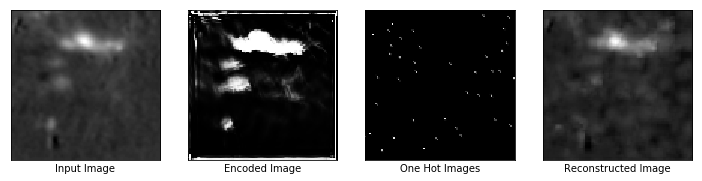

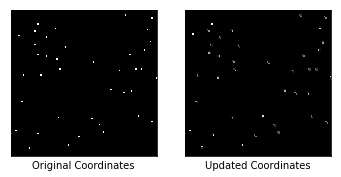

Epochs: 1500, Loss: 0.0021357941441237926
Similarity scores: [5.03780204e-04 1.99727286e-02 5.51084103e-03 3.02742422e-02
 5.20173162e-02 1.23541486e-02 4.54858597e-03 4.40969225e-03
 9.67331324e-03 6.77670538e-03 3.04347253e-03 2.79048290e-02
 7.91648552e-02 4.23116572e-02 5.33971414e-02 1.61018029e-01
 8.63906294e-02 1.34176519e-02 1.00629907e-02 1.06828706e-03
 1.41948955e-02 3.58394958e-04 6.32449694e-04 1.29948808e-02
 2.36462448e-02 1.86193397e-03 9.56724223e-04 1.38663845e-02
 1.18962929e-01 9.70859602e-02 2.35380642e-02 1.42113399e-02
 9.99979973e-01 1.27750356e-03 6.29646540e-01 2.44939461e-01
 1.61207505e-02 2.72414126e-02 1.22196749e-02 3.46888870e-01]
Updated Coordinates: [[[0.9317856  0.12040322]]]
Gradient min:-0.001774389180354774, max:0.0007484894013032317



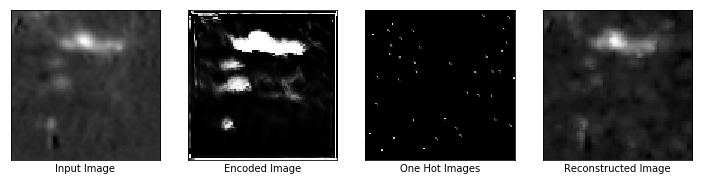

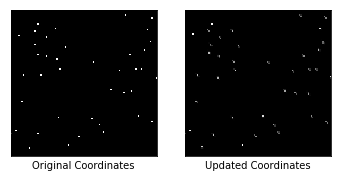

Epochs: 1510, Loss: 0.0032165683805942535
Similarity scores: [1.04053062e-03 2.71737389e-02 5.80693269e-03 3.09943911e-02
 3.87086682e-02 1.32888341e-02 3.38581624e-03 4.31273459e-03
 2.36504767e-02 6.90847449e-03 2.02204639e-04 2.28716973e-02
 8.92804489e-02 3.72708291e-02 3.75575200e-02 1.17247105e-01
 6.76517040e-02 1.13429409e-02 7.54127046e-03 1.06476236e-03
 1.09302830e-02 3.34490760e-04 2.64972751e-03 1.12939533e-02
 2.25664880e-02 2.39447551e-03 7.72337837e-04 1.14598880e-02
 1.24285899e-01 7.87778348e-02 2.24546231e-02 1.38725732e-02
 9.99949455e-01 1.06904365e-03 5.90405166e-01 1.59264103e-01
 8.61069467e-03 2.26534959e-02 1.02401264e-02 3.22144300e-01]
Updated Coordinates: [[[0.93163854 0.12066082]]]
Gradient min:-0.0036436140071600676, max:0.0011629286454990506



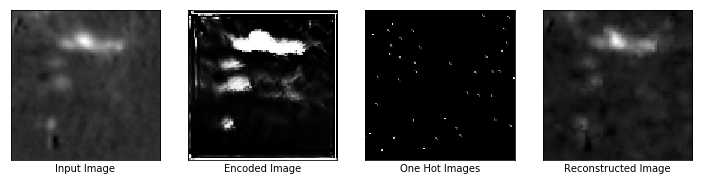

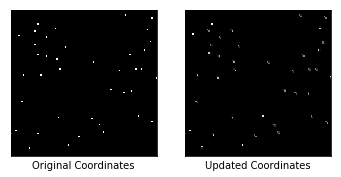

Epochs: 1520, Loss: 0.0012446441687643528
Similarity scores: [0.00466799 0.03477665 0.0098986  0.05038999 0.03791013 0.02254597
 0.00272634 0.00642022 0.01912566 0.01044158 0.00181852 0.03337245
 0.13844806 0.05846128 0.05010833 0.23248802 0.08634935 0.02442317
 0.0135388  0.00105861 0.01993911 0.0010195  0.00160136 0.01979761
 0.04072917 0.00349974 0.00202067 0.01844192 0.16521561 0.16930752
 0.02968298 0.02755021 0.999923   0.00215588 0.6949383  0.23312646
 0.01310105 0.02731756 0.01035529 0.33931002]
Updated Coordinates: [[[0.9320745  0.12030722]]]
Gradient min:-0.0005312691791914403, max:5.888990926905535e-05



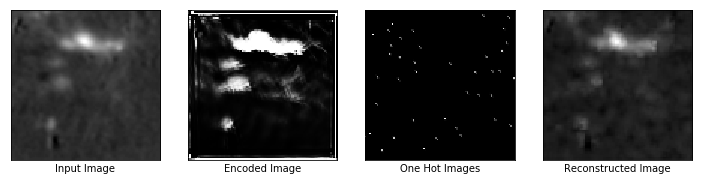

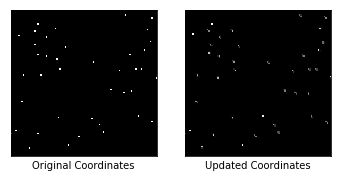

Epochs: 1530, Loss: 0.0011614979011937976
Similarity scores: [0.00309718 0.03586528 0.01417333 0.06407339 0.06263867 0.03070067
 0.00331454 0.00759303 0.03143175 0.01511412 0.00203323 0.04531768
 0.11731897 0.07765114 0.060065   0.25295854 0.121049   0.02959202
 0.01475917 0.00104635 0.03149737 0.00131489 0.00251441 0.02131661
 0.04423897 0.00465244 0.00239456 0.03268174 0.190748   0.22133604
 0.03600463 0.03066675 0.9999406  0.00327883 0.67913973 0.22269836
 0.00973141 0.027403   0.02670849 0.40971166]
Updated Coordinates: [[[0.9318097 0.1204505]]]
Gradient min:-0.0006999777397140861, max:0.00013758651039097458



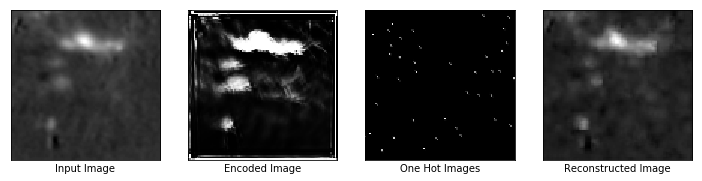

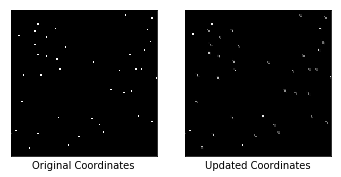

Epochs: 1540, Loss: 0.0010798951843753457
Similarity scores: [2.75022211e-03 4.07096967e-02 2.07444895e-02 7.56978691e-02
 8.61117989e-02 4.27984595e-02 3.53351049e-03 1.62360389e-02
 1.17280416e-01 2.30598133e-02 7.91541766e-04 6.29588962e-02
 1.10568158e-01 9.54335853e-02 8.23933855e-02 2.79378235e-01
 1.50648087e-01 3.42940576e-02 2.28723884e-02 1.03833852e-03
 5.46401218e-02 2.63596559e-03 5.37175499e-03 3.32582630e-02
 4.77921478e-02 7.75307417e-03 4.01501171e-03 3.21085230e-02
 2.00470105e-01 2.18376026e-01 4.74317186e-02 3.56736258e-02
 9.99841809e-01 5.51796239e-03 6.52144194e-01 2.14495182e-01
 1.60656031e-02 4.03120890e-02 3.16698067e-02 4.04652059e-01]
Updated Coordinates: [[[0.93176234 0.12060647]]]
Gradient min:-0.0005736551247537136, max:0.00010530270810704678



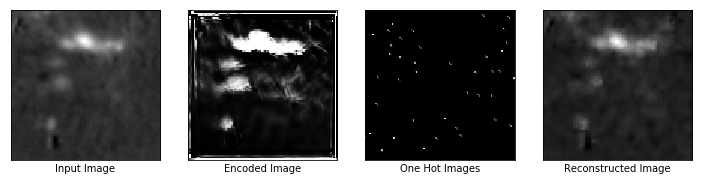

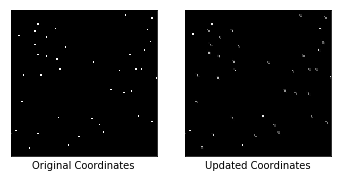

Epochs: 1550, Loss: 0.0009363088756799698
Similarity scores: [4.4758422e-03 4.5811877e-02 2.9512411e-02 1.0037842e-01 1.0994215e-01
 5.5707302e-02 3.9924155e-03 1.9982608e-02 1.6206743e-01 3.2169450e-02
 8.7715150e-04 6.7917697e-02 1.5428795e-01 9.8021537e-02 9.2189580e-02
 2.9062450e-01 1.4328273e-01 5.4490194e-02 2.9714558e-02 1.0353804e-03
 5.4912262e-02 3.9448864e-03 7.1654301e-03 3.8841490e-02 6.4926304e-02
 1.0433952e-02 5.5347802e-03 4.5122433e-02 2.2207281e-01 3.2999790e-01
 4.7482308e-02 5.8015600e-02 9.9984694e-01 6.8867654e-03 6.3311857e-01
 2.1466286e-01 2.9675981e-02 4.7507264e-02 4.2418782e-02 4.3557695e-01]
Updated Coordinates: [[[0.931509   0.12062674]]]
Gradient min:-0.00035476236371323466, max:0.00024249963462352753



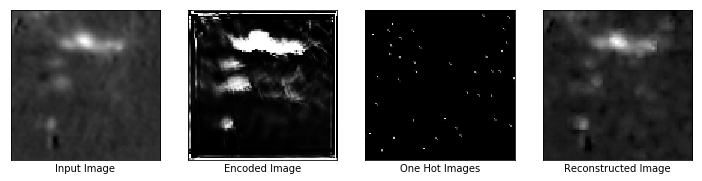

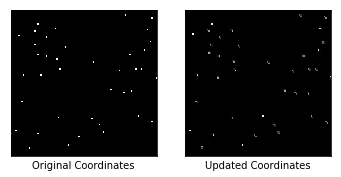

Epochs: 1560, Loss: 0.0010302236769348383
Similarity scores: [2.6595662e-03 4.1814085e-02 1.4341653e-02 6.3570142e-02 9.6623108e-02
 3.3317197e-02 4.3786620e-03 7.2128032e-03 3.2017016e-01 1.8694760e-02
 8.6110720e-04 3.5649635e-02 1.2568706e-01 6.2938541e-02 5.8453184e-02
 2.2218606e-01 7.1479768e-02 3.0324547e-02 1.6277239e-02 1.0545095e-03
 3.4003142e-02 1.2256863e-03 2.6404306e-03 1.8514507e-02 4.4859134e-02
 4.5300061e-03 2.8718950e-03 3.3326570e-02 2.0155488e-01 2.1970120e-01
 2.8982578e-02 3.5631869e-02 9.9990344e-01 2.7967202e-03 6.3852310e-01
 1.9658619e-01 1.5675370e-02 3.0172117e-02 3.2526985e-02 3.7465158e-01]
Updated Coordinates: [[[0.9320383 0.1214828]]]
Gradient min:-0.0003585097147151828, max:8.727859676582739e-05



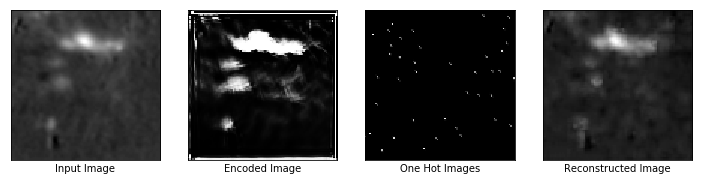

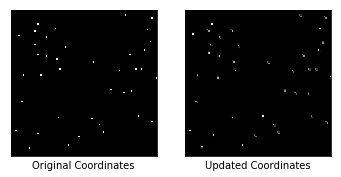

Epochs: 1570, Loss: 0.0011305244406685233
Similarity scores: [1.84104440e-03 3.03586964e-02 1.48833822e-02 6.52301982e-02
 7.69967660e-02 3.49654816e-02 4.09655273e-03 9.71991569e-03
 3.47057283e-01 1.59997139e-02 6.88039814e-04 2.89710462e-02
 1.18787274e-01 6.07470199e-02 5.51503897e-02 2.02624142e-01
 9.73171070e-02 3.25158834e-02 1.48732327e-02 1.02949399e-03
 4.52939831e-02 1.37910270e-03 2.02925899e-03 3.66012603e-02
 4.36194353e-02 6.06834888e-03 2.29805545e-03 3.17235477e-02
 2.00836927e-01 1.83444664e-01 3.01662609e-02 3.72168608e-02
 9.99877214e-01 2.75763869e-03 6.29887223e-01 2.35999972e-01
 2.65198089e-02 2.99513116e-02 2.17811391e-02 3.94579530e-01]
Updated Coordinates: [[[0.931709   0.12051951]]]
Gradient min:-0.0005794921889901161, max:0.0003716290229931474



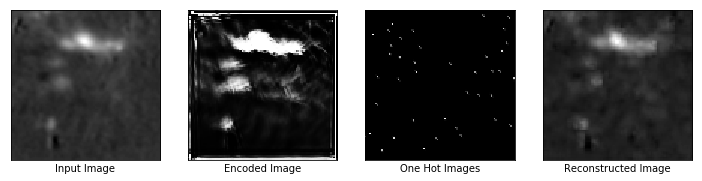

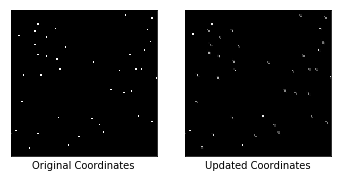

Epochs: 1580, Loss: 0.00109148770570755
Similarity scores: [5.26082469e-03 4.99157347e-02 2.87801512e-02 9.91972238e-02
 1.13352001e-01 6.07071631e-02 3.18547362e-03 1.42639978e-02
 1.39223590e-01 3.27172093e-02 7.16904469e-04 6.87125176e-02
 1.52714908e-01 8.65329206e-02 8.53812099e-02 2.78078645e-01
 1.33310139e-01 4.96811159e-02 2.95249298e-02 1.02294597e-03
 8.57197344e-02 2.99474667e-03 1.18965991e-02 5.08739464e-02
 6.09687492e-02 1.09893875e-02 6.33929158e-03 5.36906496e-02
 2.43226439e-01 3.02797496e-01 4.83714007e-02 5.14677018e-02
 9.99675512e-01 6.08090684e-03 6.09786689e-01 2.03614354e-01
 2.60055065e-02 4.39276993e-02 3.34273539e-02 4.24304068e-01]
Updated Coordinates: [[[0.9321417  0.12125464]]]
Gradient min:-0.0007873755530454218, max:0.00013486303214449435



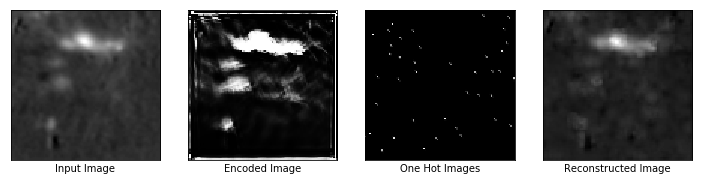

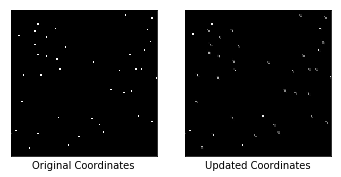

Epochs: 1590, Loss: 0.0011199157452210784
Similarity scores: [0.00384405 0.04291632 0.01902325 0.07360655 0.09705916 0.04077282
 0.00218098 0.01343168 0.24085946 0.02057079 0.00155007 0.05814636
 0.11398736 0.07492434 0.10088316 0.2633162  0.110279   0.03619198
 0.01579808 0.00104295 0.06937192 0.00161306 0.0029537  0.03123924
 0.05166665 0.00906101 0.00376597 0.04939368 0.22263785 0.22769286
 0.03343992 0.04813768 0.99994    0.00410069 0.67089766 0.23326056
 0.01688891 0.04643746 0.0231385  0.39610767]
Updated Coordinates: [[[0.93179953 0.12101762]]]
Gradient min:-0.0006729328888468444, max:0.0006145572988316417



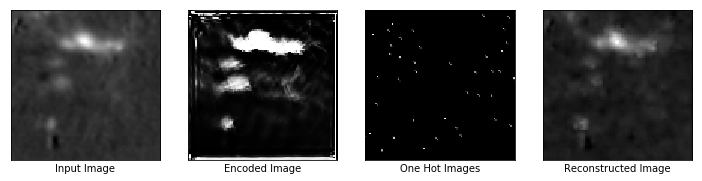

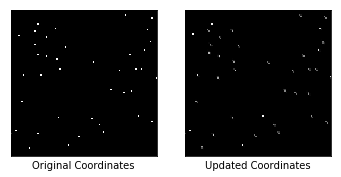

Epochs: 1600, Loss: 0.0010847982484847307
Similarity scores: [0.00221242 0.05119102 0.01867629 0.07432525 0.08107892 0.036509
 0.00184541 0.00945729 0.10447831 0.01972027 0.0043725  0.0450929
 0.14939682 0.09283854 0.06724844 0.18920168 0.09634517 0.036721
 0.02848829 0.0010242  0.02702551 0.00147777 0.00462957 0.0259941
 0.04825879 0.00723003 0.00469087 0.02593421 0.24240012 0.10986561
 0.04288659 0.03028866 0.999539   0.00432962 0.6674253  0.392584
 0.02317877 0.02981303 0.02217168 0.35112393]
Updated Coordinates: [[[0.9319864  0.12140854]]]
Gradient min:-0.0004651643102988601, max:0.0006505510536953807



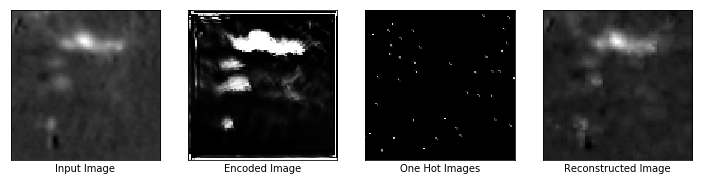

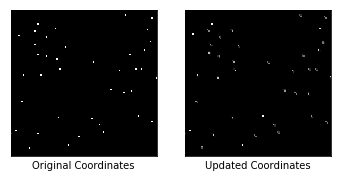

Epochs: 1610, Loss: 0.001240487676113844
Similarity scores: [1.1984794e-03 2.8652869e-02 9.0898545e-03 4.4688277e-02 6.4947076e-02
 2.3601796e-02 3.9535058e-03 5.3156298e-03 3.6287422e-03 1.0369271e-02
 9.8957354e-04 2.4879102e-02 1.2561850e-01 6.0696691e-02 5.0686400e-02
 1.5916365e-01 6.9013014e-02 2.2481512e-02 1.1662908e-02 1.0465296e-03
 2.4692312e-02 5.1596249e-04 2.4496838e-03 2.2151422e-02 3.3048015e-02
 2.6394741e-03 1.3655807e-03 1.6418420e-02 1.7971918e-01 1.0096511e-01
 2.4163673e-02 2.1175403e-02 9.9993145e-01 1.5441132e-03 6.7523503e-01
 2.6424402e-01 1.8423783e-02 2.3703048e-02 1.6461199e-02 3.0931529e-01]
Updated Coordinates: [[[0.931916   0.12082719]]]
Gradient min:-7.171856850618497e-05, max:0.0004877864266745746



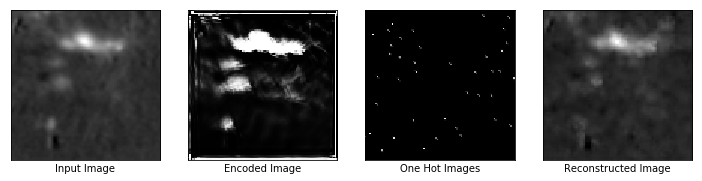

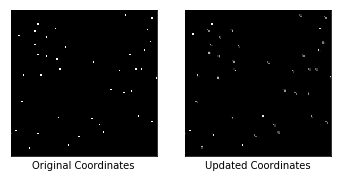

Epochs: 1620, Loss: 0.001059377333149314
Similarity scores: [0.00167886 0.03072289 0.01910007 0.07445729 0.09470592 0.04300623
 0.00324249 0.01164821 0.01961378 0.0213014  0.00251784 0.0435583
 0.13646959 0.07565311 0.07837053 0.23035215 0.10689471 0.03208698
 0.01781908 0.00103379 0.02964287 0.00162095 0.00482896 0.04434211
 0.04199855 0.00685638 0.00337482 0.02434002 0.20737316 0.1882618
 0.03831977 0.03046555 0.9999307  0.00317368 0.6520629  0.25003338
 0.02929736 0.03734389 0.02460743 0.3493717 ]
Updated Coordinates: [[[0.93158835 0.12092219]]]
Gradient min:-0.000418929907027632, max:0.0001524046965641901



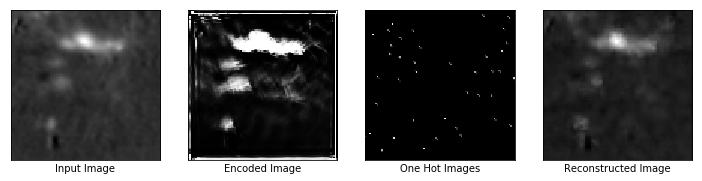

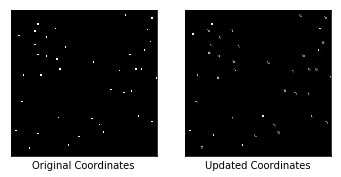

Epochs: 1630, Loss: 0.0010145044652745128
Similarity scores: [0.00490411 0.0436241  0.02226058 0.07714088 0.08324936 0.04747825
 0.00318136 0.01415368 0.07992721 0.02529555 0.00457853 0.04638981
 0.1460815  0.07930853 0.08038818 0.2250877  0.12036874 0.03769878
 0.01998297 0.00102836 0.04734375 0.0019944  0.00491694 0.05112365
 0.04883854 0.00927395 0.00400326 0.02667029 0.21137813 0.18464313
 0.0419116  0.03654452 0.9998205  0.00379339 0.66563845 0.25090215
 0.02114702 0.04104178 0.02495002 0.3584961 ]
Updated Coordinates: [[[0.9315365  0.12106606]]]
Gradient min:-0.000930021342355758, max:0.0003752493648789823



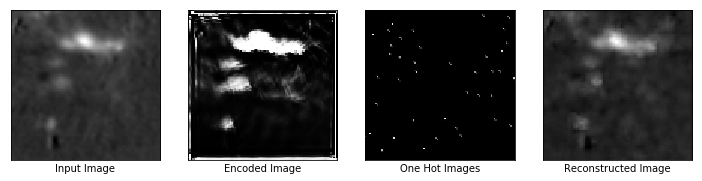

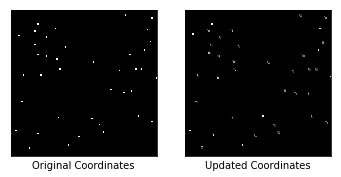

Epochs: 1640, Loss: 0.001191733404994011
Similarity scores: [0.00320006 0.04303559 0.01757444 0.06301947 0.07086622 0.03789403
 0.00247194 0.01344207 0.19777894 0.01880907 0.00519587 0.05220558
 0.13012195 0.09127972 0.07572287 0.21481746 0.10129667 0.03273521
 0.02030448 0.00101412 0.05207648 0.00151663 0.00247926 0.03836924
 0.04777533 0.00608639 0.00317992 0.0286735  0.19754064 0.13485791
 0.02994542 0.03938209 0.9996205  0.00333145 0.69936764 0.23828928
 0.01860477 0.03226614 0.02517703 0.33844933]
Updated Coordinates: [[[0.9315448  0.12102541]]]
Gradient min:-0.0014530433109030128, max:0.00023954096832312644



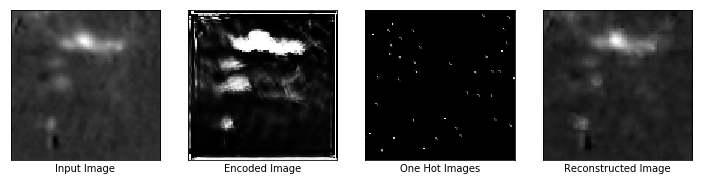

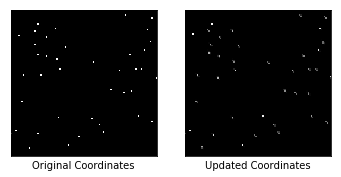

Epochs: 1650, Loss: 0.000908800691831857
Similarity scores: [0.00528525 0.03772299 0.02158985 0.07487876 0.10093639 0.04751641
 0.00316093 0.01373383 0.15310045 0.02133069 0.00109643 0.05490204
 0.13596785 0.08697963 0.08619989 0.23531194 0.12619276 0.03306999
 0.02352106 0.00115518 0.05356963 0.00175933 0.00402823 0.03296543
 0.04356309 0.00881558 0.00326644 0.03047398 0.20598948 0.22722241
 0.03171711 0.0414652  0.9996947  0.0036911  0.6687493  0.26872337
 0.01816826 0.04791819 0.03150333 0.35699406]
Updated Coordinates: [[[0.93164396 0.12099259]]]
Gradient min:-0.00023794316803105175, max:0.00011345013626851141



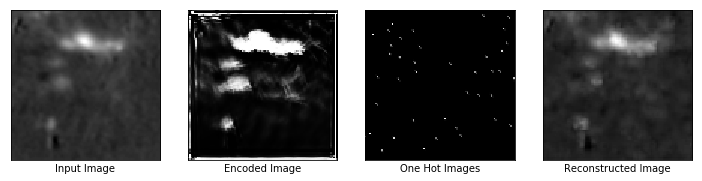

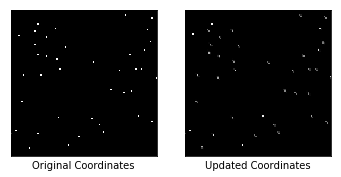

Epochs: 1660, Loss: 0.0009952085092663765
Similarity scores: [0.00336974 0.04160547 0.01883471 0.07132109 0.09716903 0.03918599
 0.00305137 0.0130172  0.12361639 0.01872109 0.00507953 0.07159121
 0.11026936 0.08813076 0.08952144 0.25182927 0.13034934 0.03069312
 0.02313779 0.00130376 0.04831849 0.00157567 0.00387792 0.03758569
 0.04065599 0.00646937 0.00440821 0.02770134 0.20327319 0.18609318
 0.04789476 0.03693607 0.99979067 0.00377548 0.6645486  0.20379366
 0.01410292 0.04098011 0.02512519 0.33490646]
Updated Coordinates: [[[0.93186235 0.12112674]]]
Gradient min:-0.0005542595754377544, max:0.0003400535206310451



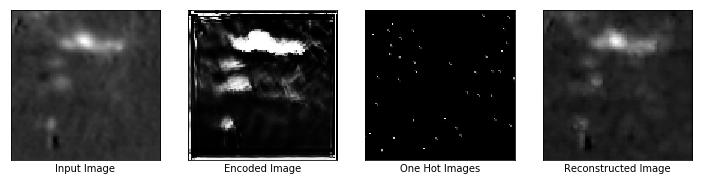

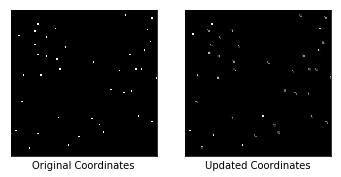

Epochs: 1670, Loss: 0.0010825429344549775
Similarity scores: [3.1443913e-03 4.6656188e-02 1.9325323e-02 7.1663313e-02 8.5370712e-02
 4.2254593e-02 2.5226439e-03 1.3028685e-02 2.3605937e-01 2.0827770e-02
 8.4501732e-04 6.1546981e-02 1.5957373e-01 8.3880842e-02 1.0125019e-01
 2.4487653e-01 9.7688496e-02 3.3788223e-02 2.2386581e-02 2.1093497e-03
 5.3236306e-02 1.6053669e-03 1.4778321e-02 3.9618880e-02 4.4829726e-02
 7.6542604e-03 4.5075053e-03 2.5636069e-02 1.9611494e-01 2.3789838e-01
 4.1180097e-02 3.8832430e-02 9.9980986e-01 4.5702304e-03 6.3186908e-01
 2.2995423e-01 1.3510017e-02 5.0845742e-02 2.8575175e-02 3.4249318e-01]
Updated Coordinates: [[[0.93186    0.12078889]]]
Gradient min:-0.0009383377619087696, max:0.0005118453409522772



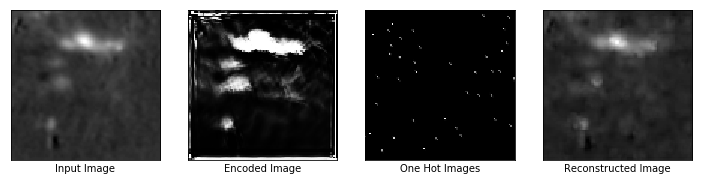

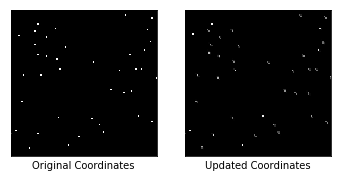

Epochs: 1680, Loss: 0.0009930763626471162
Similarity scores: [3.0790630e-03 4.5199461e-02 1.6349159e-02 6.9516584e-02 9.7320639e-02
 3.5966851e-02 2.3979673e-03 1.6099431e-02 3.7038013e-01 1.7916670e-02
 5.5558671e-04 5.6407630e-02 1.1253630e-01 8.8346250e-02 8.8107675e-02
 2.5091559e-01 1.1513842e-01 2.8065927e-02 2.1519002e-02 2.2264153e-03
 2.9020814e-02 1.5116293e-03 4.6790722e-03 2.4557950e-02 3.5545770e-02
 5.4335655e-03 3.5315626e-03 2.3634370e-02 1.8248044e-01 1.1430857e-01
 3.3136457e-02 3.1802952e-02 9.9977040e-01 4.6832762e-03 6.1061740e-01
 3.0086803e-01 1.5003110e-02 4.8349105e-02 3.1256195e-02 3.1622508e-01]
Updated Coordinates: [[[0.9318572  0.12100101]]]
Gradient min:-2.6901168894255534e-05, max:0.00027364803827367723



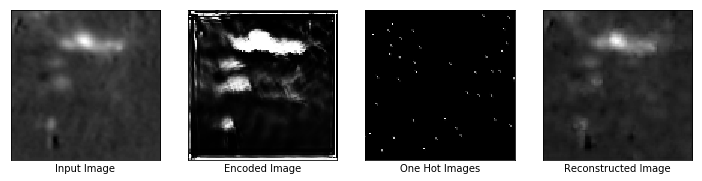

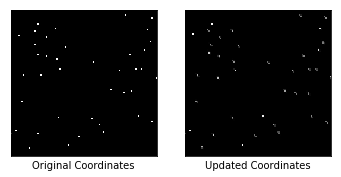

Epochs: 1690, Loss: 0.000944046420045197
Similarity scores: [0.00448512 0.04292186 0.02124509 0.073755   0.08738832 0.04194787
 0.00268266 0.01722564 0.07462738 0.02124723 0.00120309 0.05120236
 0.12517318 0.08343299 0.10671201 0.2571234  0.12393036 0.03221086
 0.01801655 0.00163112 0.02849388 0.00213609 0.00462142 0.04531365
 0.04157259 0.00909086 0.00421948 0.02104416 0.19326597 0.15622142
 0.03652368 0.03917941 0.9995989  0.00512197 0.71296537 0.40558928
 0.02093129 0.04313736 0.0305294  0.29921994]
Updated Coordinates: [[[0.93166554 0.12085181]]]
Gradient min:-0.0001355259882984683, max:0.00039614122943021357



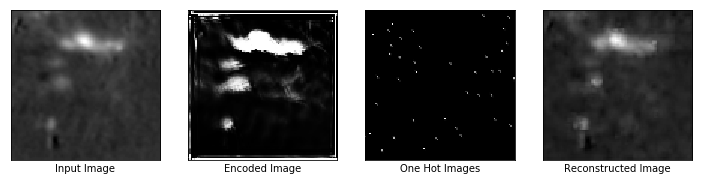

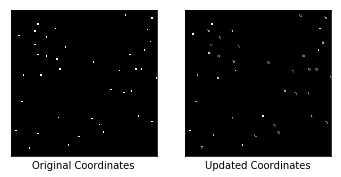

Epochs: 1700, Loss: 0.0011100305709987879
Similarity scores: [8.9934980e-04 2.6177235e-02 1.0882532e-02 4.6700276e-02 6.1080106e-02
 2.6323691e-02 2.7891141e-03 8.5979868e-03 4.0381169e-01 1.0579194e-02
 1.5681217e-03 3.0909091e-02 1.1836158e-01 4.7935765e-02 5.6476478e-02
 1.8613020e-01 8.8399112e-02 2.0507338e-02 1.2273777e-02 1.3439322e-03
 1.8853934e-02 7.6690805e-04 1.8999544e-03 2.8512226e-02 2.9166099e-02
 3.8738193e-03 1.8037700e-03 1.6357547e-02 1.5641657e-01 1.0697685e-01
 2.3731196e-02 2.3823081e-02 9.9996269e-01 2.0345275e-03 6.3221204e-01
 2.2615455e-01 1.9693486e-02 2.1831183e-02 1.7770119e-02 3.0616364e-01]
Updated Coordinates: [[[0.931597   0.12053347]]]
Gradient min:-0.00036840562825091183, max:0.00033830563188530505



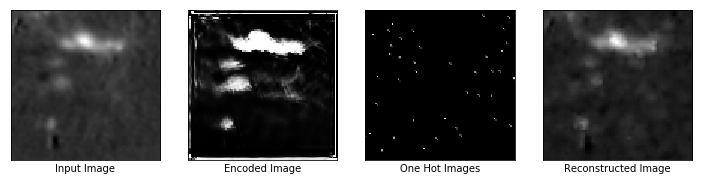

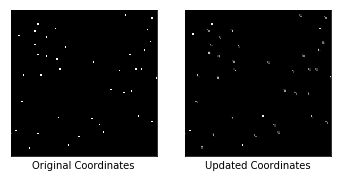

Epochs: 1710, Loss: 0.001559190102852881
Similarity scores: [2.3694099e-03 2.7840782e-02 1.2573524e-02 5.2219838e-02 6.6437304e-02
 2.8373295e-02 2.5413272e-03 1.1707882e-02 8.7590031e-02 1.6269669e-02
 3.2413595e-03 3.7617415e-02 1.2353645e-01 5.9336562e-02 6.1277468e-02
 1.6676496e-01 8.9693502e-02 2.4729105e-02 1.7807731e-02 1.0214413e-03
 3.3548802e-02 7.9931278e-04 6.4319242e-03 2.6220078e-02 3.3301696e-02
 4.7614397e-03 2.4052688e-03 1.9759264e-02 1.8285798e-01 8.3961196e-02
 2.6599372e-02 2.6137879e-02 9.9980152e-01 3.4311328e-03 6.6095650e-01
 1.6478881e-01 2.5004990e-02 3.3332381e-02 2.8214984e-02 3.0220577e-01]
Updated Coordinates: [[[0.9316814  0.12115464]]]
Gradient min:-0.0018798126839101315, max:0.0005015228525735438



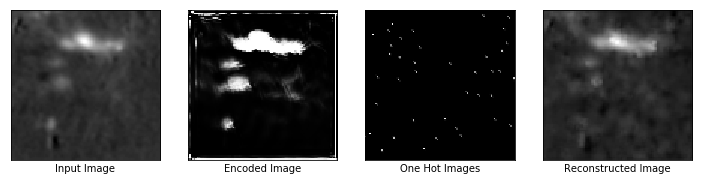

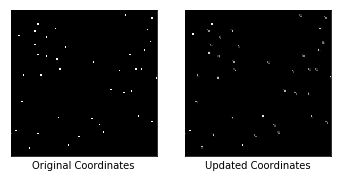

Epochs: 1720, Loss: 0.0025065948721021414
Similarity scores: [6.73404778e-04 1.66162495e-02 6.32563885e-03 3.25153135e-02
 3.41147594e-02 1.80117879e-02 1.37947733e-03 4.00267588e-03
 2.86248833e-01 6.99728448e-03 6.72602095e-03 1.62738189e-02
 9.73180681e-02 3.48250121e-02 2.81152874e-02 1.26429260e-01
 5.71306087e-02 1.41393561e-02 9.76290088e-03 1.01636758e-03
 7.27467006e-03 3.43516556e-04 1.38494920e-03 1.16468081e-02
 1.94270145e-02 2.34241900e-03 1.01799343e-03 8.75984505e-03
 1.17120326e-01 3.86838503e-02 2.49812435e-02 1.03989262e-02
 9.99772251e-01 1.00814551e-03 6.26718223e-01 2.49334082e-01
 8.58812965e-03 1.33689428e-02 1.03309602e-02 2.88852215e-01]
Updated Coordinates: [[[0.93175346 0.12070451]]]
Gradient min:-0.0031209818553179502, max:0.0013624635757878423



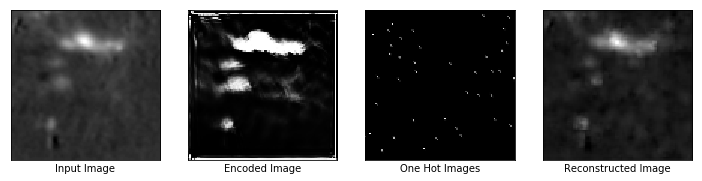

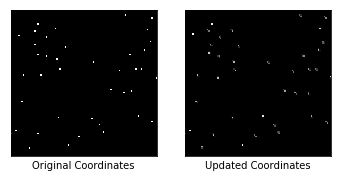

Epochs: 1730, Loss: 0.0012044287286698818
Similarity scores: [2.6162167e-03 2.0934179e-02 1.0270779e-02 4.7056299e-02 4.1257367e-02
 2.4048185e-02 3.2257482e-03 9.2981625e-03 5.4199146e-03 1.2653995e-02
 2.9709139e-03 4.3377720e-02 1.0801177e-01 5.0128628e-02 6.0208030e-02
 2.0068501e-01 9.2047438e-02 2.1378528e-02 1.0979118e-02 1.0143915e-03
 1.7054284e-02 6.8770698e-04 6.1681028e-03 1.7903533e-02 2.4932608e-02
 3.8523828e-03 2.1172718e-03 1.8957337e-02 1.4681949e-01 3.6524788e-02
 3.4912433e-02 2.1428017e-02 9.9985898e-01 2.2961874e-03 6.2773436e-01
 3.0268165e-01 1.7040854e-02 2.7848141e-02 1.2983553e-02 2.9627150e-01]
Updated Coordinates: [[[0.9317748  0.12052125]]]
Gradient min:-0.0008576260879635811, max:0.0003182906366419047



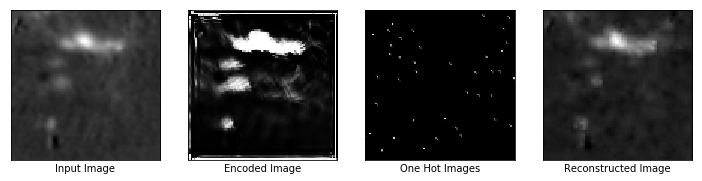

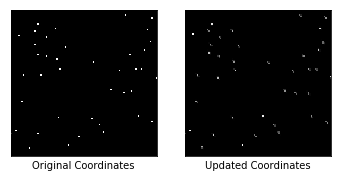

Epochs: 1740, Loss: 0.0009753224439918995
Similarity scores: [0.00442759 0.03563547 0.02017247 0.07798448 0.0707645  0.04320954
 0.00321756 0.01208297 0.00795985 0.02285812 0.00179429 0.04342212
 0.14662075 0.08059958 0.06925859 0.24467    0.11589687 0.04205024
 0.01902831 0.00102431 0.02320056 0.00180759 0.00640615 0.04938322
 0.04361469 0.00884444 0.00443433 0.02735468 0.21112154 0.10478639
 0.03963941 0.03810291 0.9997747  0.00323902 0.6109438  0.34520638
 0.04367682 0.03204933 0.02250958 0.33480722]
Updated Coordinates: [[[0.93174464 0.12030437]]]
Gradient min:-0.0004304227768443525, max:0.00012832380889449269



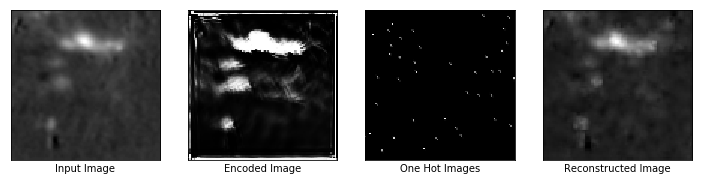

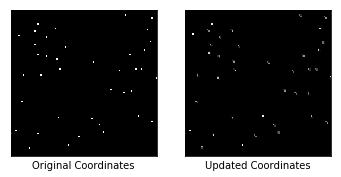

Epochs: 1750, Loss: 0.0009340669494122267
Similarity scores: [0.00247105 0.04114344 0.02484267 0.08594557 0.06747717 0.05090253
 0.0023043  0.01379745 0.01613965 0.02603679 0.0015097  0.04218869
 0.14415877 0.08560784 0.07040942 0.26982987 0.12937902 0.04496873
 0.02182704 0.00102157 0.03184316 0.00240079 0.00818685 0.05402293
 0.04791691 0.00995665 0.00476718 0.02450813 0.20205538 0.11849277
 0.04311861 0.03868865 0.999855   0.00391284 0.63851357 0.30912286
 0.03096714 0.03260084 0.02405842 0.3666997 ]
Updated Coordinates: [[[0.9316424  0.12032325]]]
Gradient min:-0.0005557863041758537, max:0.00032882322557270527



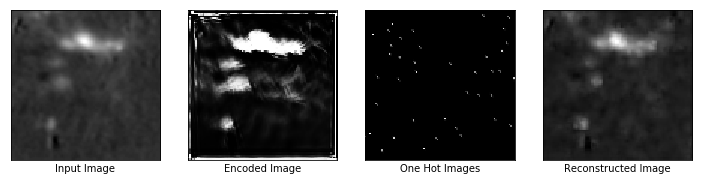

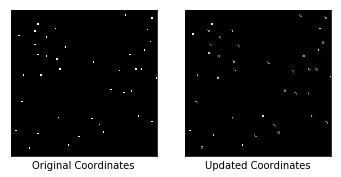

Epochs: 1760, Loss: 0.0009114398853853345
Similarity scores: [0.00489039 0.04725682 0.03070248 0.09830128 0.08264577 0.06032726
 0.00253588 0.01773843 0.03706214 0.03077604 0.00147069 0.04984359
 0.15139212 0.10165062 0.0708413  0.27361414 0.13851787 0.05033392
 0.02786299 0.00102157 0.06440283 0.00299451 0.01537829 0.0711836
 0.05371405 0.01036867 0.00561116 0.03418769 0.23308212 0.18859485
 0.04445987 0.04048227 0.99979734 0.00460813 0.6387007  0.2753019
 0.02225809 0.04104563 0.02823084 0.38992548]
Updated Coordinates: [[[0.93164754 0.12032539]]]
Gradient min:-0.0004701445286627859, max:0.00045065488666296005



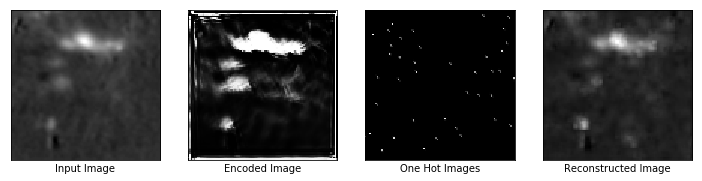

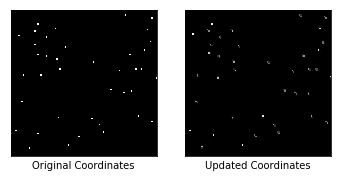

Epochs: 1770, Loss: 0.0009908683132380247
Similarity scores: [2.8274402e-03 4.1452087e-02 2.9124606e-02 9.6315756e-02 9.0442307e-02
 5.5108286e-02 3.5478619e-03 1.6565580e-02 6.6488788e-02 2.7513642e-02
 9.0653525e-04 3.9251279e-02 1.6381581e-01 9.2179857e-02 6.9368757e-02
 2.0154063e-01 1.6963801e-01 4.6775874e-02 2.5773287e-02 1.0135706e-03
 2.8072586e-02 2.7491213e-03 1.7917525e-02 6.4258292e-02 4.6861496e-02
 1.3355734e-02 4.9722455e-03 2.9189993e-02 2.0082998e-01 1.0526128e-01
 4.5501333e-02 3.4712624e-02 9.9980235e-01 4.7819018e-03 6.0542035e-01
 2.1274741e-01 2.5255607e-02 4.1178010e-02 2.7719818e-02 3.5890800e-01]
Updated Coordinates: [[[0.9313818  0.12055007]]]
Gradient min:-0.0005563378799706697, max:0.0003576213784981519



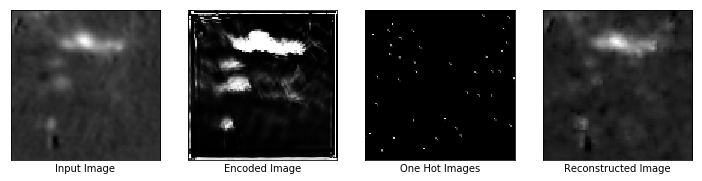

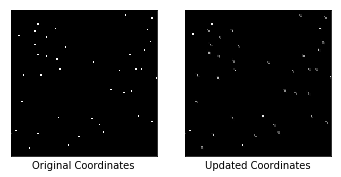

Epochs: 1780, Loss: 0.0011975476518273354
Similarity scores: [0.00225784 0.03555457 0.01730036 0.07167289 0.07036088 0.03628226
 0.00307571 0.00852567 0.04422773 0.0193447  0.00125283 0.02766334
 0.11354294 0.06605218 0.05823006 0.22500205 0.08268451 0.02953161
 0.01407311 0.0010147  0.01808309 0.00126762 0.00490937 0.02946454
 0.03428282 0.0069198  0.00345538 0.01978387 0.17146115 0.13908531
 0.03329808 0.024579   0.9998847  0.00242535 0.57848114 0.16280204
 0.01261662 0.02294602 0.01417668 0.27197975]
Updated Coordinates: [[[0.93151873 0.12045462]]]
Gradient min:-0.0006160071352496743, max:0.00013731996295973659



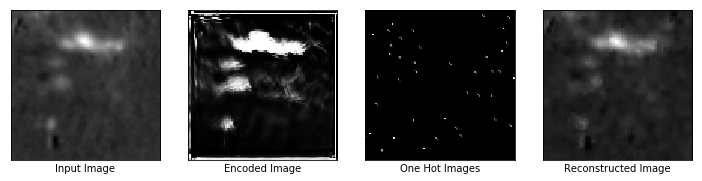

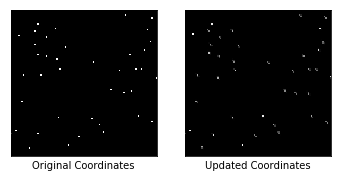

Epochs: 1790, Loss: 0.0009137644083239138
Similarity scores: [4.1983700e-03 4.4726733e-02 2.7332971e-02 8.3501101e-02 8.5014358e-02
 5.0529640e-02 3.4082243e-03 1.5995955e-02 1.7219695e-01 2.5399847e-02
 7.0871570e-04 4.1577201e-02 1.4638160e-01 8.4129401e-02 8.0615714e-02
 2.4198604e-01 1.2593234e-01 4.0958237e-02 2.0300720e-02 1.0290004e-03
 3.0231010e-02 2.2343332e-03 8.8081975e-03 4.8387080e-02 4.3249071e-02
 8.9742932e-03 5.3346530e-03 3.5204485e-02 1.9962738e-01 1.8264221e-01
 4.4507015e-02 3.7257034e-02 9.9976325e-01 4.1723968e-03 5.8732110e-01
 2.6325497e-01 3.1255588e-02 4.1794542e-02 2.3776038e-02 3.5814315e-01]
Updated Coordinates: [[[0.93132603 0.1205371 ]]]
Gradient min:-0.0004898873739875853, max:0.00013021289487369359



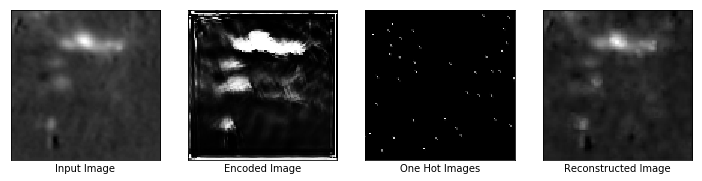

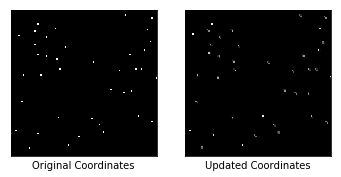

Epochs: 1800, Loss: 0.0009306022548116744
Similarity scores: [0.00466497 0.03892697 0.02968395 0.09388493 0.09310546 0.05841589
 0.00234241 0.0213624  0.3516865  0.03152141 0.00223941 0.05217089
 0.15558246 0.09020116 0.08441774 0.25311992 0.1349484  0.04736757
 0.02680523 0.00102901 0.02252592 0.00300279 0.00731338 0.06878677
 0.04901791 0.01252416 0.00659707 0.04923091 0.21016723 0.13095748
 0.04274489 0.0387587  0.9997992  0.00582919 0.66264653 0.30677536
 0.04046432 0.04786653 0.02813301 0.4086577 ]
Updated Coordinates: [[[0.9314169  0.12050688]]]
Gradient min:-0.000753900792915374, max:0.0004674693336710334



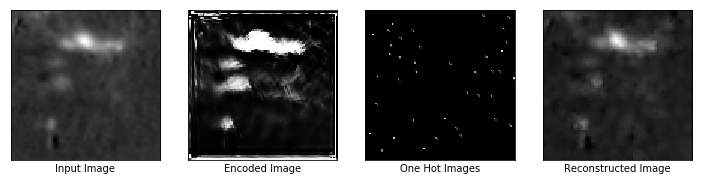

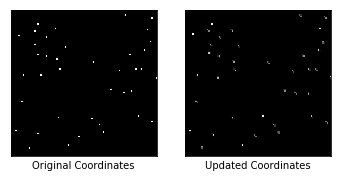

Epochs: 1810, Loss: 0.0009479245054535568
Similarity scores: [3.00389226e-03 5.13320751e-02 3.56966257e-02 1.13194145e-01
 1.12447701e-01 6.72664642e-02 1.88922381e-03 1.59028526e-02
 2.40560174e-01 3.60248238e-02 8.15119303e-04 4.69911657e-02
 1.82555541e-01 1.03556976e-01 7.49385059e-02 2.52984554e-01
 1.29310980e-01 5.58078289e-02 3.81535143e-02 1.05351384e-03
 3.47825214e-02 3.14023998e-03 1.69971734e-02 7.43969604e-02
 6.50122315e-02 1.07267760e-02 9.06980969e-03 3.71230133e-02
 2.62665182e-01 1.45278931e-01 4.68521640e-02 4.32623439e-02
 9.99513566e-01 5.46585256e-03 6.53398097e-01 3.15162003e-01
 5.02979234e-02 3.76566499e-02 3.45871486e-02 4.17023301e-01]
Updated Coordinates: [[[0.9315606 0.1205076]]]
Gradient min:-0.0005426611751317978, max:0.00020158964616712183



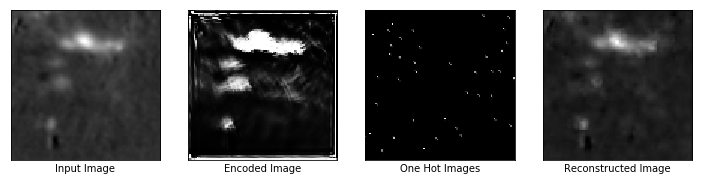

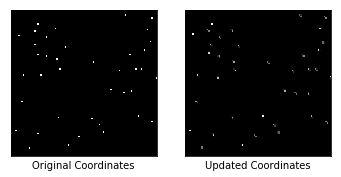

Epochs: 1820, Loss: 0.0008495334768667817
Similarity scores: [5.4536653e-03 6.7189515e-02 2.4781380e-02 8.8306785e-02 1.0088326e-01
 4.7407430e-02 3.5719809e-03 1.5057003e-02 2.4899498e-01 2.9595412e-02
 5.0771504e-04 6.5218911e-02 1.5503913e-01 1.2012303e-01 7.4542157e-02
 2.7476281e-01 1.4991024e-01 4.7114518e-02 3.2444920e-02 1.0628584e-03
 3.7044965e-02 2.3116437e-03 8.9147845e-03 4.8634447e-02 6.5493949e-02
 1.1807616e-02 6.8235067e-03 2.4374021e-02 2.1515271e-01 1.9775991e-01
 5.3535037e-02 4.3325610e-02 9.9905598e-01 5.7784379e-03 6.3154358e-01
 4.0842164e-01 3.8065601e-02 3.8609393e-02 3.6082990e-02 3.4925479e-01]
Updated Coordinates: [[[0.931812   0.12065589]]]
Gradient min:-0.0003086800570599735, max:0.00021792229381389916



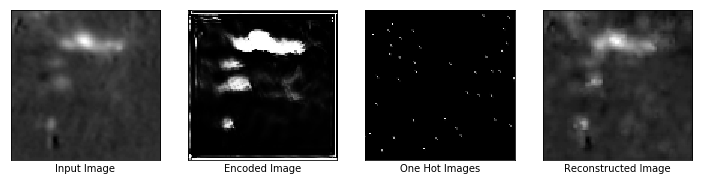

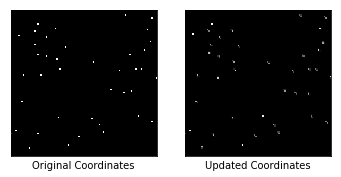

Epochs: 1830, Loss: 0.001424290705472231
Similarity scores: [7.5812079e-04 1.4408444e-02 5.3448635e-03 3.0098051e-02 4.4779304e-02
 1.2865928e-02 5.1671546e-03 3.0215927e-03 5.4582828e-01 5.0197714e-03
 2.4689077e-03 1.0872746e-02 6.9345251e-02 4.1731920e-02 3.7579209e-02
 1.3969614e-01 4.1625395e-02 1.2103788e-02 7.7593825e-03 1.0254231e-03
 6.3910368e-03 2.1475505e-04 3.1042920e-04 1.2381399e-02 1.9292111e-02
 1.6695259e-03 6.8872061e-04 5.3417338e-03 1.2537804e-01 2.9653125e-02
 1.7221363e-02 8.1964200e-03 9.9994230e-01 9.1894215e-04 6.4326650e-01
 1.1070627e-01 9.2284214e-03 1.2921745e-02 8.2824063e-03 2.3325777e-01]
Updated Coordinates: [[[0.9314606  0.12049924]]]
Gradient min:-0.000622064690105617, max:0.00012826485908590257



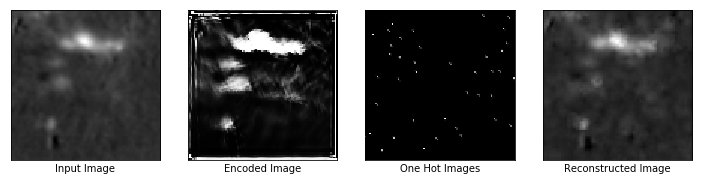

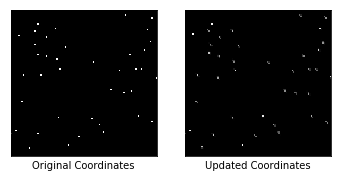

Epochs: 1840, Loss: 0.000984896789304912
Similarity scores: [0.00357343 0.05038276 0.02358445 0.08875082 0.11855483 0.05130601
 0.00279043 0.02242932 0.2882657  0.02749438 0.00174455 0.0957948
 0.12059662 0.12281348 0.10457923 0.3415692  0.16757838 0.04043817
 0.0275106  0.00102041 0.05415835 0.0028232  0.00865084 0.03692599
 0.04705628 0.0100802  0.00487652 0.03106977 0.2187488  0.16841626
 0.04152903 0.04590115 0.9994141  0.00873586 0.56867754 0.40091416
 0.01784487 0.06526096 0.05229288 0.31197697]
Updated Coordinates: [[[0.9315783  0.12094785]]]
Gradient min:-0.0005744196241721511, max:0.0007116695633158088



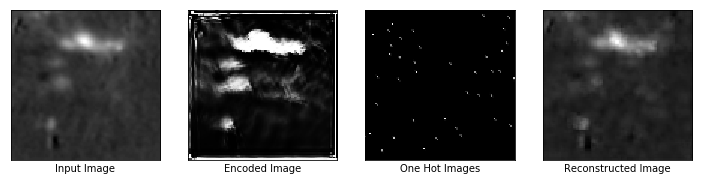

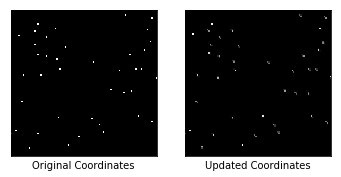

Epochs: 1850, Loss: 0.0008815994369797409
Similarity scores: [0.00279796 0.03934757 0.02739321 0.09211876 0.10923182 0.05478885
 0.00263133 0.02218385 0.06261525 0.02879586 0.00201475 0.0743534
 0.14751455 0.10907838 0.11741487 0.2835361  0.16684712 0.04354136
 0.03108567 0.00102086 0.03480343 0.00293981 0.00721038 0.04851459
 0.04918983 0.01137852 0.00538067 0.02710542 0.22239023 0.18827552
 0.04261709 0.04249374 0.9989465  0.00706769 0.6108862  0.41196513
 0.01950693 0.05981311 0.04434293 0.33937255]
Updated Coordinates: [[[0.9315907  0.12090226]]]
Gradient min:-3.7885063647991046e-05, max:0.000410988723160699



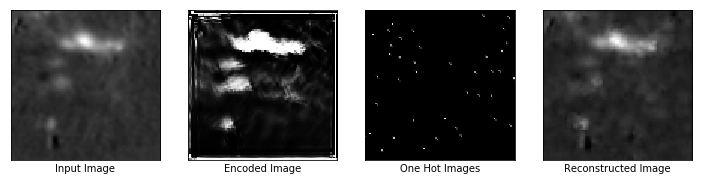

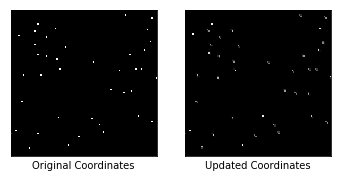

Epochs: 1860, Loss: 0.0008420443627983332
Similarity scores: [0.00314236 0.03749399 0.0302821  0.09743235 0.11411432 0.06164613
 0.00349882 0.02239139 0.11875009 0.03154998 0.00247725 0.07629541
 0.16195545 0.10823766 0.11356366 0.27383688 0.16332458 0.04539992
 0.02818836 0.00101981 0.02730835 0.00322565 0.01046636 0.05166822
 0.05478949 0.01200037 0.00502102 0.03314121 0.22529586 0.17077343
 0.04775925 0.04072888 0.9992894  0.00756655 0.6057575  0.40023854
 0.02056223 0.06312715 0.04118928 0.36347586]
Updated Coordinates: [[[0.931577   0.12064043]]]
Gradient min:-0.00038450362626463175, max:0.0004042164364363998



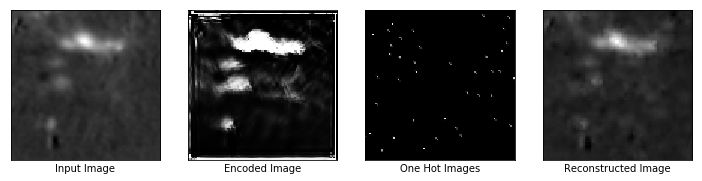

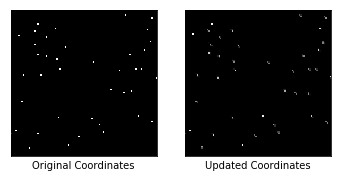

Epochs: 1870, Loss: 0.0008730411645956337
Similarity scores: [0.00348538 0.04122573 0.02461516 0.08343457 0.1038418  0.04662745
 0.00330993 0.01818072 0.10098938 0.02797487 0.00596483 0.06393663
 0.14397717 0.09667753 0.09690291 0.23967633 0.14042851 0.04138059
 0.02680949 0.00102058 0.01949676 0.00276928 0.00743524 0.03422911
 0.04851521 0.01066787 0.00550035 0.02366348 0.20984887 0.09942156
 0.06030491 0.0386882  0.99885404 0.00638569 0.5725694  0.40645164
 0.01959036 0.04904538 0.03597153 0.3342326 ]
Updated Coordinates: [[[0.931629   0.12040516]]]
Gradient min:-0.0004029389820061624, max:0.00040307751623913646



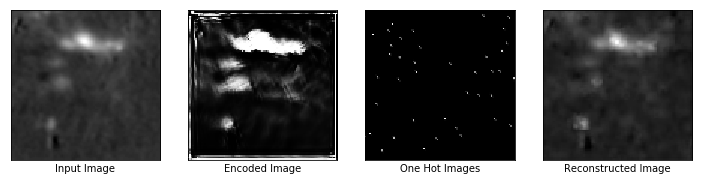

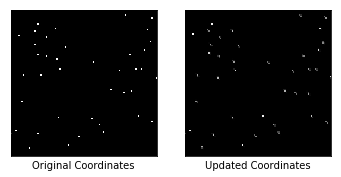

Epochs: 1880, Loss: 0.0009760868852026761
Similarity scores: [0.00295444 0.04382495 0.02957987 0.08265992 0.09917585 0.05427765
 0.00174848 0.02183382 0.18431757 0.02925227 0.00122328 0.08207474
 0.1659209  0.12372614 0.11803759 0.30028307 0.17425606 0.05043572
 0.03513056 0.00101921 0.0511876  0.00272171 0.05966806 0.06003709
 0.05841457 0.00941575 0.00608593 0.02827066 0.23015848 0.11055823
 0.05098691 0.04246506 0.9991275  0.01002769 0.6431002  0.27042428
 0.02917044 0.05933942 0.05556318 0.3575299 ]
Updated Coordinates: [[[0.9315794  0.12044463]]]
Gradient min:-7.788484799675643e-05, max:0.0006280062953010201



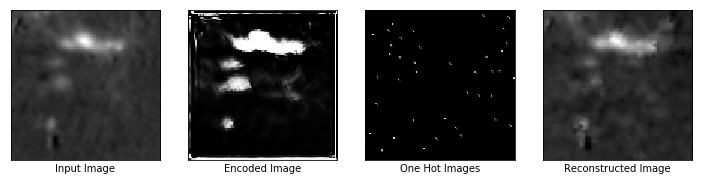

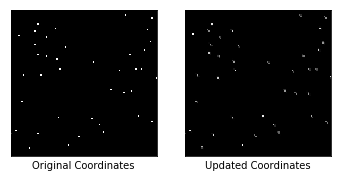

Epochs: 1890, Loss: 0.0013497119070962071
Similarity scores: [1.1201760e-03 1.8478094e-02 1.0767565e-02 3.8541116e-02 4.3577552e-02
 2.5731131e-02 1.8004882e-04 6.6854367e-03 3.2911792e-02 9.3730185e-03
 1.1349440e-03 3.1776953e-02 9.6521974e-02 4.9731065e-02 4.5242831e-02
 1.9209965e-01 9.0443566e-02 1.8388985e-02 1.6546782e-02 1.0214907e-03
 1.9153174e-02 8.0538634e-04 1.2568508e-03 2.2242785e-02 2.5652442e-02
 2.3988644e-03 1.8959048e-03 8.8124350e-03 1.3546886e-01 6.1029207e-02
 2.6982989e-02 1.1351825e-02 9.9991995e-01 1.9901912e-03 6.5102398e-01
 3.3626291e-01 1.1233567e-02 1.8020166e-02 1.1752220e-02 2.6712769e-01]
Updated Coordinates: [[[0.93170446 0.12015349]]]
Gradient min:-0.0007139121298678219, max:0.0007257824181579053



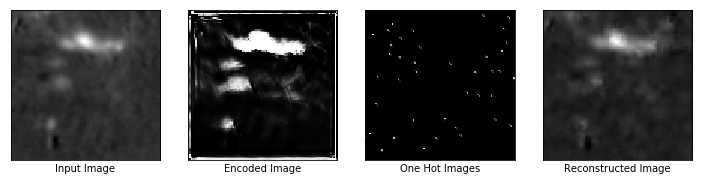

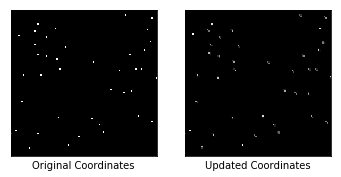

Epochs: 1900, Loss: 0.0010809231316670775
Similarity scores: [0.00162497 0.02815288 0.02067968 0.06564923 0.05388375 0.04362964
 0.00124767 0.0119773  0.09230916 0.01926964 0.00225994 0.03609155
 0.12035876 0.0488168  0.06866054 0.24813081 0.10721459 0.02936318
 0.01584435 0.00103398 0.03036323 0.00164923 0.00582323 0.03777909
 0.03437268 0.00930249 0.00359046 0.01755005 0.17929165 0.14100333
 0.04215089 0.02056915 0.9998586  0.00284433 0.6063079  0.32044294
 0.01371354 0.0330171  0.01699938 0.3347849 ]
Updated Coordinates: [[[0.9316533  0.12026337]]]
Gradient min:-0.0009381779236719012, max:0.00012769074237439781



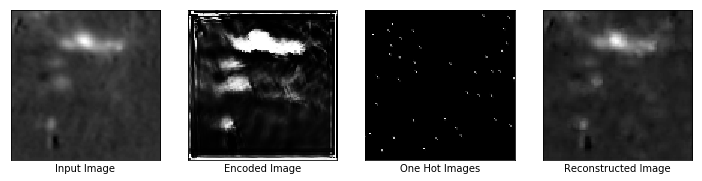

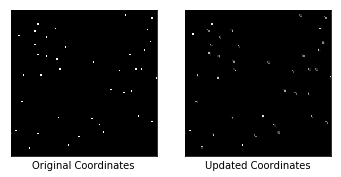

Epochs: 1910, Loss: 0.0008885909337550402
Similarity scores: [3.8463410e-03 3.8633041e-02 3.3504698e-02 9.5052280e-02 8.8228151e-02
 6.2747315e-02 2.4189334e-03 2.4458624e-02 1.7796364e-01 3.2539304e-02
 7.3672680e-04 5.8722623e-02 1.3150078e-01 9.1537222e-02 1.0428016e-01
 3.0296811e-01 1.5657642e-01 4.6186868e-02 2.7256208e-02 1.0179596e-03
 5.3580575e-02 4.0073888e-03 1.5232849e-02 4.9994212e-02 5.1745910e-02
 1.1733266e-02 6.3635809e-03 2.7836876e-02 2.2259203e-01 2.3246227e-01
 4.4241495e-02 4.1274540e-02 9.9977779e-01 6.2610866e-03 6.1587775e-01
 3.4251058e-01 1.6162144e-02 5.2799683e-02 3.5205096e-02 3.6632070e-01]
Updated Coordinates: [[[0.93169904 0.12039466]]]
Gradient min:-0.000492485414724797, max:0.0004429816617630422



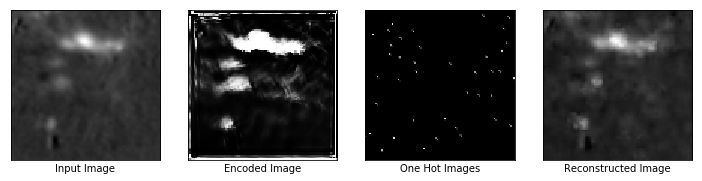

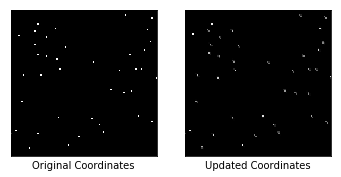

Epochs: 1920, Loss: 0.0009631668217480183
Similarity scores: [2.36749835e-03 4.79612611e-02 2.72779316e-02 9.43139195e-02
 1.00686714e-01 5.39199300e-02 1.27187138e-03 1.57196689e-02
 2.54862279e-01 2.69316472e-02 6.39750040e-04 4.08201069e-02
 1.53191492e-01 9.23904181e-02 7.38822892e-02 2.45715186e-01
 1.31978408e-01 4.92513143e-02 2.88878325e-02 1.01872929e-03
 4.08300161e-02 2.42095767e-03 1.13546439e-02 4.48036417e-02
 5.34284450e-02 8.79270304e-03 4.20838967e-03 3.89829986e-02
 2.19150648e-01 1.45346045e-01 4.60330099e-02 3.90070900e-02
 9.99858499e-01 4.20170790e-03 6.68739915e-01 2.04656586e-01
 3.43880169e-02 4.04047742e-02 3.39673199e-02 3.80279839e-01]
Updated Coordinates: [[[0.9318497  0.12038675]]]
Gradient min:-0.0007037698524072766, max:0.0004958700155839324



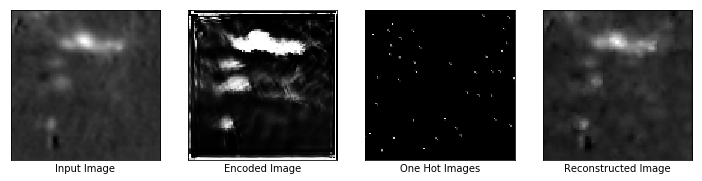

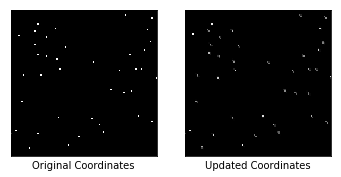

Epochs: 1930, Loss: 0.0010439840843901038
Similarity scores: [2.3046860e-03 3.9614566e-02 3.1550001e-02 9.8835677e-02 8.1364207e-02
 6.1988533e-02 2.8318733e-03 1.8195136e-02 8.9498460e-02 3.2133229e-02
 5.0550728e-04 5.5275414e-02 1.4761256e-01 8.1457406e-02 8.5679792e-02
 2.7388066e-01 1.2420426e-01 5.0459549e-02 2.6074881e-02 1.0164854e-03
 3.9914384e-02 2.5521957e-03 1.6327539e-02 6.1896805e-02 5.0687406e-02
 1.2094564e-02 6.0278098e-03 3.4955107e-02 2.2068265e-01 1.7932813e-01
 3.8993325e-02 4.4116843e-02 9.9985111e-01 5.3898431e-03 6.4512938e-01
 2.4303778e-01 3.3132765e-02 4.2596206e-02 3.2632519e-02 3.7339485e-01]
Updated Coordinates: [[[0.9319547  0.12051862]]]
Gradient min:-0.0005722996429540217, max:0.0005834907060489058



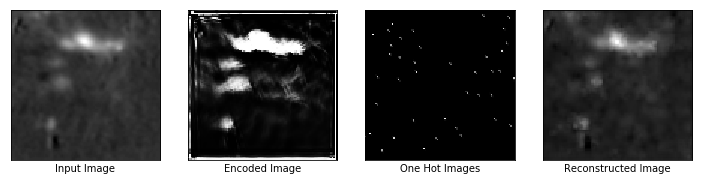

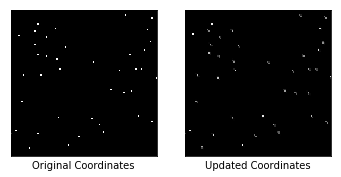

Epochs: 1940, Loss: 0.0009367938037030399
Similarity scores: [0.0018208  0.03091735 0.02603416 0.0866643  0.07943575 0.04707389
 0.00284634 0.0176193  0.02620708 0.02505821 0.00109858 0.05295167
 0.12340496 0.09309536 0.09012457 0.27086973 0.11770746 0.03286592
 0.0240496  0.00101573 0.02923216 0.00238493 0.00731558 0.05370985
 0.03195185 0.00999559 0.0042848  0.02814061 0.20777638 0.15532833
 0.03707073 0.03286987 0.9998883  0.00445198 0.65071714 0.2476364
 0.02010199 0.04333155 0.03312003 0.34433365]
Updated Coordinates: [[[0.9318497  0.12057903]]]
Gradient min:-0.000298868166282773, max:0.0004090676666237414



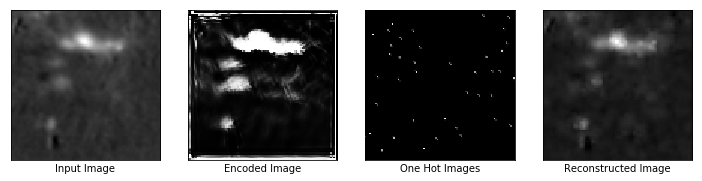

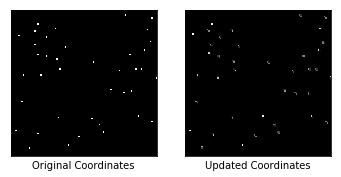

Epochs: 1950, Loss: 0.0012141107581555843
Similarity scores: [0.00272241 0.03494454 0.02633363 0.07622828 0.09800397 0.0426498
 0.00379798 0.01744194 0.11339943 0.0239286  0.00119317 0.04688371
 0.12673634 0.10017906 0.08312707 0.26557562 0.1250899  0.03747733
 0.0305113  0.00101489 0.02798638 0.00272789 0.02543669 0.05410588
 0.03542022 0.00810676 0.00564749 0.02803859 0.20090505 0.11491118
 0.04447097 0.03062221 0.99979293 0.00409472 0.6038998  0.20229512
 0.01561344 0.03944965 0.04120275 0.30487257]
Updated Coordinates: [[[0.93194056 0.12044442]]]
Gradient min:-0.0011106730671599507, max:0.00033770385198295116



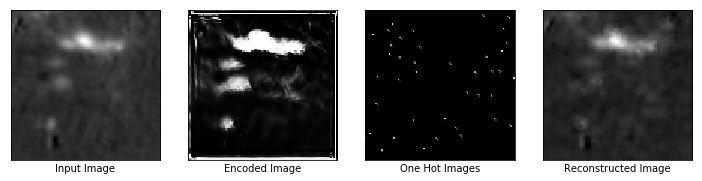

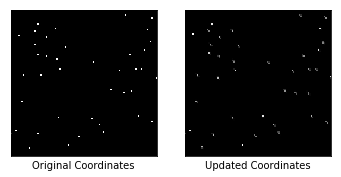

Epochs: 1960, Loss: 0.0009364411234855652
Similarity scores: [0.00155691 0.03955954 0.02303248 0.07553433 0.07714891 0.04533026
 0.0040365  0.01628338 0.05408427 0.02187511 0.00307105 0.04733529
 0.126351   0.09332824 0.0819923  0.2488406  0.14504766 0.03591907
 0.02558049 0.00102509 0.02755509 0.00252672 0.00730874 0.03787525
 0.03562935 0.00756731 0.00509691 0.02934373 0.17875935 0.16652973
 0.04675062 0.03508386 0.99960333 0.0040564  0.5899639  0.3597157
 0.02086637 0.04200038 0.03040381 0.30104703]
Updated Coordinates: [[[0.9315789  0.12050011]]]
Gradient min:-0.00031360037974081933, max:0.0004466442624107003



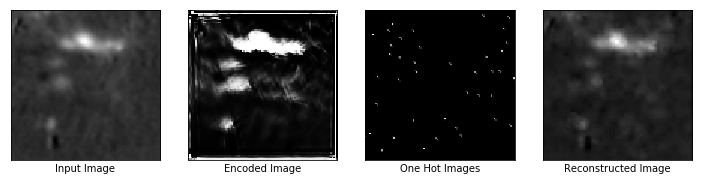

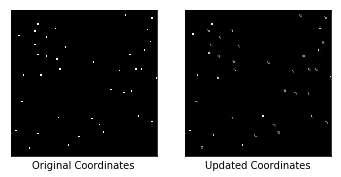

Epochs: 1970, Loss: 0.0010154459159821272
Similarity scores: [0.00427267 0.03963725 0.03195644 0.09646332 0.09033475 0.05956235
 0.0040199  0.02079281 0.0938896  0.030332   0.00425722 0.06766754
 0.13018219 0.10135487 0.09385713 0.27151185 0.1240743  0.04316762
 0.03111732 0.00102033 0.02968205 0.00345538 0.01228113 0.04406483
 0.04780749 0.01316043 0.00646451 0.030533   0.23032689 0.21061881
 0.05388704 0.03873964 0.9997815  0.00622992 0.5818306  0.28633815
 0.02759581 0.04959523 0.03414746 0.3176517 ]
Updated Coordinates: [[[0.93178976 0.12023946]]]
Gradient min:-0.0007913911831565201, max:0.00015955808339640498



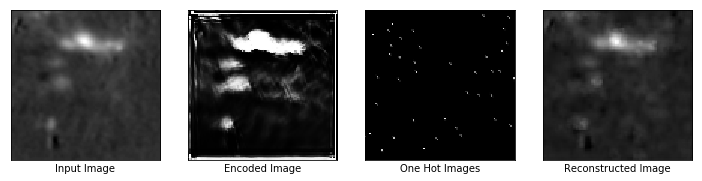

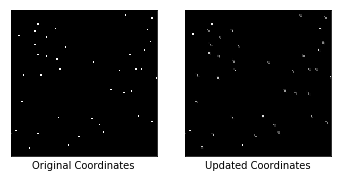

Epochs: 1980, Loss: 0.0009057496208697557
Similarity scores: [0.00368814 0.04813277 0.02708601 0.09102656 0.08293954 0.05126986
 0.00479228 0.01518284 0.15229467 0.02770979 0.00107442 0.06339841
 0.15810117 0.09821992 0.0885548  0.28602487 0.13312036 0.04669529
 0.0323194  0.00101557 0.03187828 0.00254427 0.02508923 0.04698413
 0.05484818 0.00888639 0.00497333 0.03246125 0.22838959 0.19812354
 0.05531146 0.04848395 0.9993961  0.00714467 0.5969843  0.32958898
 0.03319436 0.04364009 0.03626684 0.36206883]
Updated Coordinates: [[[0.931518   0.12047907]]]
Gradient min:-0.0005518949474208057, max:0.0007032975554466248



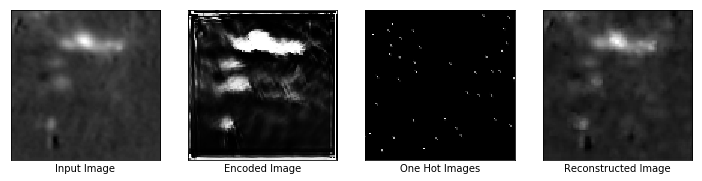

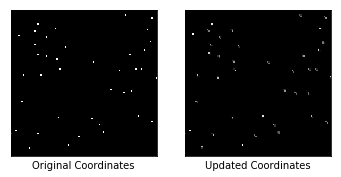

Epochs: 1990, Loss: 0.0008074506768025458
Similarity scores: [0.00334085 0.04893646 0.03265196 0.10380104 0.08175575 0.06262293
 0.00216736 0.02347748 0.17606212 0.03501284 0.00385611 0.07095904
 0.1598189  0.11022817 0.0920186  0.27767095 0.13606468 0.05208522
 0.03398362 0.00101558 0.03817427 0.00432414 0.01876921 0.05932614
 0.052771   0.01399278 0.00714413 0.03751716 0.23438735 0.16986047
 0.05926658 0.04336584 0.9995499  0.00714835 0.64238226 0.32019338
 0.02498638 0.05489345 0.0407997  0.3629322 ]
Updated Coordinates: [[[0.93182296 0.12028797]]]
Gradient min:-0.00026171220815740526, max:5.185757254366763e-05



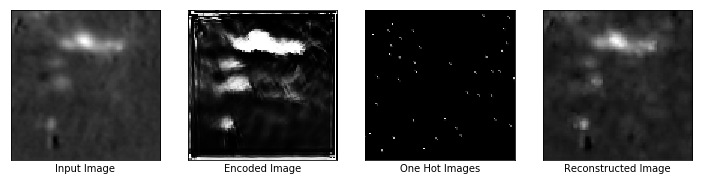

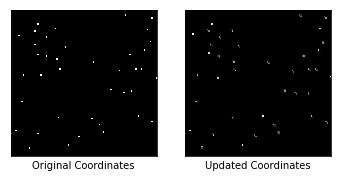

Epochs: 2000, Loss: 0.0008229400846175849
Similarity scores: [0.00231114 0.0491353  0.03397838 0.10260171 0.08336867 0.06356604
 0.00173808 0.02279171 0.24560392 0.03417632 0.00252748 0.07447609
 0.15893857 0.1221075  0.10552298 0.3355498  0.1568762  0.04877234
 0.03588581 0.00101467 0.03722373 0.00378619 0.02519833 0.07584426
 0.05125641 0.01159361 0.00714145 0.03580631 0.22308704 0.1679075
 0.05604447 0.04534304 0.9997697  0.00770992 0.6748495  0.31532973
 0.03489537 0.05429101 0.04630661 0.35944247]
Updated Coordinates: [[[0.9318153  0.12037777]]]
Gradient min:-0.000333019153913483, max:0.00011730275582522154


In [14]:
BATCH_SIZE = 8
MAX_EPOCHS = 2000
batch_imgs= tf.data.Dataset.from_tensor_slices(re_list).batch(BATCH_SIZE, drop_remainder=True)

#list to be append to output 
loss_list = []
input_imgs = []
coords_list = []
encoded_imgs = []
reconstructed_imgs = []
one_hot_imgs_list = []
similarity_list = []

captions_01 = ['Input Image', 'Encoded Image', 'One Hot Images','Reconstructed Image']
captions_02 = ['Original Coordinates', 'Updated Coordinates']

epochs = 1
while epochs <= MAX_EPOCHS:
    #reset coords for each epochs
#     coords,_, ori_one_hot_imgs = create_dat_samples(n_neurons)
#     coords = tf.reshape(coords, [n_neurons, 1,1,2])
    for steps, batched_imgs in enumerate(batch_imgs):
        loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction, grad_model  = train_fn(batched_imgs, coords, img_size, BATCH_SIZE)
    #loss is append for each epochs
    loss_list.append(loss)
    if epochs%10==0:
        img_row01 = [batched_imgs[0], encoder_output[0], stack4plot(one_hot_imgs), reconstruction[0]]
        img_row02 = [stack4plot(ori_one_hot_imgs), stack4plot(one_hot_imgs)]
        plot_comparison(img_row01, captions_01, n_col=len(img_row01), figsize = (10, 10))
        plot_comparison(img_row02, captions_02, n_col=len(img_row02))
        print("Epochs: {}, Loss: {}".format(epochs, loss.numpy()))
        print("Similarity scores: {}".format(similarity_score[0]))
        print("Updated Coordinates: {}".format(updated_coords[0]))
        print("Gradient min:{}, max:{}".format(np.min(grad_model[0]), np.max(grad_model[0])))
    #append list for every 100 epochs 
    if epochs%100==0:
        encoded_imgs.append(encoder_output)
        input_imgs.append(batched_imgs)
        coords_list.append(updated_coords)
        reconstructed_imgs.append(reconstruction)
        one_hot_imgs_list.append(one_hot_imgs)
        similarity_list.append(similarity_score)
        
    epochs+=1

----

# Save Output Data

In [33]:
# save_list = [loss_list, input_imgs, coords_list, encoded_imgs, reconstructed_imgs, one_hot_imgs_list, similarity_list]
# save_names = ['loss_list', 'input_imgs', 'coords_list', 'encoded_imgs', 'reconstructed_imgs', 'one_hot_imgs_list', 'similarity_list']

# for names, items in zip(save_names, save_list):
#     tensor = tf.convert_to_tensor(items, tf.float32)
#     np.save('npy/{}_full03.npy'.format(names), np.array(tensor))
    

In [51]:
# #save coords amd one hot images()
# np.save('npy/{}_full03.npy'.format('ori_coords'), np.array(coords))
# np.save('npy/{}_full03.npy'.format('ori_one_hot_imgs'), np.array(ori_one_hot_imgs))

---

# Visualization

In [5]:
coords_list_npy = np.load('npy/{}_full03.npy'.format('coords_list')) 
encoded_imgs_npy = np.load('npy/{}_full03.npy'.format('encoded_imgs'))
input_imgs_npy = np.load('npy/{}_full03.npy'.format('input_imgs'))
loss_list_npy = np.load('npy/{}_full03.npy'.format('loss_list'))
one_hot_imgs_list_npy = np.load('npy/{}_full03.npy'.format('one_hot_imgs_list'))
reconstructed_imgs_npy = np.load('npy/{}_full03.npy'.format('reconstructed_imgs'))
similarity_list_npy = np.load('npy/{}_full03.npy'.format('similarity_list'))
ori_coords_npy = np.load('npy/{}_full03.npy'.format('ori_coords'))
ori_one_hot_imgs_npy = np.load('npy/{}_full03.npy'.format('ori_one_hot_imgs'))

In [6]:
#load roi mask
roi_img = np.load('/home/kevinteng/Desktop/Manual_annotation/DG-13-3-8-17_ROImask.npy')
roi_img = cv2.resize(roi_img, (100, 100))
# plt.imshow(roi_img, cmap = 'gray')

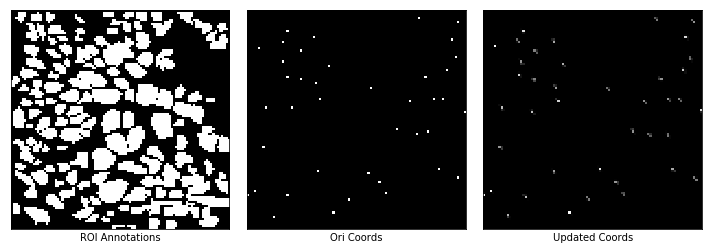

In [7]:
#comparison of roi and one hot images 
captions_03 = ['ROI Annotations', 'Ori Coords', 'Updated Coords']
img_row03 = [roi_img, stack4plot(ori_one_hot_imgs_npy), stack4plot(one_hot_imgs_list_npy[-1])]
plot_comparison(img_row03, captions_03, n_col=len(img_row03), figsize = (10, 10))

In [8]:
print(similarity_list_npy.shape)
print(one_hot_imgs_list_npy.shape)

(20, 8, 40)
(20, 40, 100, 100, 1)


In [24]:
def similarity_multiplication(n_neurons, epoch_pos):
    stack_batch_imgs = []
    for batch_similarity in similarity_list_npy[epoch_pos]:
        stack_imgs = np.zeros((100,100))
        for idx in range(n_neurons):
            test = batch_similarity[idx]*np.squeeze(one_hot_imgs_list_npy[epoch_pos, idx])
            stack_imgs+=test
        stack_batch_imgs.append(stack_imgs)
    return np.array(stack_batch_imgs) #(batch_size, img_size, img_size)

In [25]:
neuron_activations = similarity_multiplication(n_neurons, epoch_pos=-1)

In [21]:
reconstructed_imgs_npy.shape

(20, 8, 100, 100, 1)

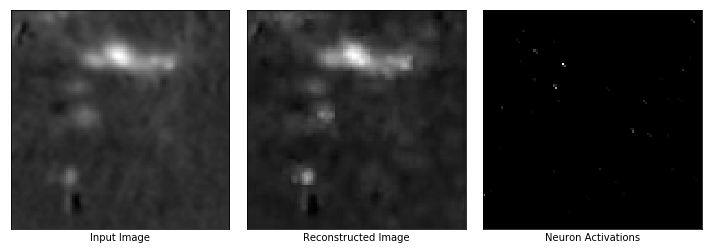

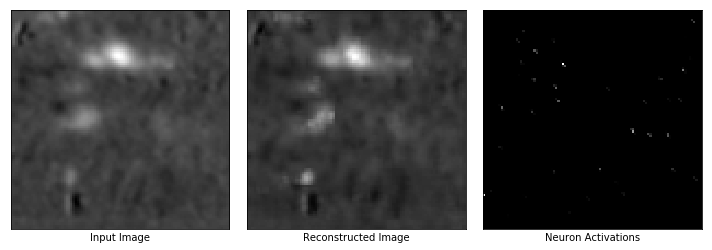

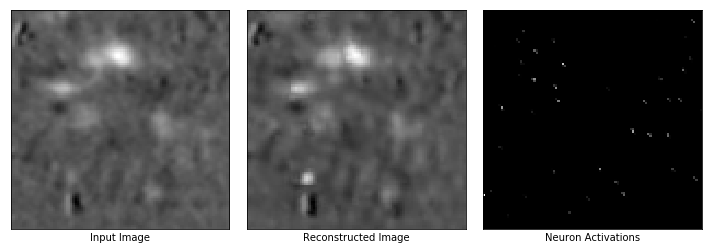

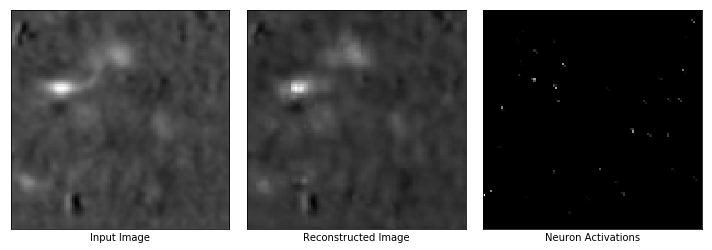

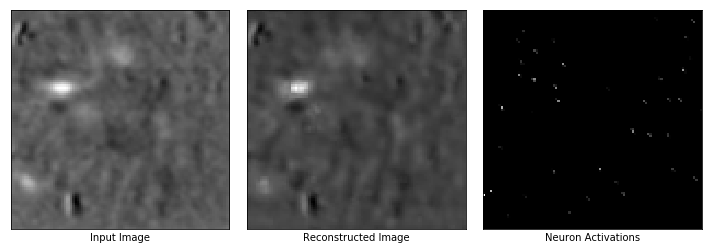

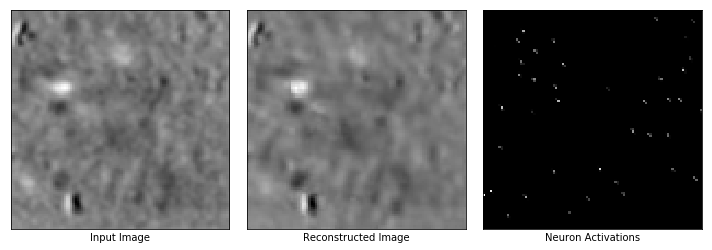

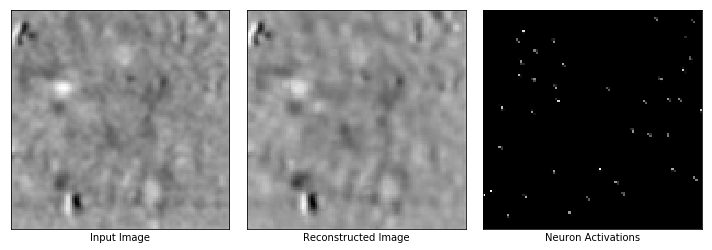

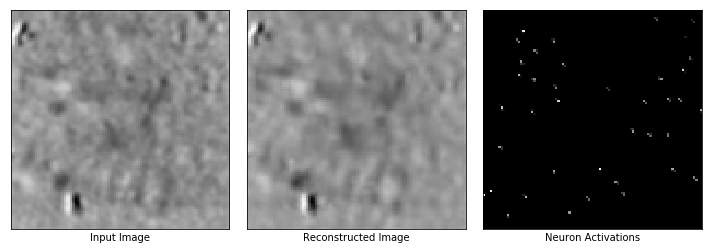

In [23]:
batch_size = 8
captions_03 = ['Input Image', 'Reconstructed Image','Neuron Activations']
for i in range(batch_size):
    img_row03 = [np.squeeze(input_imgs_npy[-1,i]), np.squeeze(reconstructed_imgs_npy[-1,i]), neuron_activations[i]]
    plot_comparison(img_row03, captions_03, n_col=len(img_row03), figsize = (10, 10))

In [ ]:
#checking coords of highest and lowest similarity score

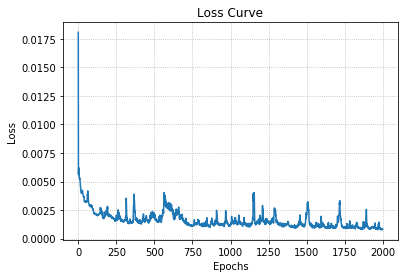

In [5]:
#plot loss
xlabel = 'Epochs'
ylabel = 'Loss'
title = 'Loss Curve'
utils_vis.plot_loss(loss_list_npy, xlabel, ylabel, title)